# Latincom 2025 - Anomaly Detection in Industrial IoT (IIoT)

Dataset: https://ieee-dataport.org/documents/bruriiot-dataset-network-anomaly-detection-iiot-enhanced-feature-engineering-approach



In [1]:
# install dependencies
!pip install xgboost pyimpetus Boruta

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.9/57.9 kB 2.2 MB/s eta 0:00:00


## Downloading dataset

In [ ]:
# download BRUIIoT.csv from drive
!gdown --id 18jejnWLvTJkUnzCGDsU9xaeNIDS2i0G1

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=18jejnWLvTJkUnzCGDsU9xaeNIDS2i0G1
From (redirected): https://drive.google.com/uc?id=18jejnWLvTJkUnzCGDsU9xaeNIDS2i0G1&confirm=t&uuid=1b9e5204-2207-4a6d-be6b-b967db715b38
To: /content/BRUIIoT.csv
100% 3.00G/3.00G [00:41<00:00, 71.8MB/s]


## 1. Import libraries

In [1]:
import polars as pl
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif, RFE
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from xgboost import XGBClassifier
from boruta import BorutaPy
from PyImpetus import PPIMBC

import os
import pickle
import time
from tqdm.notebook import tqdm

%matplotlib inline

SEED = 2025

In [2]:
def train_xgboost(X_train, y_train, X_valid, y_valid, method_name=None, file_name='xgb.pkl'):
    # clf = XGBClassifier(n_estimators=1000, max_depth=8, learning_rate=0.01, random_state=SEED)
    clf = XGBClassifier(random_state=SEED, n_jobs=-1)
    clf.fit(X_train, y_train)

    # predictions
    y_pred = clf.predict(X_valid)

    # generate and display the confusion matrix
    cm = confusion_matrix(y_valid, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(labels.values()))
    disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
    plt.title(f'Confusion matrix: {method_name}')
    plt.show()

    # metrics
    acc = accuracy_score(y_valid, y_pred)
    precision = precision_score(y_valid, y_pred, average='macro')
    recall = recall_score(y_valid, y_pred, average='macro')
    f1 = f1_score(y_valid, y_pred, average='macro')
    
    # feature importance
    df_importance = pd.DataFrame(
        zip(clf.get_booster().feature_names, clf.feature_importances_), 
        columns=['feature', 'importance']
    ).sort_values(by=['importance'], ascending=False)
    if df_importance.shape[0] > 20:  # for visibility
        df_importance = df_importance.iloc[:20]

    print('Test accuracy:', acc)
    print('Test precision:', precision)
    print('Test recall:', recall)
    print('Test f1-score:', f1)
    
    sns.barplot(df_importance, x='importance', y='feature')
    plt.title(f'XGBoost feature importance (gain) - {method_name}')
    plt.show()

    # save model to disk
    pickle.dump(clf, open(file_name, "wb"))
    
    return pd.DataFrame({
        'model': [method_name],
        'accuracy': [acc],
        'precision': [precision],
        'recall': [recall],
        'f1-score': [f1],
    })

## 2. Loading dataset

In [2]:
# load dataset with Polars
df = pl.read_csv('./data/BRUIIoT.csv')
print(df.shape)

(2776422, 267)


In [3]:
total_rows = df.shape[0]
print(f'There are {total_rows} total observations.')

There are 2776422 total observations.


In [4]:
# add index column
df = df.with_columns(pl.Series("index", list(range(total_rows))))
print(df.shape)
df.head()

(2776422, 268)


frame.time__calculate_duration,ip.src_host__nunique,ip.dst_host__nunique,arp.dst.proto_ipv4__nunique,arp.opcode__min,arp.opcode__max,arp.opcode__sum,arp.opcode__mean,arp.opcode__min_max_diff,arp.opcode__min_max_ratio,arp.opcode__min_max_product,arp.opcode__mean_square,arp.hw.size__min,arp.hw.size__max,arp.hw.size__sum,arp.hw.size__mean,arp.hw.size__min_max_diff,arp.hw.size__min_max_ratio,arp.hw.size__min_max_product,arp.hw.size__mean_square,arp.src.proto_ipv4__nunique,icmp.checksum__min,icmp.checksum__max,icmp.checksum__sum,icmp.checksum__mean,icmp.checksum__min_max_diff,icmp.checksum__min_max_ratio,icmp.checksum__min_max_product,icmp.checksum__mean_square,icmp.seq_le__min,icmp.seq_le__max,icmp.seq_le__sum,icmp.seq_le__mean,icmp.seq_le__min_max_diff,icmp.seq_le__min_max_ratio,icmp.seq_le__min_max_product,icmp.seq_le__mean_square,…,mqtt.hdrflags__nunique,mqtt.hdrflags__min_max_diff,mqtt.hdrflags__min_max_ratio,mqtt.hdrflags__min_max_product,mqtt.hdrflags__mean_square,mqtt.len__min,mqtt.len__max,mqtt.len__sum,mqtt.len__mean,mqtt.len__min_max_diff,mqtt.len__min_max_ratio,mqtt.len__min_max_product,mqtt.len__mean_square,mqtt.msg__nunique,mqtt.msgtype__nunique,mqtt.proto_len__min,mqtt.proto_len__max,mqtt.proto_len__sum,mqtt.proto_len__mean,mqtt.proto_len__min_max_diff,mqtt.proto_len__min_max_ratio,mqtt.proto_len__min_max_product,mqtt.proto_len__mean_square,mqtt.protoname__nunique,mqtt.topic__nunique,mqtt.topic_len__min,mqtt.topic_len__max,mqtt.topic_len__sum,mqtt.topic_len__mean,mqtt.topic_len__min_max_diff,mqtt.topic_len__min_max_ratio,mqtt.topic_len__min_max_product,mqtt.topic_len__mean_square,is_attack__most_frequent,attack_label_enc__most_frequent,attack_label__most_frequent,index
f64,i64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,i64,i64,i64,f64,i64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,i64,i64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,i64,i64,str,i64
0.000174,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,5356,63724,508734,25436.7,58368,11.895464,341305744,6.4703e8,39914.0,60551.0,1.15866e6,57933.0,20637.0,1.516999,2.4168e9,3.3562e9,…,1,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,4,"""ddos_smurf""",0
0.010008,1,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,14969,56911,662791,33139.55,41942,3.80167,851900759,1.0982e9,5285.0,40925.0,393236.0,19661.8,35640.0,7.742149,2.16288625e8,3.8659e8,…,1,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,4,"""ddos_smurf""",1
0.001801,13,10,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,31752,75228,3761.4,31752,31752.0,0,1.4148e7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,1,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,5,"""ddos_syn_flood""",2
0.002471,1,20,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,479,65241,790546,39527.3,64762,135.91875,31250439,1.5624e9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,1,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,5,"""ddos_syn_flood""",3
0.00535,3,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0.0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,1,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,"""ddos_http_flood""",4


## 3. Split into training (55%), feature selection (5%), validation (20%) and test (20%)

In [5]:
# get 20% random sample for test set
df_test = df.sample(n=int(total_rows*0.2), seed=SEED)
df_test.shape

(555284, 268)

In [6]:
# remove test from dataset
"""Google Colab may not have enough RAM memory"""
df = df.join(df_test, on=['index'], how='anti')

In [7]:
# get 20% random sample for validation set
df_valid = df.sample(n=int(total_rows*0.2), seed=SEED)
df_valid.shape

(555284, 268)

In [8]:
# remove validation from dataset
"""Google Colab may not have enough RAM memory"""
df = df.join(df_valid, on=['index'], how='anti')

In [9]:
# get 5% random sample for feature selection
df_fs = df.sample(n=int(total_rows*0.05), seed=SEED)
df_fs.shape

(138821, 268)

In [10]:
# use the remaining (55%) for training
"""Google Colab may not have enough RAM memory"""
df_train = df.join(df_fs, on=['index'], how='anti')

In [11]:
train_prop = df_train.shape[0] / total_rows
fs_prop = df_fs.shape[0] / total_rows
valid_prop = df_valid.shape[0] / total_rows
test_prop = df_test.shape[0] / total_rows

print('Training proportion:', train_prop)
print('Feature Selection proportion:', fs_prop)
print('Validation proportion:', valid_prop)
print('Test proportion:', test_prop)

Training proportion: 0.5500003241582151
Feature Selection proportion: 0.04999996398242054
Validation proportion: 0.19999985592968217
Test proportion: 0.19999985592968217


In [12]:
# save splits to disk
df_train.write_csv('./data/BRUIIoT_train.csv')
df_fs.write_csv('./data/BRUIIoT_fs.csv')
df_valid.write_csv('./data/BRUIIoT_valid.csv')
df_test.write_csv('./data/BRUIIoT_test.csv')

## 4. Preprocessing

### Preprocess attack labels

In [2]:
# restore splits
df_train = pl.read_csv('./data/BRUIIoT_train.csv')
df_fs = pd.read_csv('./data/BRUIIoT_fs.csv')
df_valid = pd.read_csv('./data/BRUIIoT_valid.csv')
df_test = pd.read_csv('./data/BRUIIoT_test.csv')

In [3]:
# original label indices
labels = list(set(zip(df_train['attack_label_enc__most_frequent'], df_train['attack_label__most_frequent'])))  # get encoding and label pairs
labels = {x[0]: x[1] for x in labels}  # to dict
labels = dict(sorted(labels.items()))  # order by key (enconding)
print('Original attack labels:')
labels

Original attack labels:


{0: 'Mirai-greeth_flood',
 1: 'ddos_http_flood',
 2: 'ddos_icmp_flood',
 3: 'ddos_slowloris',
 4: 'ddos_smurf',
 5: 'ddos_syn_flood',
 6: 'normal'}

New labels:
0. normal
1. Mirai-greeth_flood
2. ddos_icmp_flood
3. ddos_syn_flood
4. other_type_attack

In [4]:
# train
df_train = df_train.with_columns(pl.col('attack_label__most_frequent').replace({
    'ddos_http_flood': 'other_type_attack',
    'ddos_slowloris': 'other_type_attack',
    'ddos_smurf': 'other_type_attack',
}))
df_train = df_train.with_columns(pl.col('attack_label_enc__most_frequent').replace({
    0: 1,  # Mirai-greeth_flood
    1: 4,  # ddos_http_flood
    2: 2,  # ddos_icmp_flood
    3: 4,  # ddos_slowloris
    4: 4,  # ddos_smurf
    5: 3,  # ddos_syn_flood
    6: 0,  # normal
}))

In [5]:
# feature selection (fs)
df_fs['attack_label__most_frequent'] = df_fs['attack_label__most_frequent'].replace({
    'ddos_http_flood': 'other_type_attack',
    'ddos_slowloris': 'other_type_attack',
    'ddos_smurf': 'other_type_attack',
})
df_fs['attack_label_enc__most_frequent'] = df_fs['attack_label_enc__most_frequent'].replace({
    0: 1,  # Mirai-greeth_flood
    1: 4,  # ddos_http_flood
    2: 2,  # ddos_icmp_flood
    3: 4,  # ddos_slowloris
    4: 4,  # ddos_smurf
    5: 3,  # ddos_syn_flood
    6: 0,  # normal
})

In [6]:
# valid
df_valid['attack_label__most_frequent'] = df_valid['attack_label__most_frequent'].replace({
    'ddos_http_flood': 'other_type_attack',
    'ddos_slowloris': 'other_type_attack',
    'ddos_smurf': 'other_type_attack',
})
df_valid['attack_label_enc__most_frequent'] = df_valid['attack_label_enc__most_frequent'].replace({
    0: 1,  # Mirai-greeth_flood
    1: 4,  # ddos_http_flood
    2: 2,  # ddos_icmp_flood
    3: 4,  # ddos_slowloris
    4: 4,  # ddos_smurf
    5: 3,  # ddos_syn_flood
    6: 0,  # normal
})

In [7]:
# test
df_test['attack_label__most_frequent'] = df_test['attack_label__most_frequent'].replace({
    'ddos_http_flood': 'other_type_attack',
    'ddos_slowloris': 'other_type_attack',
    'ddos_smurf': 'other_type_attack',
})
df_test['attack_label_enc__most_frequent'] = df_test['attack_label_enc__most_frequent'].replace({
    0: 1,  # Mirai-greeth_flood
    1: 4,  # ddos_http_flood
    2: 2,  # ddos_icmp_flood
    3: 4,  # ddos_slowloris
    4: 4,  # ddos_smurf
    5: 3,  # ddos_syn_flood
    6: 0,  # normal
})

In [8]:
# map label indices
labels = list(set(zip(df_train['attack_label_enc__most_frequent'], df_train['attack_label__most_frequent'])))  # get encoding and label pairs
labels = {x[0]: x[1] for x in labels}  # to dict
labels = dict(sorted(labels.items()))  # order by key (enconding)
labels

{0: 'normal',
 1: 'Mirai-greeth_flood',
 2: 'ddos_icmp_flood',
 3: 'ddos_syn_flood',
 4: 'other_type_attack'}

Text(0.5, 1.0, 'Attack types distribution - training (before preprocessing)')

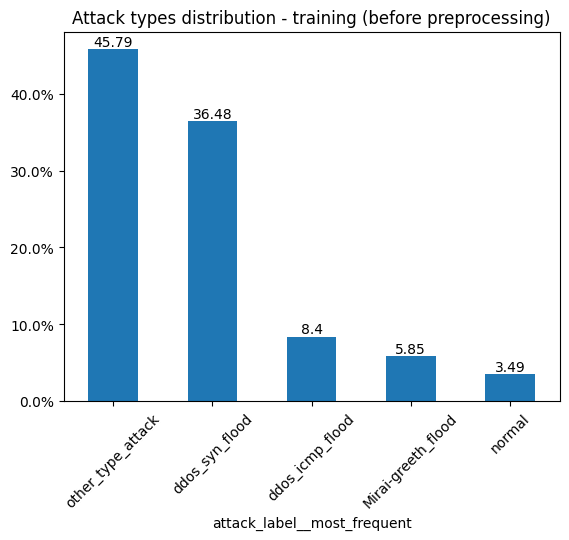

In [9]:
ax = df_train['attack_label__most_frequent'].to_pandas().value_counts(normalize=True).apply(lambda x: round(x*100, 2)).plot.bar(rot=45)

# add bar's labels
for container in ax.containers:
    ax.bar_label(container)
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.title('Attack types distribution - training (before preprocessing)')

Text(0.5, 1.0, 'Attack types distribution - Feature Selection')

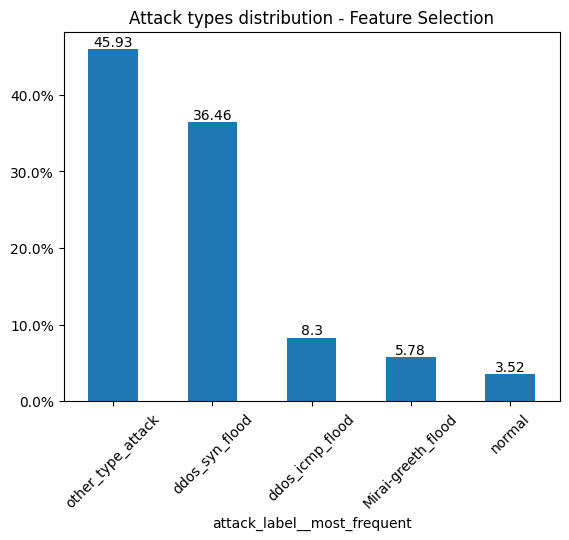

In [10]:
ax = df_fs['attack_label__most_frequent'].value_counts(normalize=True).apply(lambda x: round(x*100, 2)).plot.bar(rot=45)

# add bar's labels
for container in ax.containers:
    ax.bar_label(container)
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.title('Attack types distribution - Feature Selection')

Text(0.5, 1.0, 'Attack types distribution - valid')

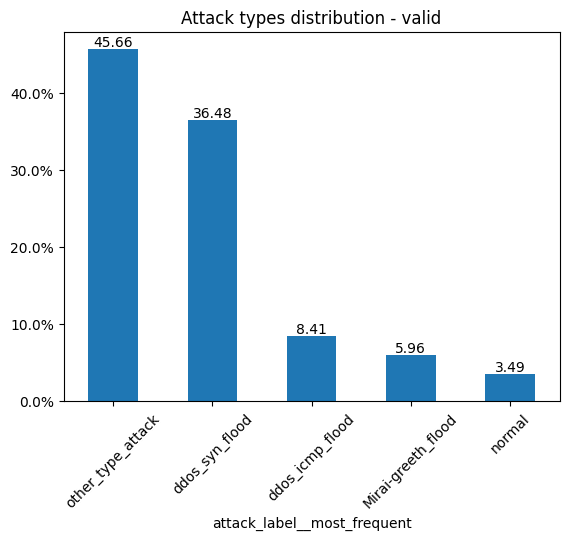

In [11]:
ax = df_valid['attack_label__most_frequent'].value_counts(normalize=True).apply(lambda x: round(x*100, 2)).plot.bar(rot=45)

# add bar's labels
for container in ax.containers:
    ax.bar_label(container)
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.title('Attack types distribution - valid')

Text(0.5, 1.0, 'Attack types distribution - test')

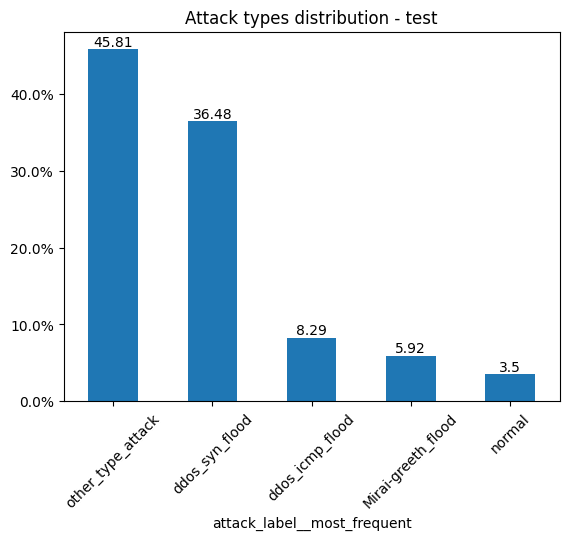

In [12]:
ax = df_test['attack_label__most_frequent'].value_counts(normalize=True).apply(lambda x: round(x*100, 2)).plot.bar(rot=45)

# add bar's labels
for container in ax.containers:
    ax.bar_label(container)
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.title('Attack types distribution - test')

### Balance class labels for training set using SMOTE

In [13]:
"""Google Colab may not have enough RAM memory"""
df_train_normal = df_train.filter(pl.col('attack_label__most_frequent') == 'normal')
df_train_mirai = df_train.filter(pl.col('attack_label__most_frequent') == 'Mirai-greeth_flood')
df_train_icmp = df_train.filter(pl.col('attack_label__most_frequent') == 'ddos_icmp_flood')
df_train_syn = df_train.filter(pl.col('attack_label__most_frequent') == 'ddos_syn_flood')
df_train_others = df_train.filter(pl.col('attack_label__most_frequent') == 'other_type_attack')

In [14]:
n_balance = int(df_train.shape[0]/5)
n_balance

305406

In [18]:
print(f'Has normal label more than {n_balance} to cut?', df_train_normal.shape[0] > n_balance)
print(f'Has mirai label more than {n_balance} to cut?', df_train_mirai.shape[0] > n_balance)
print(f'Has icmp label more than {n_balance} to cut?', df_train_icmp.shape[0] > n_balance)
print(f'Has syn label more than {n_balance} to cut?', df_train_syn.shape[0] > n_balance)
print(f'Has others label more than {n_balance} to cut?', df_train_others.shape[0] > n_balance)

Has normal label more than 305406 to cut? False
Has mirai label more than 305406 to cut? False
Has icmp label more than 305406 to cut? False
Has syn label more than 305406 to cut? True
Has others label more than 305406 to cut? True


In [19]:
df_train_syn = df_train_syn.sample(n_balance, seed=SEED)
df_train_others = df_train_others.sample(n_balance, seed=SEED)

In [20]:
df_train = pl.concat([
    df_train_normal,
    df_train_mirai,
    df_train_icmp,
    df_train_syn,
    df_train_others
], how='vertical')
print(df_train.shape)
df_train.head()

(881645, 268)


frame.time__calculate_duration,ip.src_host__nunique,ip.dst_host__nunique,arp.dst.proto_ipv4__nunique,arp.opcode__min,arp.opcode__max,arp.opcode__sum,arp.opcode__mean,arp.opcode__min_max_diff,arp.opcode__min_max_ratio,arp.opcode__min_max_product,arp.opcode__mean_square,arp.hw.size__min,arp.hw.size__max,arp.hw.size__sum,arp.hw.size__mean,arp.hw.size__min_max_diff,arp.hw.size__min_max_ratio,arp.hw.size__min_max_product,arp.hw.size__mean_square,arp.src.proto_ipv4__nunique,icmp.checksum__min,icmp.checksum__max,icmp.checksum__sum,icmp.checksum__mean,icmp.checksum__min_max_diff,icmp.checksum__min_max_ratio,icmp.checksum__min_max_product,icmp.checksum__mean_square,icmp.seq_le__min,icmp.seq_le__max,icmp.seq_le__sum,icmp.seq_le__mean,icmp.seq_le__min_max_diff,icmp.seq_le__min_max_ratio,icmp.seq_le__min_max_product,icmp.seq_le__mean_square,…,mqtt.hdrflags__nunique,mqtt.hdrflags__min_max_diff,mqtt.hdrflags__min_max_ratio,mqtt.hdrflags__min_max_product,mqtt.hdrflags__mean_square,mqtt.len__min,mqtt.len__max,mqtt.len__sum,mqtt.len__mean,mqtt.len__min_max_diff,mqtt.len__min_max_ratio,mqtt.len__min_max_product,mqtt.len__mean_square,mqtt.msg__nunique,mqtt.msgtype__nunique,mqtt.proto_len__min,mqtt.proto_len__max,mqtt.proto_len__sum,mqtt.proto_len__mean,mqtt.proto_len__min_max_diff,mqtt.proto_len__min_max_ratio,mqtt.proto_len__min_max_product,mqtt.proto_len__mean_square,mqtt.protoname__nunique,mqtt.topic__nunique,mqtt.topic_len__min,mqtt.topic_len__max,mqtt.topic_len__sum,mqtt.topic_len__mean,mqtt.topic_len__min_max_diff,mqtt.topic_len__min_max_ratio,mqtt.topic_len__min_max_product,mqtt.topic_len__mean_square,is_attack__most_frequent,attack_label_enc__most_frequent,attack_label__most_frequent,index
f64,i64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,i64,i64,i64,f64,i64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,i64,i64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,i64,i64,str,i64
0.114829,3,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0.0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,4,48,48.0,0,23.04,0.0,42.0,67.0,3.35,42.0,42.0,0.0,11.2225,2,2,0.0,4.0,4.0,0.2,4.0,4.0,0.0,0.04,2,2,0.0,14.0,14.0,0.7,14.0,14.0,0.0,0.49,0,0,"""normal""",14
0.065294,2,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0.0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,3,32,32.0,0,5.76,0.0,42.0,44.0,2.2,42.0,42.0,0.0,4.84,1,2,0.0,4.0,4.0,0.2,4.0,4.0,0.0,0.04,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,"""normal""",25
0.520329,2,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0.0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,2,48,48.0,0,23.04,0.0,23.0,46.0,2.3,23.0,23.0,0.0,5.29,3,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,2,0.0,14.0,28.0,1.4,14.0,14.0,0.0,1.96,0,0,"""normal""",57
0.477882,2,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0.0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,2,48,48.0,0,23.04,0.0,23.0,46.0,2.3,23.0,23.0,0.0,5.29,2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,2,0.0,14.0,28.0,1.4,14.0,14.0,0.0,1.96,0,0,"""normal""",72
0.436606,2,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0.0,0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,2,48,48.0,0,23.04,0.0,23.0,46.0,2.3,23.0,23.0,0.0,5.29,2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,2,0.0,14.0,28.0,1.4,14.0,14.0,0.0,1.96,0,0,"""normal""",120


In [23]:
# label columns
targets_cols = ['attack_label__most_frequent', 'attack_label_enc__most_frequent', 'is_attack__most_frequent']

# get features and labels
X_train = df_train.to_pandas().drop(columns=targets_cols+['index'])
y_train = df_train.to_pandas().loc[:, 'attack_label_enc__most_frequent']

In [24]:
# balance with SMOTE
sm = SMOTE(random_state=SEED)
X_res, y_res = sm.fit_resample(X_train, y_train)

In [30]:
df_train = pd.concat([X_res, y_res], axis=1)
print(df_train.shape)
df_train.head()

(1527030, 265)


,frame.time__calculate_duration,ip.src_host__nunique,ip.dst_host__nunique,arp.dst.proto_ipv4__nunique,arp.opcode__min,arp.opcode__max,arp.opcode__sum,arp.opcode__mean,arp.opcode__min_max_diff,arp.opcode__min_max_ratio,...,mqtt.topic__nunique,mqtt.topic_len__min,mqtt.topic_len__max,mqtt.topic_len__sum,mqtt.topic_len__mean,mqtt.topic_len__min_max_diff,mqtt.topic_len__min_max_ratio,mqtt.topic_len__min_max_product,mqtt.topic_len__mean_square,attack_label_enc__most_frequent
0,0.114829,3,4,1,0.0,0.0,0.0,0.0,0.0,0.0,...,2,0.0,14.0,14.0,0.7,14.0,14.0,0.0,0.49,0
1,0.065294,2,3,1,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0
2,0.520329,2,2,1,0.0,0.0,0.0,0.0,0.0,0.0,...,2,0.0,14.0,28.0,1.4,14.0,14.0,0.0,1.96,0
3,0.477882,2,2,1,0.0,0.0,0.0,0.0,0.0,0.0,...,2,0.0,14.0,28.0,1.4,14.0,14.0,0.0,1.96,0
4,0.436606,2,2,1,0.0,0.0,0.0,0.0,0.0,0.0,...,2,0.0,14.0,28.0,1.4,14.0,14.0,0.0,1.96,0


Text(0.5, 1.0, 'Attack types distribution - training (after preprocessing)')

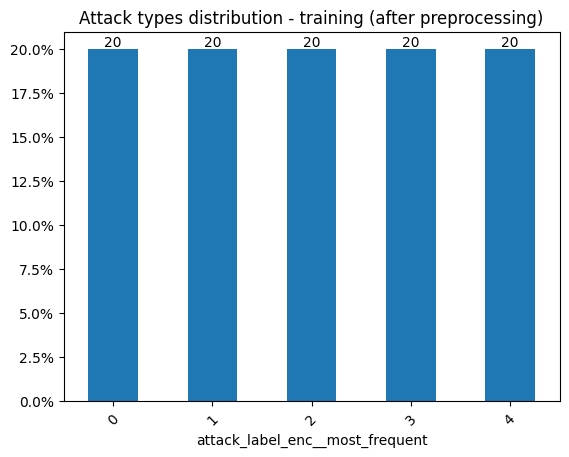

In [32]:
ax = df_train['attack_label_enc__most_frequent'].value_counts(normalize=True).apply(lambda x: round(x*100, 2)).plot.bar(rot=45)

# add bar's labels
for container in ax.containers:
    ax.bar_label(container)
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.title('Attack types distribution - training (after preprocessing)')

In [ ]:
# save preprocessed splits to disk
df_train.to_csv('./data/BRUIIoT_train_preprocessed.csv', index=False)
df_fs.to_csv('./data/BRUIIoT_fs_preprocessed.csv', index=False)
df_valid.to_csv('./data/BRUIIoT_valid_preprocessed.csv', index=False)
df_test.to_csv('./data/BRUIIoT_test_preprocessed.csv', index=False)

## 5. Data splits

In [3]:
# label columns
targets_cols = ['attack_label__most_frequent', 'attack_label_enc__most_frequent', 'is_attack__most_frequent']

In [4]:
# restore preprocessed data splits
df_train = pd.read_csv('./data/BRUIIoT_train_preprocessed.csv')
df_valid = pd.read_csv('./data/BRUIIoT_valid_preprocessed.csv')

# shuffle training set
df_train = df_train.sample(frac=1, random_state=SEED).reset_index(drop=True)

In [5]:
# map label indices
labels = list(set(zip(df_valid['attack_label_enc__most_frequent'], df_valid['attack_label__most_frequent'])))  # get encoding and label pairs
labels = {x[0]: x[1] for x in labels}  # to dict
labels = dict(sorted(labels.items()))  # order by key (enconding)
labels

{0: 'normal',
 1: 'Mirai-greeth_flood',
 2: 'ddos_icmp_flood',
 3: 'ddos_syn_flood',
 4: 'other_type_attack'}

In [6]:
# keep only protocols
df_train = df_train.drop(columns=['frame.time__calculate_duration'])
df_valid = df_valid.drop(columns=['frame.time__calculate_duration'])

In [7]:
# get features and targets
X_train = df_train.drop(columns=['attack_label_enc__most_frequent'])
X_valid = df_valid.drop(columns=targets_cols+['index'])

y_train = df_train.loc[:, 'attack_label_enc__most_frequent']
y_valid = df_valid.loc[:, 'attack_label_enc__most_frequent']

print('Training features size:', X_train.shape)
print('Validation features size:', X_valid.shape)
print('')
print('Training labels size:', y_train.shape)
print('Validation labels size:', y_valid.shape)

Training features size: (1527030, 263)
Validation features size: (555284, 263)

Training labels size: (1527030,)
Validation labels size: (555284,)


## 6. Training with all features

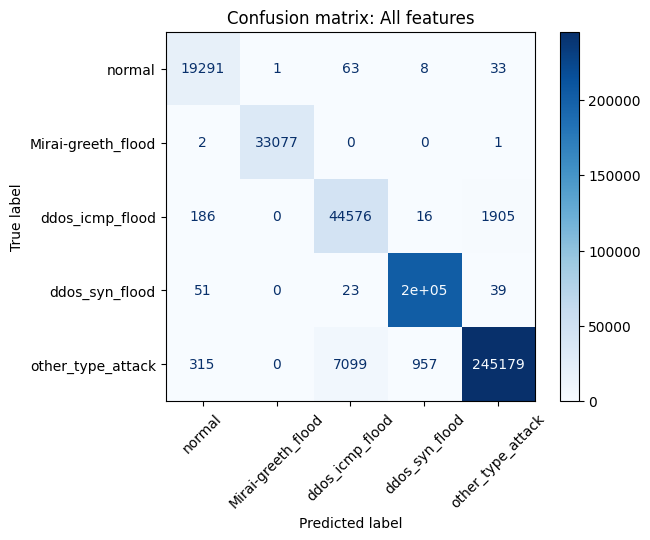

Test accuracy: 0.9807323819883159
Test precision: 0.9640834686083404
Test recall: 0.9831577235884067
Test f1-score: 0.973078790965492


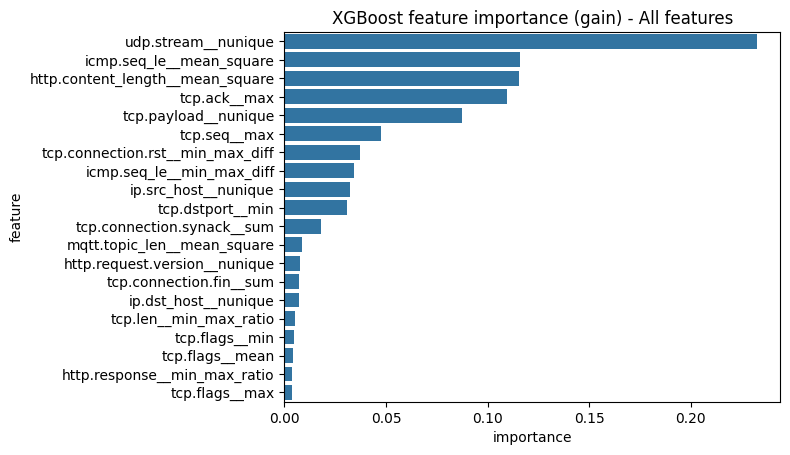

,model,accuracy,precision,recall,f1-score
0,All features,0.980732,0.964083,0.983158,0.973079


In [19]:
train_xgboost(
    X_train, y_train, 
    X_valid, y_valid, 
    method_name='All features', 
    file_name='all-features.pkl'
)

Best model (XGBoost) from authors:
- accuracy of 99.52%
- precision of 98.20%
- recall of 98.13%
- F1-score of 98.17%

## 7. Determining Sufficient Training set size

In [20]:
np.linspace(0.04, 1.0, num=20)**2

array([0.0016    , 0.00819501, 0.01989584, 0.03670249, 0.05861496,
       0.08563324, 0.11775734, 0.15498726, 0.19732299, 0.24476454,
       0.29731191, 0.3549651 , 0.4177241 , 0.48558892, 0.55855956,
       0.63663601, 0.71981828, 0.80810637, 0.90150028, 1.        ])

0.0016
(2443, 264)


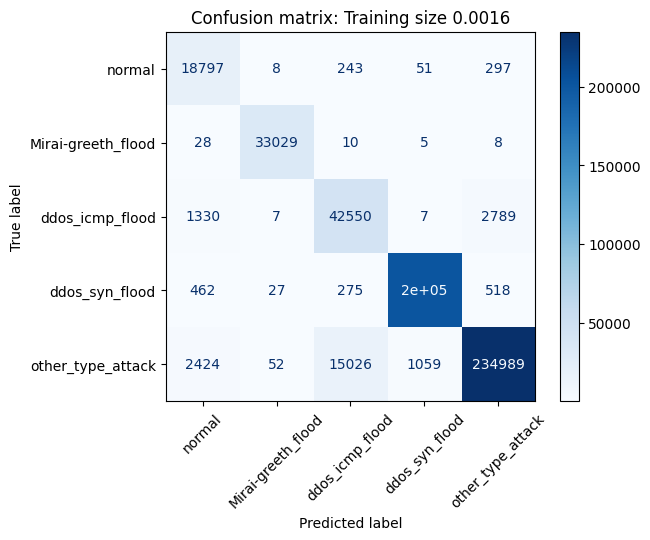

Test accuracy: 0.9556515224641805
Test precision: 0.9049189948029159
Test recall: 0.9599018622434607
Test f1-score: 0.9289644205817357


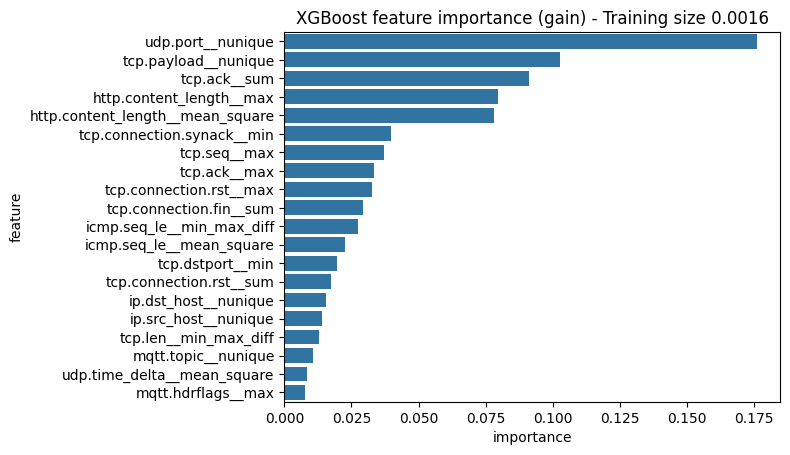

0.0082
(12521, 264)


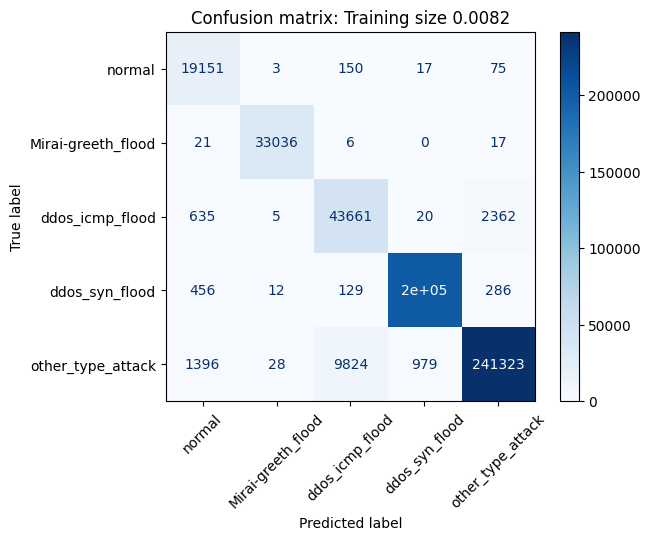

Test accuracy: 0.970427745081796
Test precision: 0.9357022238515063
Test recall: 0.9737443650840062
Test f1-score: 0.9532144149336856


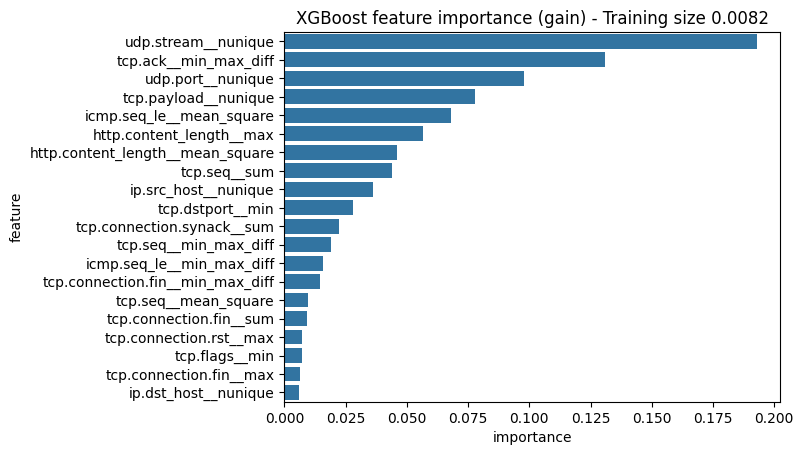

0.0199
(30387, 264)


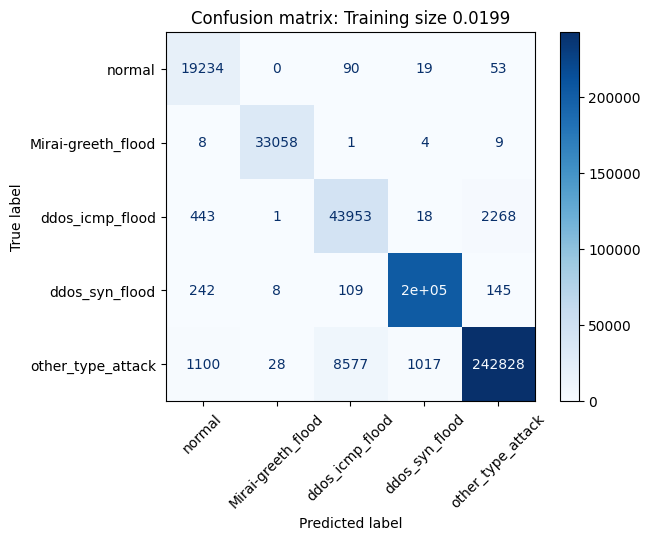

Test accuracy: 0.9745355529782957
Test precision: 0.9463721755479553
Test recall: 0.9775455382347007
Test f1-score: 0.9609381270605255


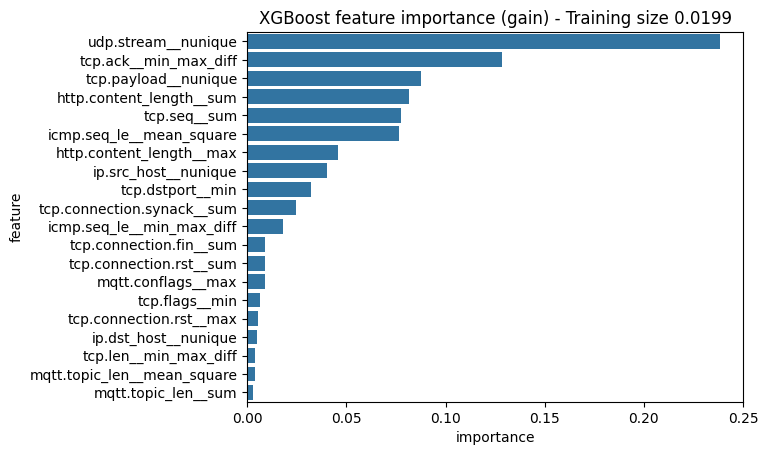

0.0367
(56042, 264)


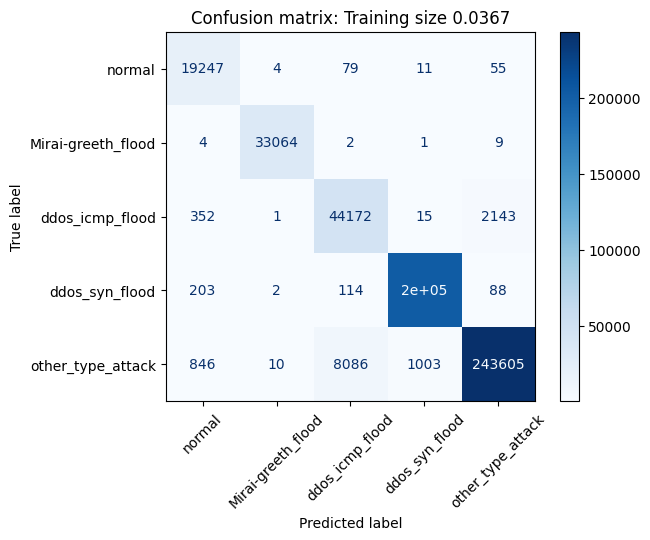

Test accuracy: 0.9765381318388429
Test precision: 0.9518354559002755
Test recall: 0.979362769095264
Test f1-score: 0.9647577758193975


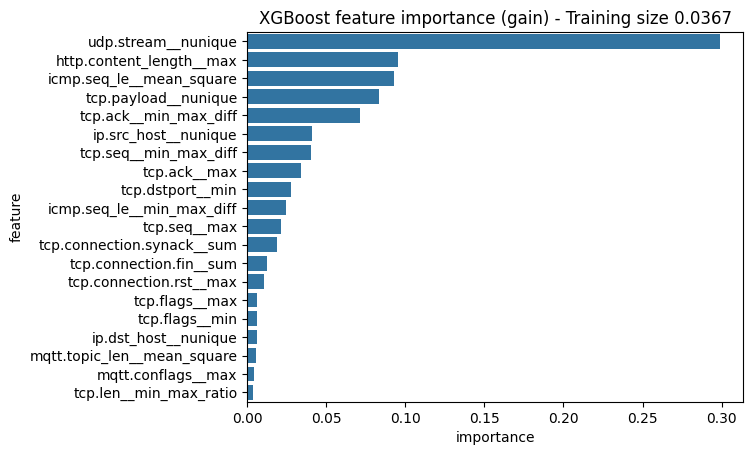

0.0586
(89483, 264)


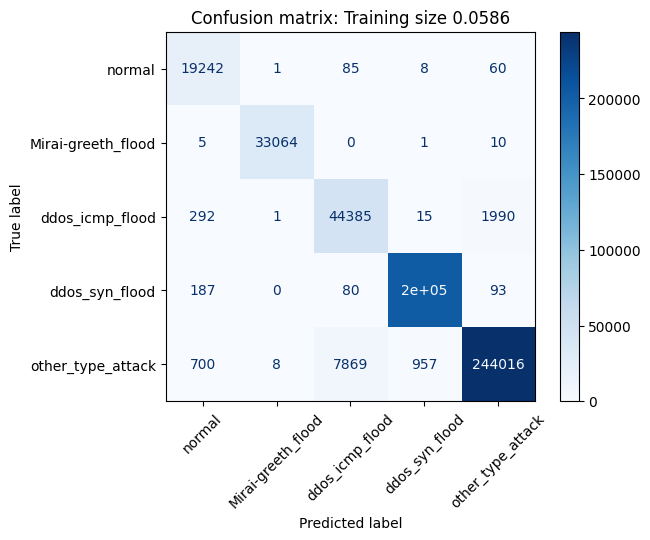

Test accuracy: 0.9777375180988467
Test precision: 0.9549786793807039
Test recall: 0.9805943488057555
Test f1-score: 0.967011855130423


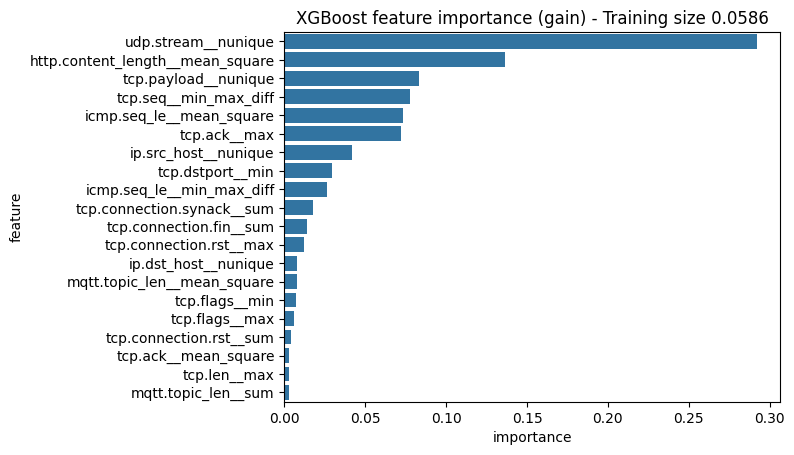

0.0856
(130713, 264)


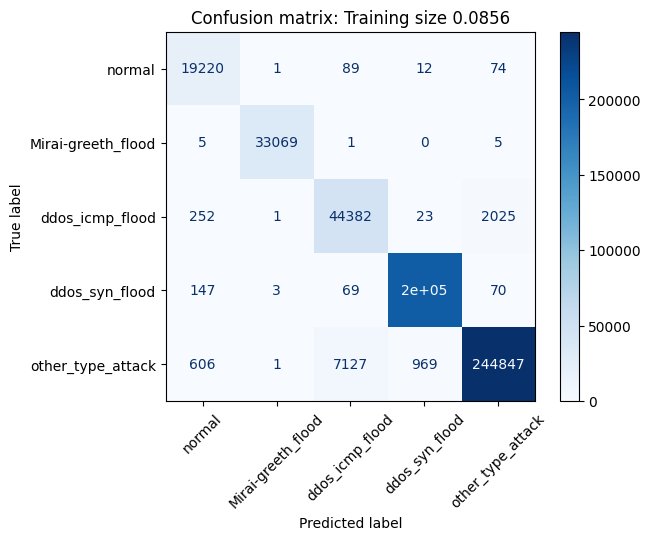

Test accuracy: 0.9793258944972303
Test precision: 0.9590274794131443
Test recall: 0.9811104645184663
Test f1-score: 0.9694841615365537


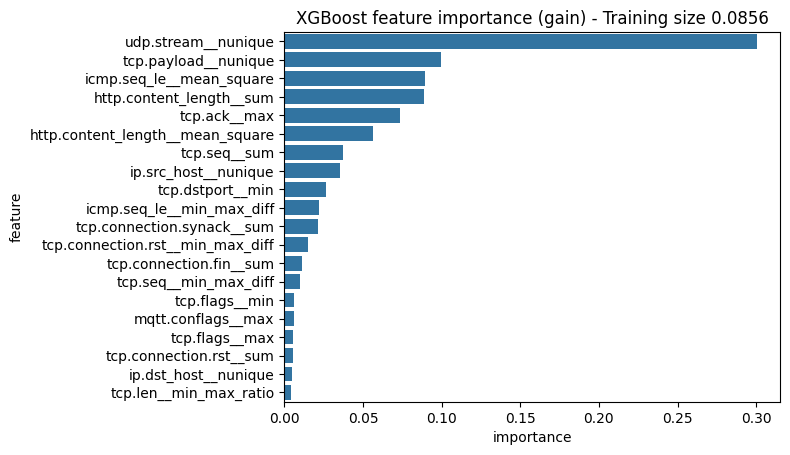

0.1178
(179884, 264)


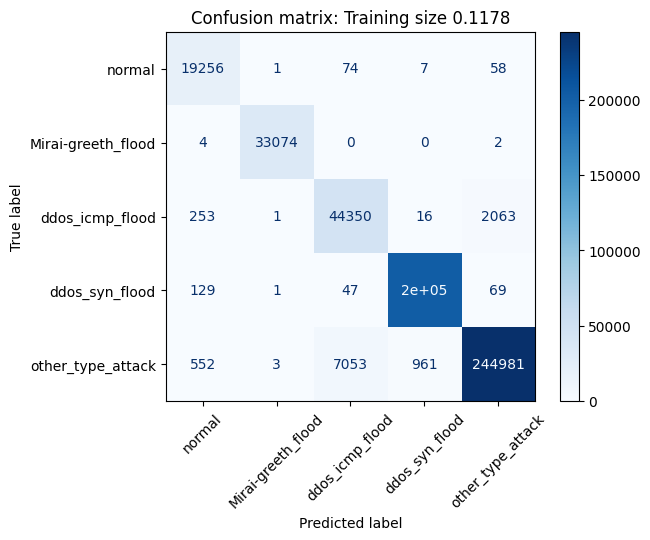

Test accuracy: 0.9796608582275016
Test precision: 0.9600849972313406
Test recall: 0.9815229624349552
Test f1-score: 0.9702524959685483


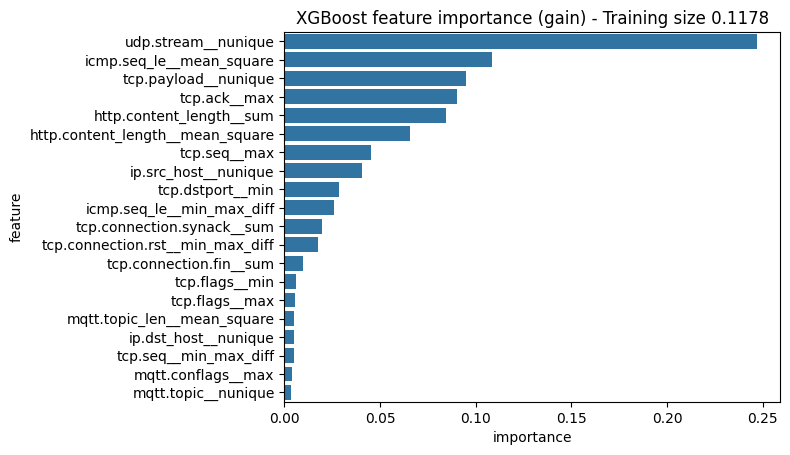

0.155
(236689, 264)


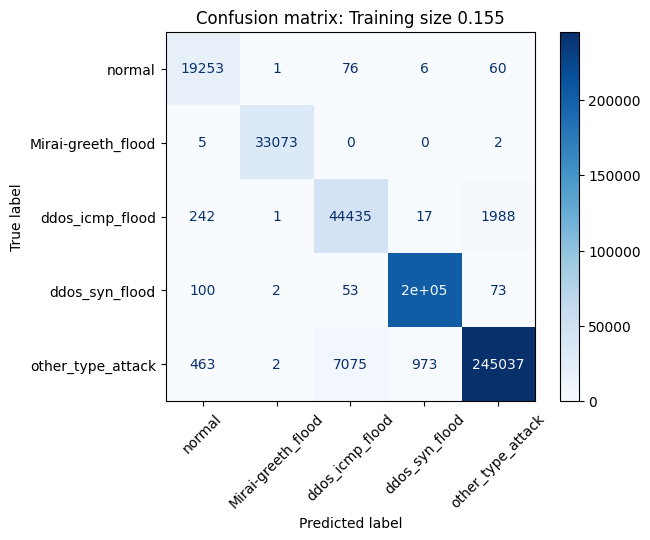

Test accuracy: 0.9799399946693944
Test precision: 0.9612902246506208
Test recall: 0.9819120844742425
Test f1-score: 0.971052303003276


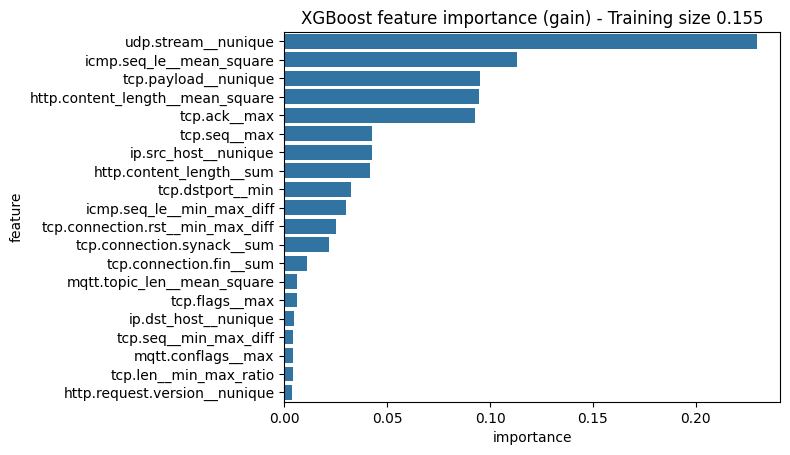

0.1973
(301283, 264)


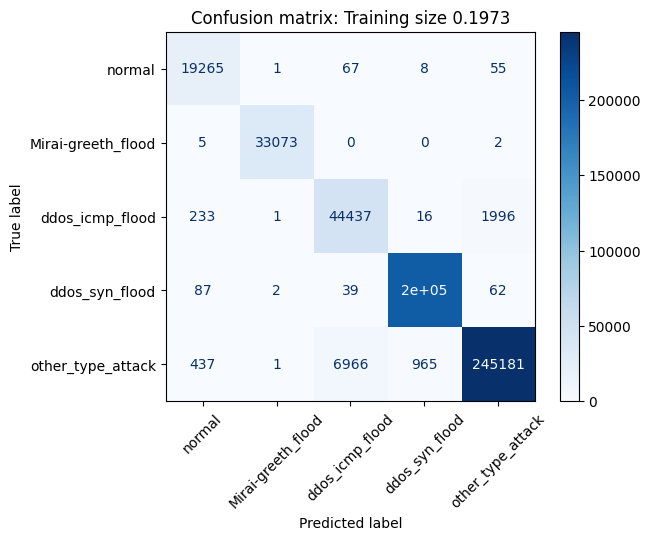

Test accuracy: 0.9802929672023685
Test precision: 0.9622176694532888
Test recall: 0.9821954937895423
Test f1-score: 0.9716868524443733


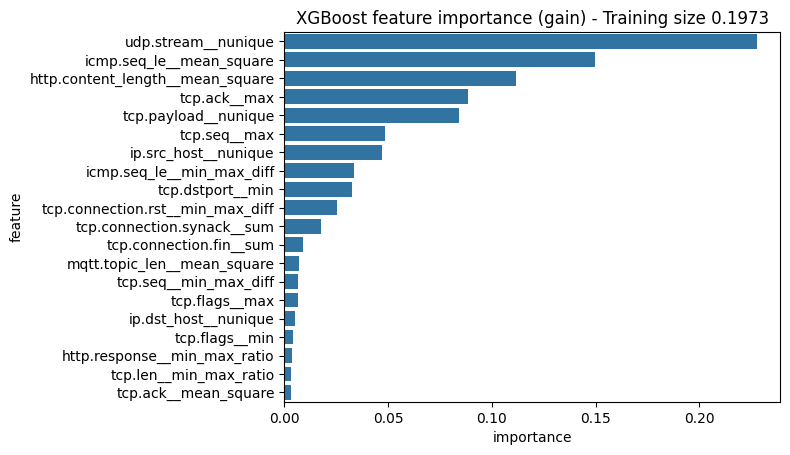

0.2448
(373816, 264)


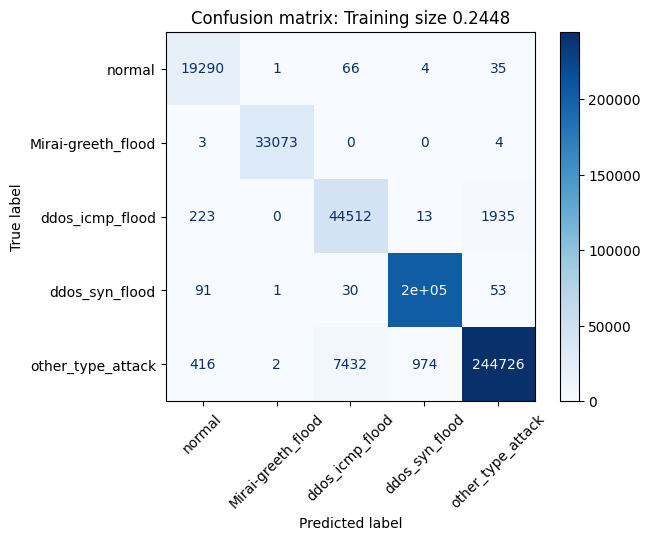

Test accuracy: 0.9796806679104746
Test precision: 0.9611052265280332
Test recall: 0.9824305007712262
Test f1-score: 0.9711487949909221


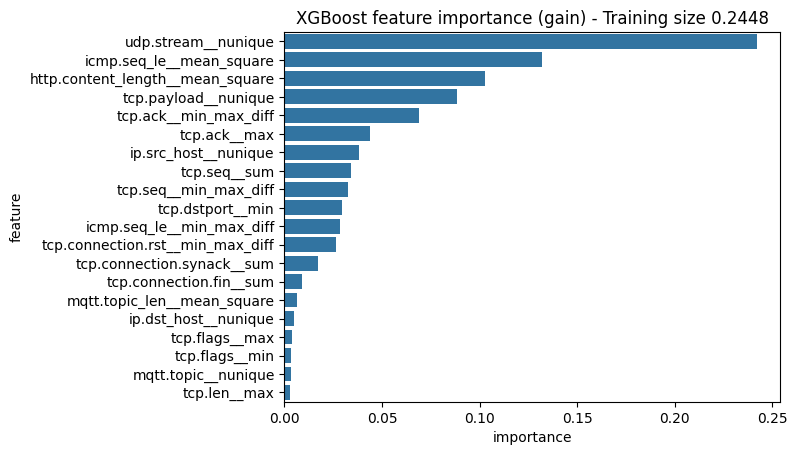

0.2973
(453986, 264)


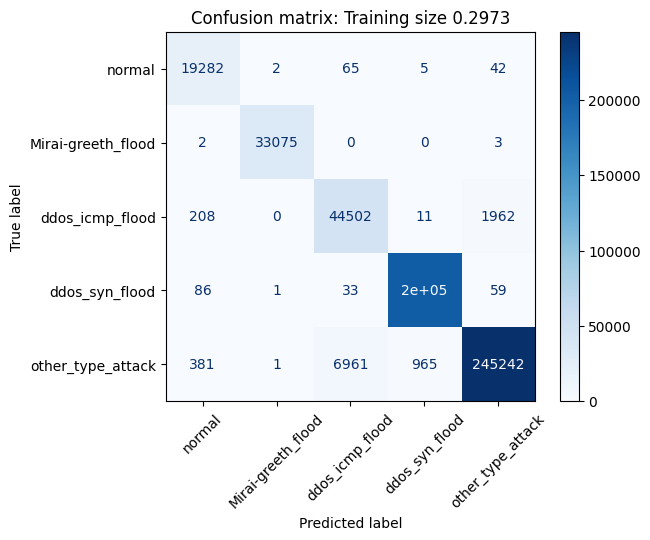

Test accuracy: 0.9805739045245316
Test precision: 0.9631752463479692
Test recall: 0.9827203304431842
Test f1-score: 0.9724286765778082


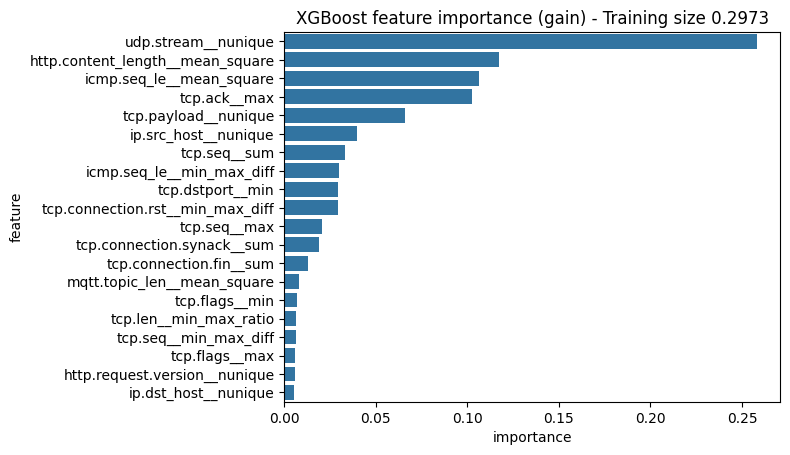

0.355
(542095, 264)


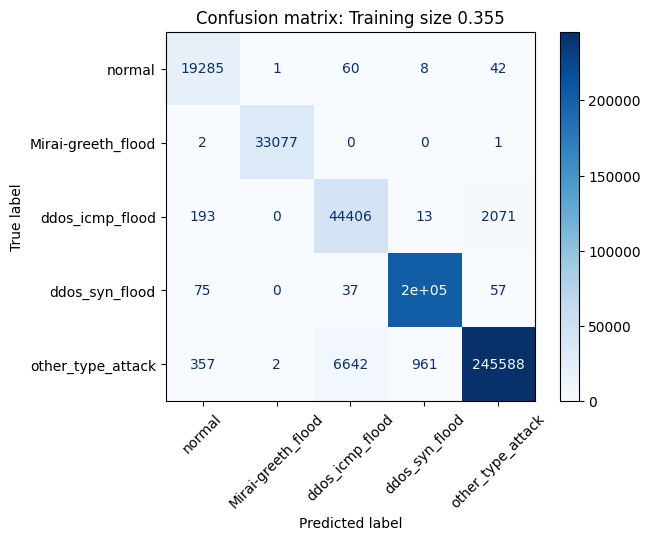

Test accuracy: 0.9810511377961547
Test precision: 0.9646134735807165
Test recall: 0.9826348692921171
Test f1-score: 0.9731848874931279


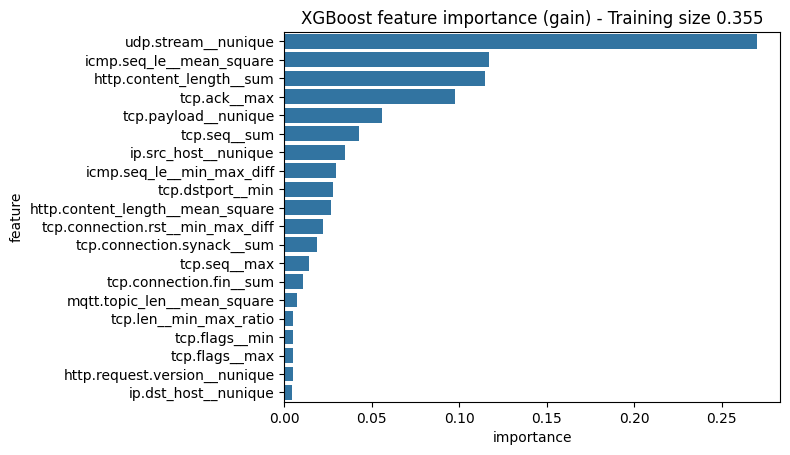

0.4177
(637840, 264)


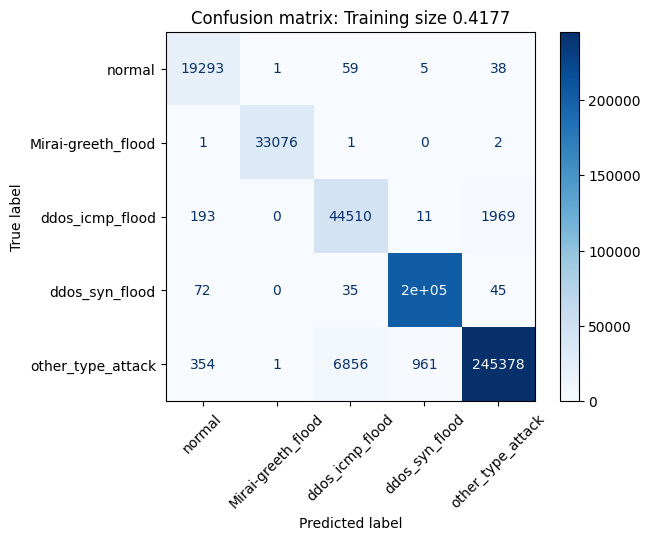

Test accuracy: 0.9809034656139921
Test precision: 0.9641252643346252
Test recall: 0.9830080090244767
Test f1-score: 0.9730716529134309


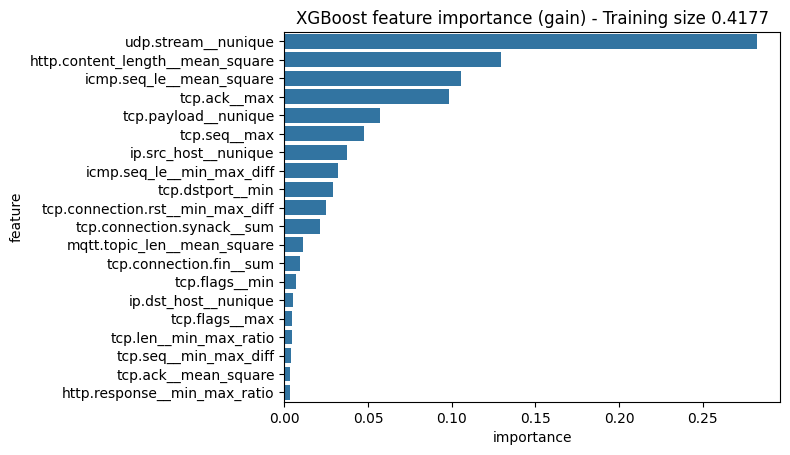

0.4856
(741525, 264)


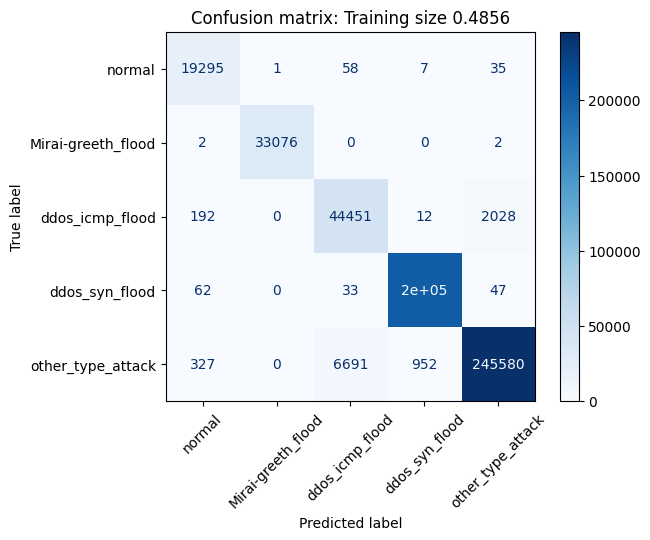

Test accuracy: 0.9811826020558849
Test precision: 0.9649929548953752
Test recall: 0.9829450734548623
Test f1-score: 0.9735188525968441


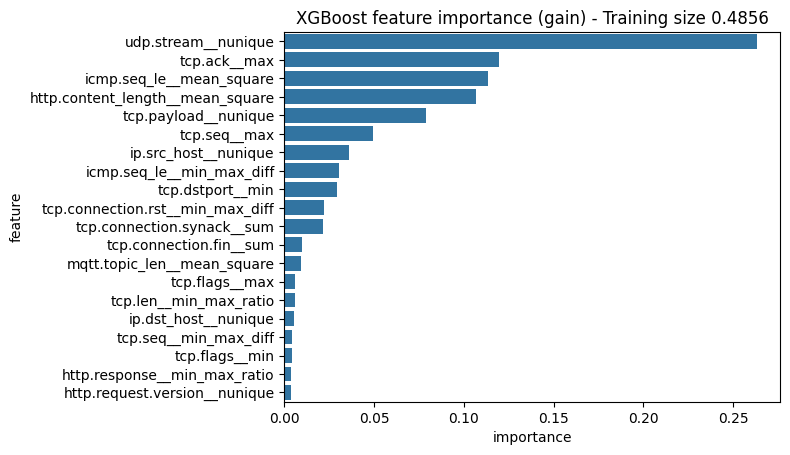

0.5586
(852998, 264)


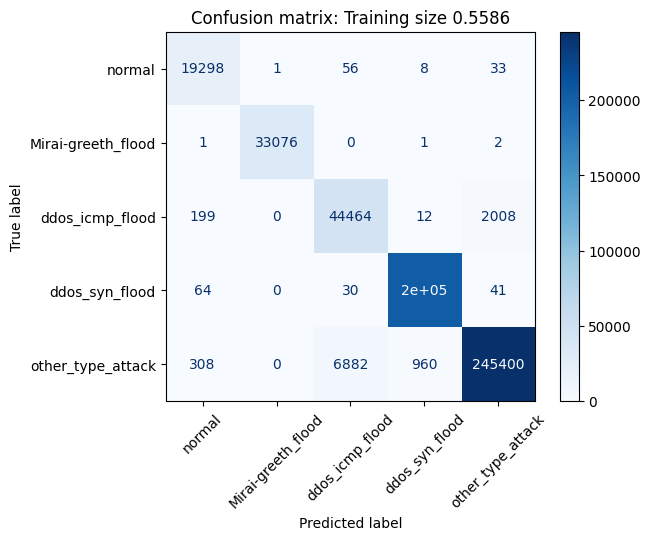

Test accuracy: 0.9808998638534515
Test precision: 0.9644919074032391
Test recall: 0.9828966296516294
Test f1-score: 0.973210347792403


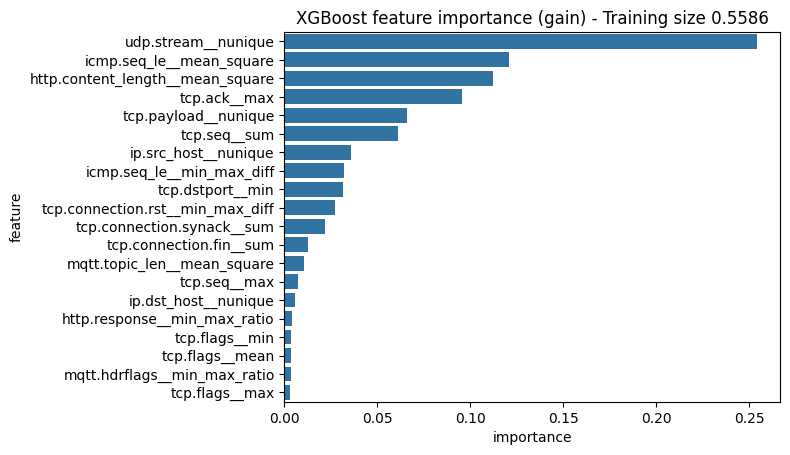

0.6366
(972107, 264)


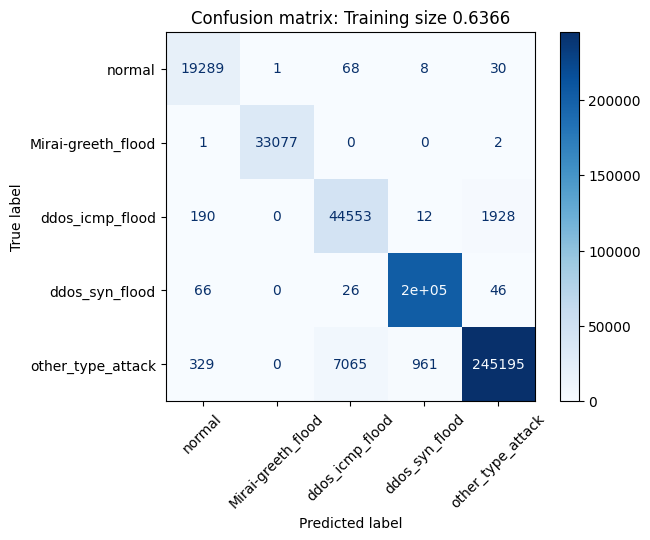

Test accuracy: 0.9806711520591265
Test precision: 0.9638216470350669
Test recall: 0.9830265024073299
Test f1-score: 0.972888119663056


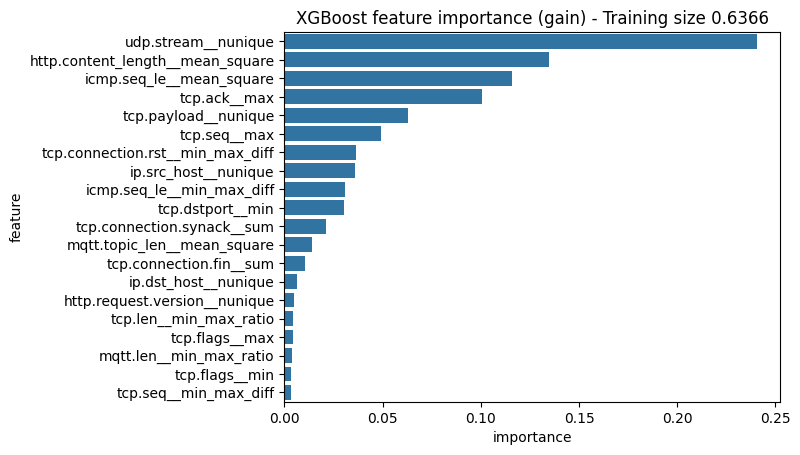

0.7198
(1099156, 264)


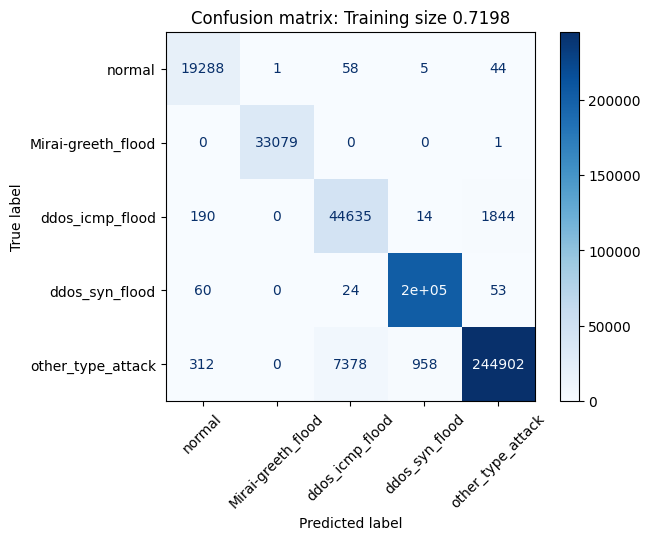

Test accuracy: 0.9802947680826388
Test precision: 0.9631574396988156
Test recall: 0.9831494576818086
Test f1-score: 0.9725468964232524


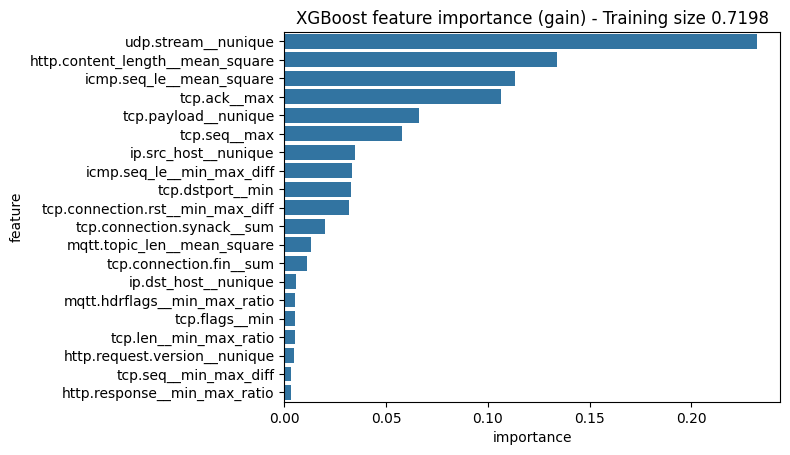

0.8081
(1233992, 264)


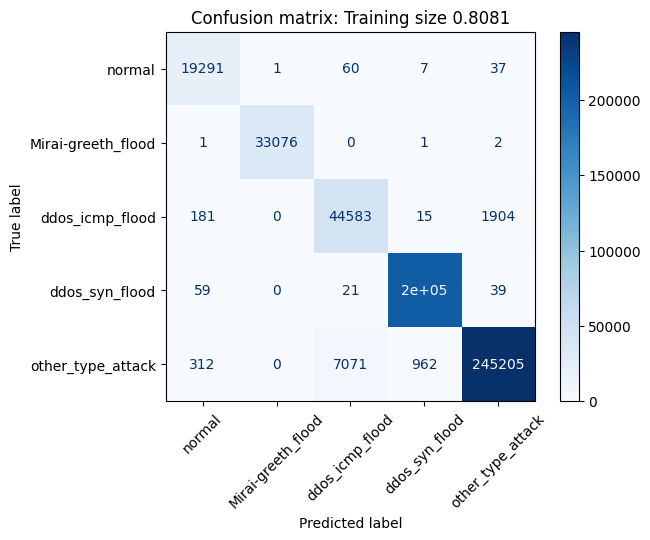

Test accuracy: 0.9807792048753431
Test precision: 0.9641999026972379
Test recall: 0.9831962521863048
Test f1-score: 0.9731611838915374


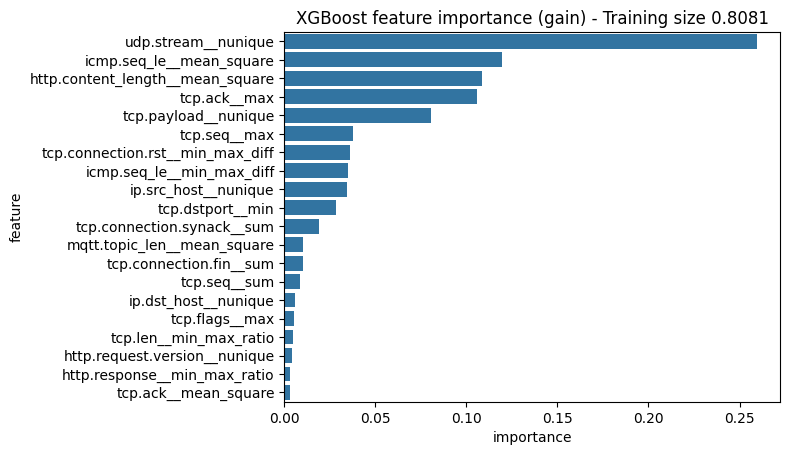

0.9015
(1376617, 264)


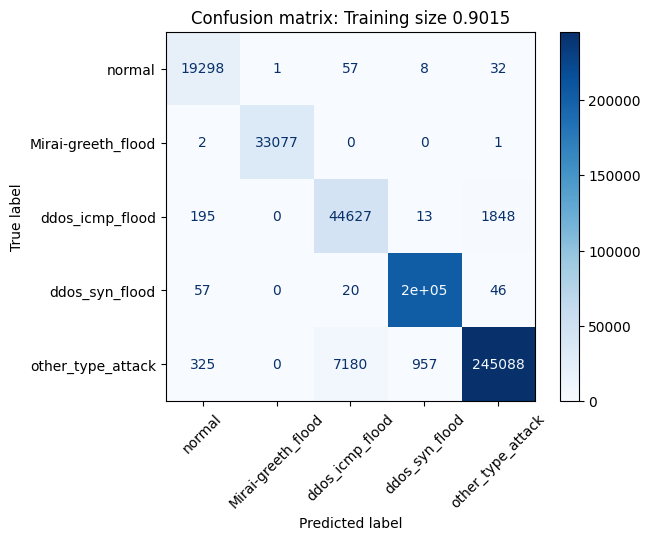

Test accuracy: 0.980654944136694
Test precision: 0.9636724437298538
Test recall: 0.9833667447741885
Test f1-score: 0.972950188152652


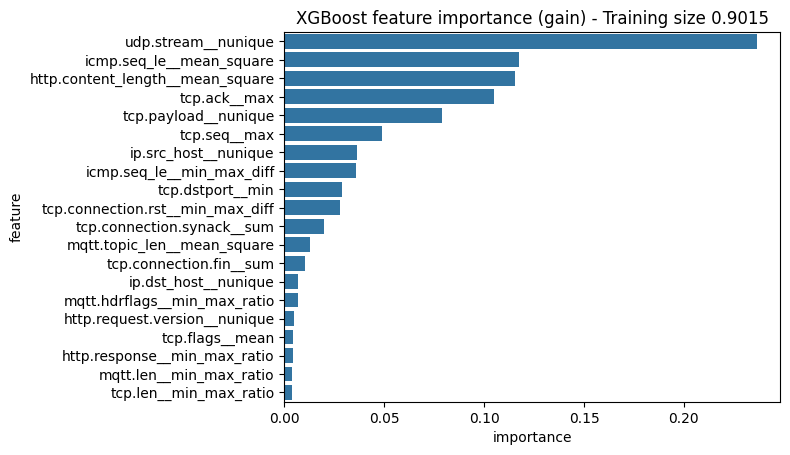

1.0
(1527030, 264)


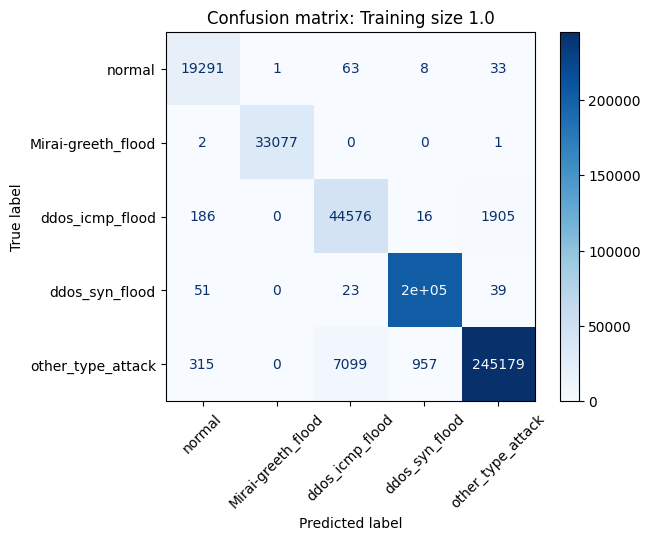

Test accuracy: 0.9807323819883159
Test precision: 0.9640834686083404
Test recall: 0.9831577235884067
Test f1-score: 0.973078790965492


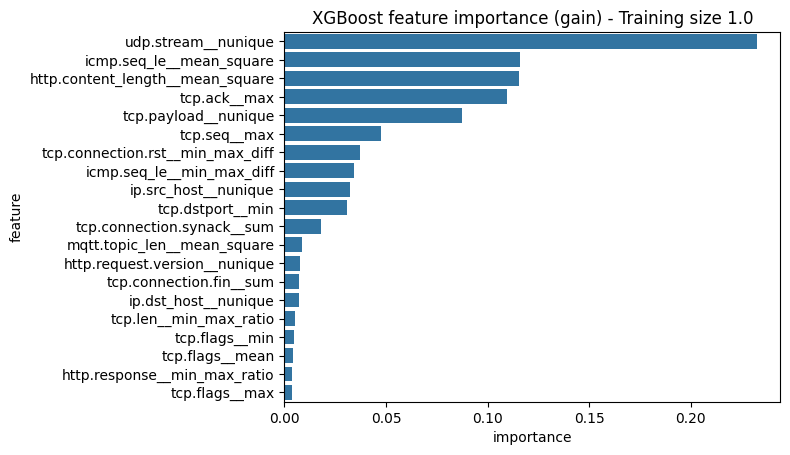

CPU times: user 1h 4min 56s, sys: 22.9 s, total: 1h 5min 19s
Wall time: 11min 53s


In [8]:
%%time
df_results = []
for prop in np.linspace(0.04, 1.0, num=20)**2:
    prop = round(prop, 4)
    print(prop)
    
    if prop < 1:
        df_train_prop = df_train.sample(int(df_train.shape[0]*prop), random_state=SEED)
    else:
        df_train_prop = df_train
    print(df_train_prop.shape)
    
    X_train_prop = df_train_prop.drop(columns=['attack_label_enc__most_frequent'])
    y_train_prop = df_train_prop.loc[:, 'attack_label_enc__most_frequent']
    
    df_res = train_xgboost(
        X_train_prop, y_train_prop, 
        X_valid, y_valid, 
        method_name=f'Training size {prop}', 
        file_name=f'training_size_{prop}.pkl'
    )
    memory_usage = df_train_prop.memory_usage(index=True).sum()
    df_res['memory_usage'] = memory_usage
    df_res['sample_size'] = df_train_prop.shape[0]
    df_results.append(df_res)
    
    del df_train_prop
    del X_train_prop
    del y_train_prop

In [9]:
def get_model_size(x, path='./'):
    prop = x.split(' ')[-1]
    filename = f'training_size_{prop}.pkl'
    model_size = os.path.getsize(os.path.join(path, filename))
    return model_size

df_results = pd.concat(df_results, axis=0)
df_results['model_size'] = df_results['model'].apply(get_model_size)
df_results

,model,accuracy,precision,recall,f1-score,memory_usage,sample_size,model_size
0,Training size 0.0016,0.955652,0.904919,0.959902,0.928964,5179160,2443,599841
0,Training size 0.0082,0.970428,0.935702,0.973744,0.953214,26544520,12521,876978
0,Training size 0.0199,0.974536,0.946372,0.977546,0.960938,64420440,30387,1042186
0,Training size 0.0367,0.976538,0.951835,0.979363,0.964758,118809040,56042,1171605
0,Training size 0.0586,0.977738,0.954979,0.980594,0.967012,189703960,89483,1249208
0,Training size 0.0856,0.979326,0.959027,0.981110,0.969484,277111560,130713,1294182
0,Training size 0.1178,0.979661,0.960085,0.981523,0.970252,381354080,179884,1325816
0,Training size 0.155,0.979940,0.961290,0.981912,0.971052,501780680,236689,1364520
0,Training size 0.1973,0.980293,0.962218,0.982195,0.971687,638719960,301283,1400380
0,Training size 0.2448,0.979681,0.961105,0.982431,0.971149,792489920,373816,1412144


In [19]:
df_results.to_csv('./data/training_size_results.csv', index=False)

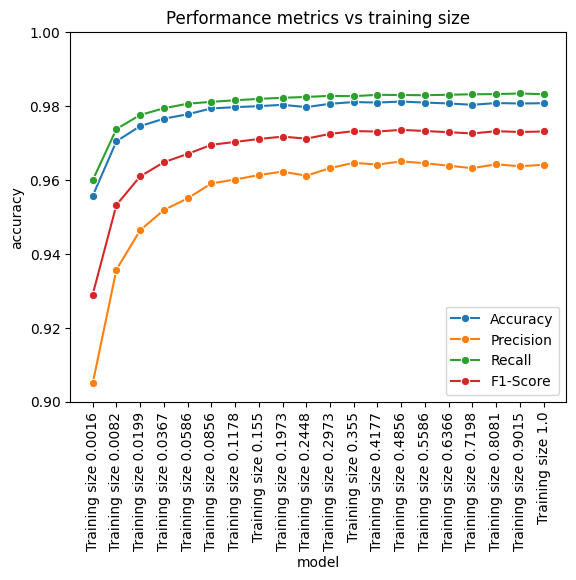

In [14]:
sns.lineplot(df_results, y='accuracy', x='model', label='Accuracy', marker='o')
sns.lineplot(df_results, y='precision', x='model', label='Precision', marker='o')
sns.lineplot(df_results, y='recall', x='model', label='Recall', marker='o')
sns.lineplot(df_results, y='f1-score', x='model', label='F1-Score', marker='o')
plt.xticks(rotation=90)
plt.legend()
plt.ylim((0.9, 1.0))
plt.title('Performance metrics vs training size')
plt.show()

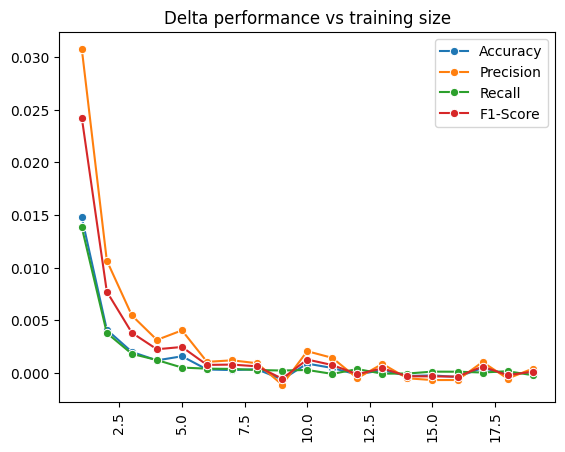

In [13]:
sns.lineplot(df_results['accuracy'].diff().values, label='Accuracy', marker='o')
sns.lineplot(df_results['precision'].diff().values, label='Precision', marker='o')
sns.lineplot(df_results['recall'].diff().values, label='Recall', marker='o')
sns.lineplot(df_results['f1-score'].diff().values, label='F1-Score', marker='o')
plt.xticks(rotation=90)
plt.legend()
plt.title('Delta performance vs training size')
plt.show()

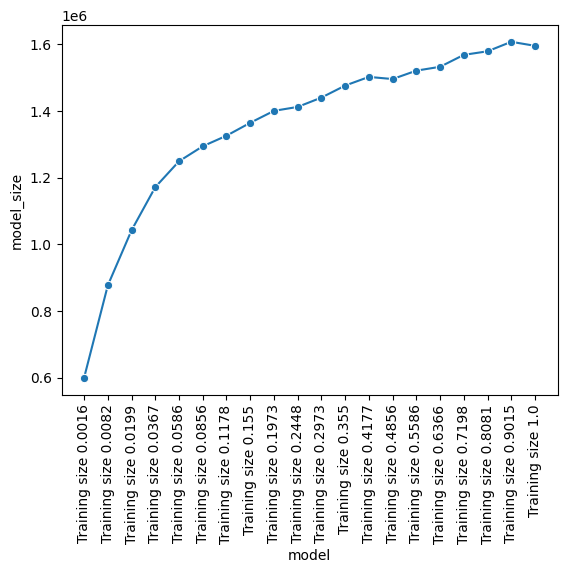

In [17]:
sns.lineplot(df_results, y='model_size', x='model', marker='o')
plt.xticks(rotation=90)
plt.show()

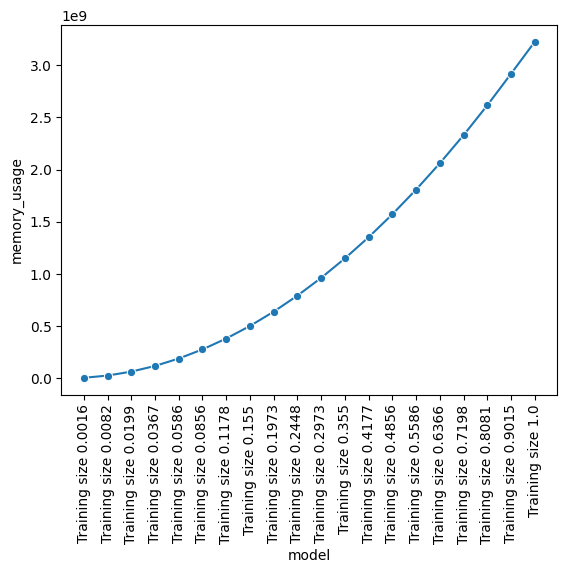

In [18]:
sns.lineplot(df_results, y='memory_usage', x='model', marker='o')
plt.xticks(rotation=90)
plt.show()

## 8. Feature selection

In [3]:
training_size_prop = 0.1178

In [4]:
def filter_module(columns, module):
    match_module = map(lambda x: x if module+'.' in x else None, columns)  # match module columns else None
    clean_module = filter(lambda x: x is not None, match_module)  # remove None values
    return list(clean_module)

In [5]:
# label columns
targets_cols = ['attack_label__most_frequent', 'attack_label_enc__most_frequent', 'is_attack__most_frequent']

In [6]:
# restore preprocessed data splits
df_train = pd.read_csv('./data/BRUIIoT_train_preprocessed.csv')
df_fs = pd.read_csv('./data/BRUIIoT_fs_preprocessed.csv')
df_valid = pd.read_csv('./data/BRUIIoT_valid_preprocessed.csv')
df_test = pd.read_csv('./data/BRUIIoT_test_preprocessed.csv')

# shuffle training set
df_train = df_train.sample(frac=1, random_state=SEED).reset_index(drop=True)

# sufficient training set size
df_train = df_train.sample(frac=training_size_prop, random_state=SEED)
df_train.shape

(179884, 265)

In [7]:
# map label indices
labels = list(set(zip(df_valid['attack_label_enc__most_frequent'], df_valid['attack_label__most_frequent'])))  # get encoding and label pairs
labels = {x[0]: x[1] for x in labels}  # to dict
labels = dict(sorted(labels.items()))  # order by key (enconding)
labels

{0: 'normal',
 1: 'Mirai-greeth_flood',
 2: 'ddos_icmp_flood',
 3: 'ddos_syn_flood',
 4: 'other_type_attack'}

In [8]:
# get protocols
modules = list(set(map(lambda x: x.split('.')[0], df_train.columns)))  # get protocols from columns
modules = [m for m in modules if m not in targets_cols]  # remove target columns
modules.remove('frame')
modules

['dns', 'tcp', 'udp', 'arp', 'http', 'mqtt', 'icmp', 'ip']

In [9]:
# keep only protocols
df_train = df_train.drop(columns=['frame.time__calculate_duration'])
df_fs = df_fs.drop(columns=['frame.time__calculate_duration'])
df_valid = df_valid.drop(columns=['frame.time__calculate_duration'])
df_test = df_test.drop(columns=['frame.time__calculate_duration'])

In [10]:
# get features and targets
X_train = df_train.drop(columns=['attack_label_enc__most_frequent'])
X_fs = df_fs.drop(columns=targets_cols+['index'])
X_valid = df_valid.drop(columns=targets_cols+['index'])
X_test = df_test.drop(columns=targets_cols+['index'])

y_train = df_train.loc[:, 'attack_label_enc__most_frequent']
y_fs = df_fs.loc[:, 'attack_label_enc__most_frequent']
y_valid = df_valid.loc[:, 'attack_label_enc__most_frequent']
y_test = df_test.loc[:, 'attack_label_enc__most_frequent']

print('Training features size:', X_train.shape)
print('FS features size:', X_fs.shape)
print('Validation features size:', X_valid.shape)
print('Test features size:', X_test.shape)
print('')
print('Training labels size:', y_train.shape)
print('FS labels size:', y_fs.shape)
print('Validation labels size:', y_valid.shape)
print('Test labels size:', y_test.shape)

Training features size: (179884, 263)
FS features size: (138821, 263)
Validation features size: (555284, 263)
Test features size: (555284, 263)

Training labels size: (179884,)
FS labels size: (138821,)
Validation labels size: (555284,)
Test labels size: (555284,)


In [11]:
for m in modules:
    print(f'**Processing module {m}...**')

    # get module's columns
    cols = filter_module(df_train.columns, m)
    print(f'Columns length: {len(cols)}, columns:', cols)
    print('')

**Processing module dns...**
Columns length: 42, columns: ['dns.qry.name__nunique', 'dns.qry.name.len__nunique', 'dns.qry.qu__min', 'dns.qry.qu__max', 'dns.qry.qu__sum', 'dns.qry.qu__mean', 'dns.qry.qu__min_max_diff', 'dns.qry.qu__min_max_ratio', 'dns.qry.qu__min_max_product', 'dns.qry.qu__mean_square', 'dns.qry.type__min', 'dns.qry.type__max', 'dns.qry.type__sum', 'dns.qry.type__mean', 'dns.qry.type__min_max_diff', 'dns.qry.type__min_max_ratio', 'dns.qry.type__min_max_product', 'dns.qry.type__mean_square', 'dns.retransmission__min', 'dns.retransmission__max', 'dns.retransmission__sum', 'dns.retransmission__mean', 'dns.retransmission__min_max_diff', 'dns.retransmission__min_max_ratio', 'dns.retransmission__min_max_product', 'dns.retransmission__mean_square', 'dns.retransmit_request__min', 'dns.retransmit_request__max', 'dns.retransmit_request__sum', 'dns.retransmit_request__mean', 'dns.retransmit_request__min_max_diff', 'dns.retransmit_request__min_max_ratio', 'dns.retransmit_request__

### 7.1 Mutual Information (MI)

In [12]:
def fs_mutual_information(X_valid, y_valid):
    # mutual information
    mi_measures = mutual_info_classif(X_valid, y_valid, random_state=SEED, n_jobs=-1)

    # plot mutual information distribution
    sns.histplot(mi_measures)
    plt.show()

    # determine threshold
    third_quartile = np.quantile(mi_measures, 0.75)

    # select features
    mask = (mi_measures > third_quartile)[:, None]
    col_idx = np.where(np.any(mask, axis=1))[0]

    selected_features = X_valid.iloc[:, col_idx].columns
    return selected_features

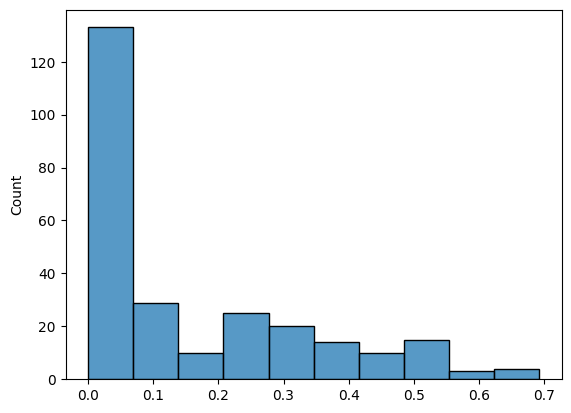

CPU times: user 1.7 s, sys: 499 ms, total: 2.2 s
Wall time: 22.6 s


(66,
 Index(['ip.src_host__nunique', 'ip.dst_host__nunique',
        'icmp.checksum__min_max_diff', 'icmp.checksum__min_max_ratio',
        'icmp.seq_le__min', 'icmp.seq_le__max', 'icmp.seq_le__sum',
        'icmp.seq_le__mean', 'icmp.seq_le__min_max_diff',
        'icmp.seq_le__min_max_ratio', 'icmp.seq_le__min_max_product',
        'icmp.seq_le__mean_square', 'tcp.ack__min', 'tcp.ack__max',
        'tcp.ack__sum', 'tcp.ack__mean', 'tcp.ack__min_max_diff',
        'tcp.ack__min_max_ratio', 'tcp.ack__min_max_product',
        'tcp.ack__mean_square', 'tcp.ack_raw__min', 'tcp.ack_raw__max',
        'tcp.ack_raw__sum', 'tcp.ack_raw__mean', 'tcp.ack_raw__min_max_diff',
        'tcp.ack_raw__min_max_ratio', 'tcp.ack_raw__min_max_product',
        'tcp.ack_raw__mean_square', 'tcp.checksum__max',
        'tcp.checksum__min_max_diff', 'tcp.checksum__min_max_ratio',
        'tcp.connection.syn__sum', 'tcp.connection.syn__mean',
        'tcp.connection.syn__mean_square', 'tcp.connection.synack__

In [13]:
%%time
mi_features = fs_mutual_information(X_fs, y_fs)
len(mi_features), mi_features

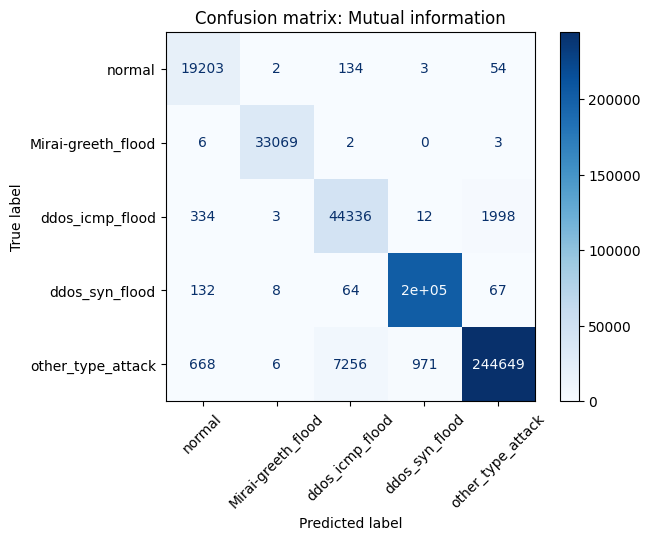

Test accuracy: 0.9788882805915532
Test precision: 0.9571954209319268
Test recall: 0.9805996857454282
Test f1-score: 0.9682651363433822


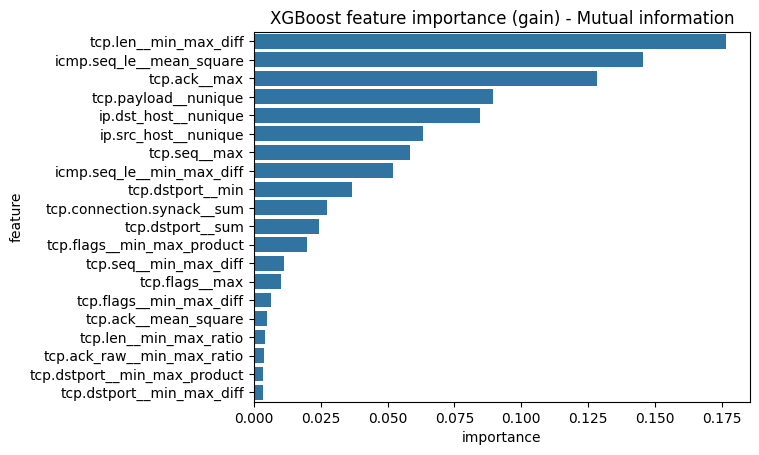

,model,accuracy,precision,recall,f1-score
0,Mutual information,0.978888,0.957195,0.9806,0.968265


In [14]:
train_xgboost(
    X_train.loc[:, mi_features], y_train, 
    X_valid.loc[:, mi_features], y_valid, 
    method_name='Mutual information', 
    file_name='mi.pkl'
)

### 7.2 Causality Markov Blanket

In [15]:
def fs_causal_markov_blanket(X_train, y_train, protocols, thresholds=[0.01, 0.001], val_size=0.1, verbose=0):
    predictor = DecisionTreeClassifier(random_state=SEED)

    ### first, select features for each protocol ###
    selected_features = []
    for m in tqdm(protocols):
        cols = filter_module(X_train.columns, m)
        X_train_protocol = X_train[cols].reset_index(drop=True)

        model = PPIMBC(
            model=predictor,
            p_val_thresh=thresholds[0],
            num_simul=5,
            simul_size=val_size,  # validation set size
            simul_type=0,
            sig_test_type='parametric',
            cv=2,
            n_jobs=-1,
            random_state=SEED,
            verbose=verbose,
        )
        model.fit_transform(X_train_protocol, y_train.values)
        selected_features.extend(model.MB)

    print('Intermediate number of selected features:', len(selected_features))
    print('Running final selection...')

    ### finally, select the features globally ###
    model = PPIMBC(
        model=predictor,
        p_val_thresh=thresholds[1],
        num_simul=5,
        simul_size=val_size,  # validation set size
        simul_type=0,
        sig_test_type='parametric',
        cv=2,
        n_jobs=-1,
        random_state=SEED,
        verbose=verbose,
    )
    model.fit_transform(X_train[selected_features].T.reset_index(drop=True).T, y_train.values)

    # select features
    selected_features = X_train[selected_features].iloc[:, model.MB].columns

    # plot mutual information distribution
    model.MB = selected_features
    model.feature_importance()
    plt.show()

    return selected_features

  0%|          | 0/8 [00:00<?, ?it/s]

Intermediate number of selected features: 41
Running final selection...


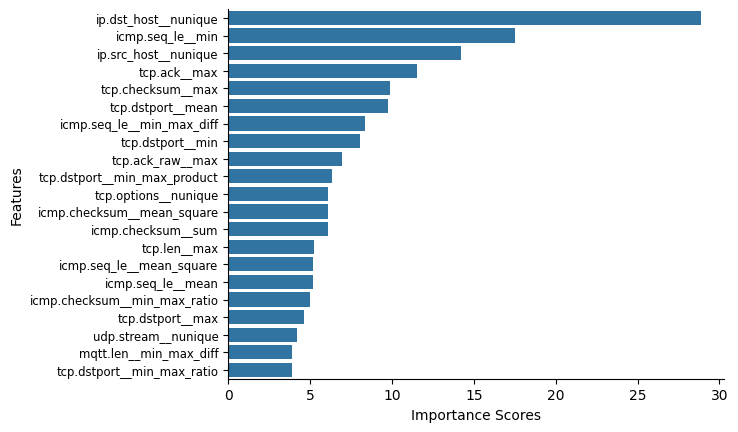

CPU times: user 1.89 s, sys: 478 ms, total: 2.37 s
Wall time: 5min 57s


(21,
 Index(['ip.dst_host__nunique', 'icmp.seq_le__min', 'ip.src_host__nunique',
        'tcp.ack__max', 'tcp.checksum__max', 'tcp.dstport__mean',
        'icmp.seq_le__min_max_diff', 'tcp.dstport__min', 'tcp.ack_raw__max',
        'tcp.dstport__min_max_product', 'tcp.options__nunique',
        'icmp.checksum__mean_square', 'icmp.checksum__sum', 'tcp.len__max',
        'icmp.seq_le__mean_square', 'icmp.seq_le__mean',
        'icmp.checksum__min_max_ratio', 'tcp.dstport__max',
        'udp.stream__nunique', 'mqtt.len__min_max_diff',
        'tcp.dstport__min_max_ratio'],
       dtype='object'))

In [16]:
%%time
causal_selected_features = fs_causal_markov_blanket(X_fs, y_fs, modules, thresholds=[0.001, 0.05], val_size=0.05) # 0.001, 0.05
len(causal_selected_features), causal_selected_features

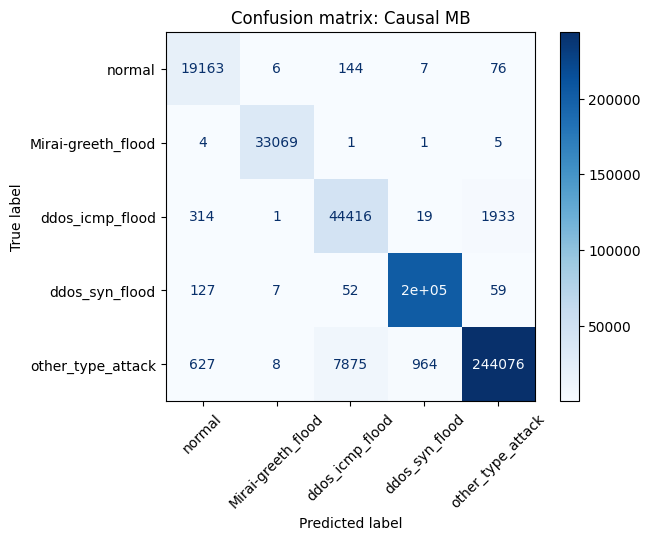

Test accuracy: 0.9779752342945232
Test precision: 0.9558548651261127
Test recall: 0.9801036544012393
Test f1-score: 0.9672330460750255


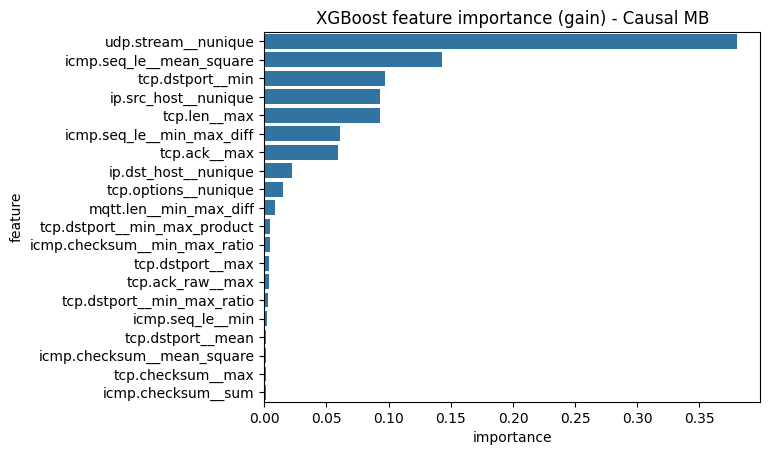

,model,accuracy,precision,recall,f1-score
0,Causal MB,0.977975,0.955855,0.980104,0.967233


In [17]:
train_xgboost(
    X_train.loc[:, causal_selected_features], y_train, 
    X_valid.loc[:, causal_selected_features], y_valid, 
    method_name='Causal MB', 
    file_name='mb.pkl'
)

### 7.3 Boruta

In [18]:
def fs_boruta(X_valid, y_valid, max_iter=30, n_estimators=100, verbose=2):
    # boruta
    clf = RandomForestClassifier(random_state=SEED, n_jobs=-1)
    boruta = BorutaPy(clf, max_iter=max_iter, n_estimators=n_estimators, random_state=SEED, verbose=verbose)
    boruta.fit_transform(X_valid.values, y_valid.values)

    # select features
    cols_selected = boruta.support_.tolist()
    selected_features = X_valid.iloc[:, cols_selected].columns
    return selected_features

In [19]:
%%time
boruta_selected_features = fs_boruta(X_fs, y_fs, max_iter=30, n_estimators=100)
print(len(boruta_selected_features))
boruta_selected_features.to_list()

Iteration: 	1 / 30
Confirmed: 	0
Tentative: 	263
Rejected: 	0
Iteration: 	2 / 30
Confirmed: 	0
Tentative: 	263
Rejected: 	0
Iteration: 	3 / 30
Confirmed: 	0
Tentative: 	263
Rejected: 	0
Iteration: 	4 / 30
Confirmed: 	0
Tentative: 	263
Rejected: 	0
Iteration: 	5 / 30
Confirmed: 	0
Tentative: 	263
Rejected: 	0
Iteration: 	6 / 30
Confirmed: 	0
Tentative: 	263
Rejected: 	0
Iteration: 	7 / 30
Confirmed: 	0
Tentative: 	263
Rejected: 	0
Iteration: 	8 / 30
Confirmed: 	101
Tentative: 	42
Rejected: 	120
Iteration: 	9 / 30
Confirmed: 	101
Tentative: 	42
Rejected: 	120
Iteration: 	10 / 30
Confirmed: 	101
Tentative: 	42
Rejected: 	120
Iteration: 	11 / 30
Confirmed: 	101
Tentative: 	42
Rejected: 	120
Iteration: 	12 / 30
Confirmed: 	106
Tentative: 	37
Rejected: 	120
Iteration: 	13 / 30
Confirmed: 	106
Tentative: 	37
Rejected: 	120
Iteration: 	14 / 30
Confirmed: 	106
Tentative: 	37
Rejected: 	120
Iteration: 	15 / 30
Confirmed: 	106
Tentative: 	37
Rejected: 	120
Iteration: 	16 / 30
Confirmed: 	106
Tent

(108,
 Index(['ip.src_host__nunique', 'ip.dst_host__nunique', 'icmp.checksum__min',
        'icmp.checksum__max', 'icmp.checksum__sum', 'icmp.checksum__mean',
        'icmp.checksum__min_max_diff', 'icmp.checksum__min_max_ratio',
        'icmp.checksum__min_max_product', 'icmp.checksum__mean_square',
        ...
        'udp.port__nunique', 'udp.stream__nunique', 'mqtt.hdrflags__sum',
        'mqtt.hdrflags__mean', 'mqtt.len__max', 'mqtt.len__sum',
        'mqtt.len__mean', 'mqtt.len__min_max_diff', 'mqtt.len__min_max_ratio',
        'mqtt.len__mean_square'],
       dtype='object', length=108))

In [20]:
boruta_selected_features.to_list()

['ip.src_host__nunique',
 'ip.dst_host__nunique',
 'icmp.checksum__min',
 'icmp.checksum__max',
 'icmp.checksum__sum',
 'icmp.checksum__mean',
 'icmp.checksum__min_max_diff',
 'icmp.checksum__min_max_ratio',
 'icmp.checksum__min_max_product',
 'icmp.checksum__mean_square',
 'icmp.seq_le__min',
 'icmp.seq_le__max',
 'icmp.seq_le__sum',
 'icmp.seq_le__mean',
 'icmp.seq_le__min_max_diff',
 'icmp.seq_le__min_max_ratio',
 'icmp.seq_le__min_max_product',
 'icmp.seq_le__mean_square',
 'http.file_data__nunique',
 'http.content_length__max',
 'http.content_length__sum',
 'http.content_length__mean',
 'http.content_length__min_max_diff',
 'http.content_length__min_max_ratio',
 'http.content_length__mean_square',
 'http.request.method__nunique',
 'http.request.full_uri__nunique',
 'http.request.version__nunique',
 'http.response__min_max_ratio',
 'tcp.ack__min',
 'tcp.ack__max',
 'tcp.ack__sum',
 'tcp.ack__mean',
 'tcp.ack__min_max_diff',
 'tcp.ack__min_max_ratio',
 'tcp.ack__min_max_product',
 '

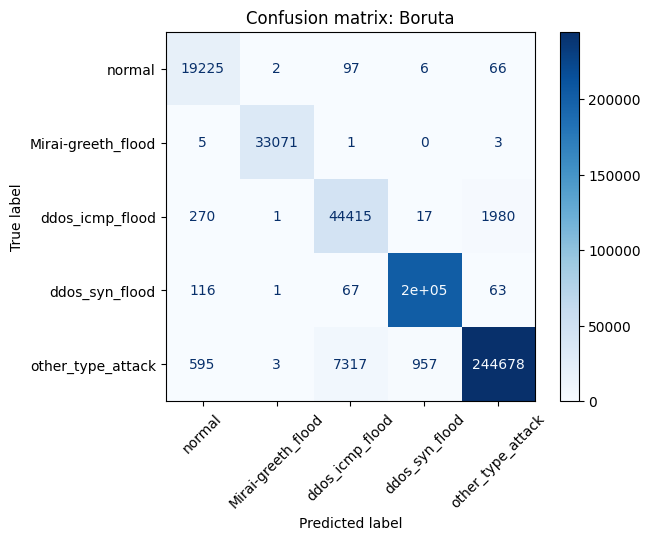

Test accuracy: 0.9791692179137162
Test precision: 0.9586909449795289
Test recall: 0.9812236516113348
Test f1-score: 0.9693331186160401


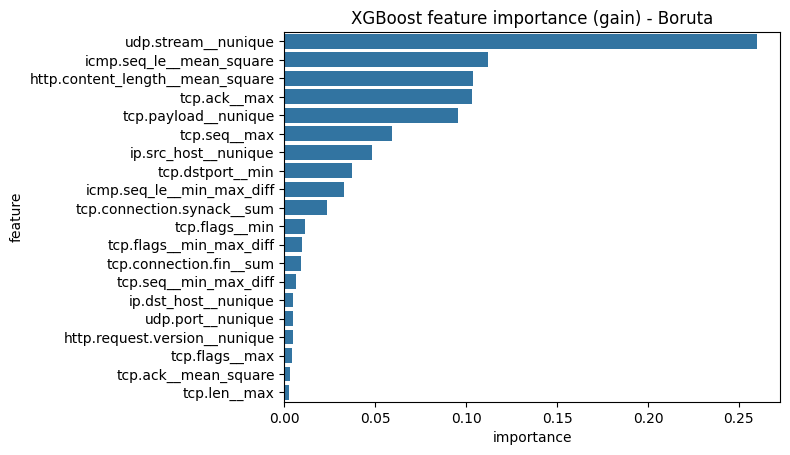

,model,accuracy,precision,recall,f1-score
0,Boruta,0.979169,0.958691,0.981224,0.969333


In [21]:
train_xgboost(
    X_train.loc[:, boruta_selected_features], y_train, 
    X_valid.loc[:, boruta_selected_features], y_valid, 
    method_name='Boruta', 
    file_name='boruta.pkl'
)

### 7.4 Recursive Feature Elimination (RFE)

In [22]:
def fs_rfe(X_valid, y_valid, n_features_to_select):
    # recursive feature elimination
    clf = DecisionTreeClassifier(random_state=SEED)
    selector = RFE(clf, n_features_to_select=n_features_to_select, step=2)
    selector = selector.fit(X_valid, y_valid)

    # select features
    selected_features = X_valid.iloc[:, selector.support_].columns
    return selected_features

In [23]:
%%time
rfe_selected_features = fs_rfe(X_fs, y_fs, n_features_to_select=21)
len(rfe_selected_features), rfe_selected_features

CPU times: user 14min 14s, sys: 1.56 s, total: 14min 15s
Wall time: 14min 15s


(21,
 Index(['ip.dst_host__nunique', 'icmp.checksum__mean',
        'icmp.checksum__min_max_ratio', 'icmp.checksum__mean_square',
        'icmp.seq_le__sum', 'icmp.seq_le__min_max_diff',
        'icmp.seq_le__min_max_ratio', 'http.content_length__min_max_diff',
        'tcp.ack__max', 'tcp.ack__mean', 'tcp.ack_raw__max',
        'tcp.checksum__min_max_diff', 'tcp.dstport__max', 'tcp.dstport__mean',
        'tcp.dstport__min_max_diff', 'tcp.dstport__min_max_ratio',
        'tcp.len__max', 'tcp.options__nunique', 'udp.port__nunique',
        'udp.stream__nunique', 'mqtt.len__max'],
       dtype='object'))

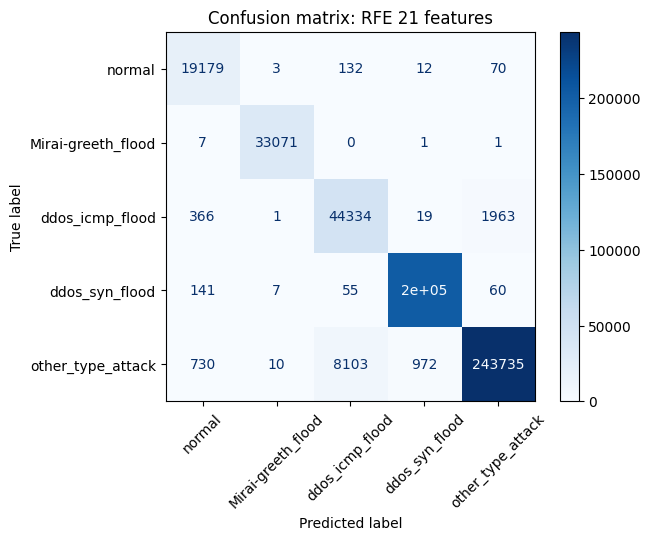

Test accuracy: 0.9772134619401963
Test precision: 0.9534929523046618
Test recall: 0.9796426714827394
Test f1-score: 0.9657508069950623


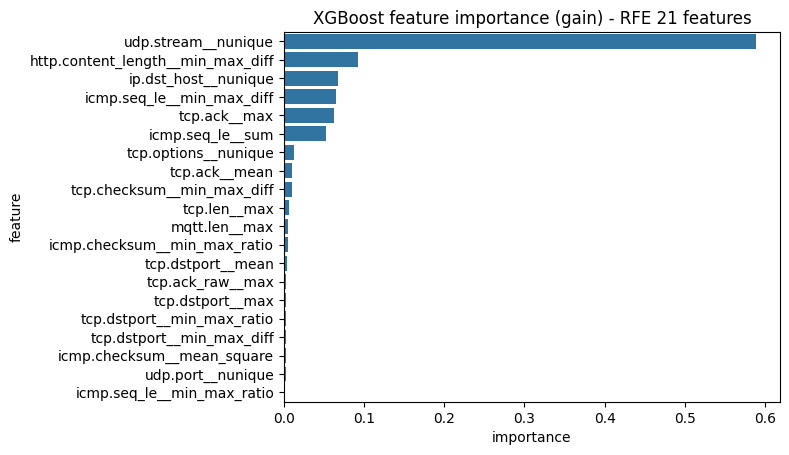

,model,accuracy,precision,recall,f1-score
0,RFE 21 features,0.977213,0.953493,0.979643,0.965751


In [24]:
train_xgboost(
    X_train.loc[:, rfe_selected_features], y_train, 
    X_valid.loc[:, rfe_selected_features], y_valid, 
    method_name='RFE 21 features', 
    file_name='rfe.pkl'
)

## 8. Training with random features

TODO: see p-value...

Round: 0
	Selected features: Index(['tcp.flags.ack__min', 'dns.retransmit_request__mean_square',
       'mqtt.len__min_max_diff', 'arp.opcode__min_max_ratio', 'tcp.seq__mean',
       'dns.qry.name.len__nunique', 'http.response__min_max_product',
       'mqtt.protoname__nunique', 'tcp.flags__min_max_ratio',
       'tcp.srcport__nunique', 'dns.retransmit_request__mean',
       'tcp.seq__mean_square', 'mqtt.msg__nunique', 'http.content_length__min',
       'dns.retransmit_request_in__min_max_product',
       'tcp.ack__min_max_product', 'tcp.ack__sum',
       'tcp.connection.synack__min_max_ratio', 'tcp.flags__mean',
       'dns.qry.type__max', 'mqtt.conflags__mean'],
      dtype='object')


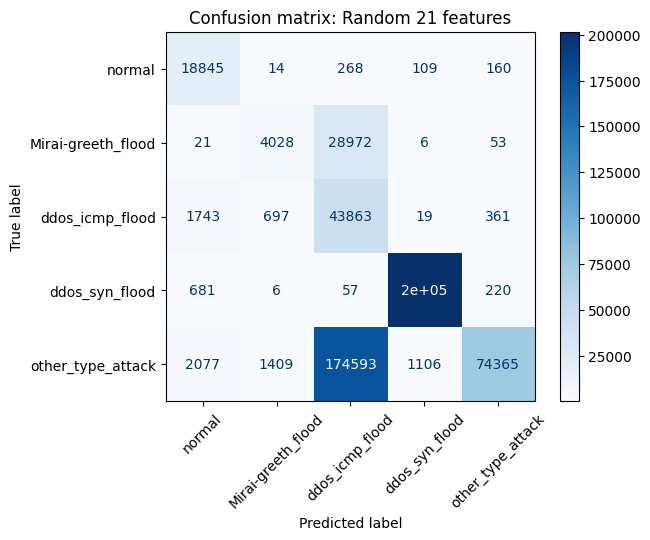

Test accuracy: 0.6171832791868666
Test precision: 0.7242757985563626
Test recall: 0.6642973091790203
Test f1-score: 0.5663356479924759


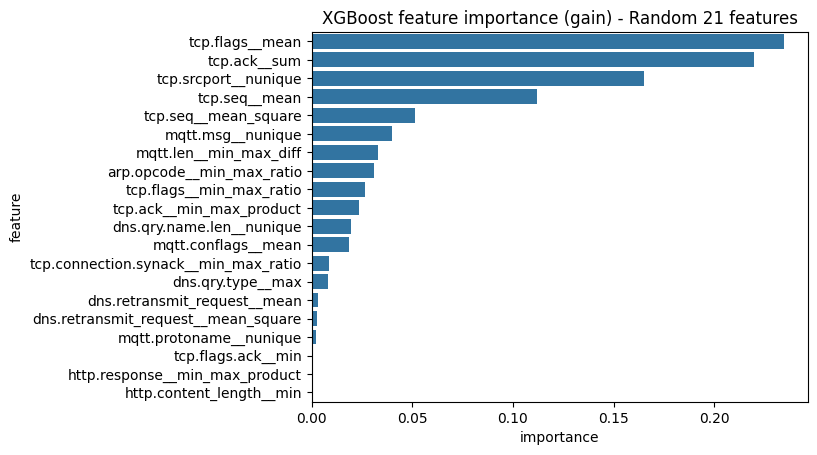

Round: 1
	Selected features: Index(['udp.time_delta__min_max_diff', 'dns.qry.qu__min',
       'tcp.dstport__mean_square', 'http.content_length__max',
       'tcp.ack_raw__min_max_diff', 'tcp.seq__min_max_ratio',
       'udp.time_delta__mean', 'tcp.ack__mean_square',
       'http.request.full_uri__nunique', 'tcp.srcport__nunique',
       'tcp.connection.fin__sum', 'dns.qry.type__mean',
       'dns.qry.type__mean_square', 'tcp.flags.ack__min',
       'mqtt.proto_len__min_max_product', 'mqtt.hdrflags__sum',
       'tcp.flags__min_max_product', 'mqtt.conflag.cleansess__mean',
       'mqtt.topic__nunique', 'tcp.checksum__sum', 'tcp.ack__min_max_product'],
      dtype='object')


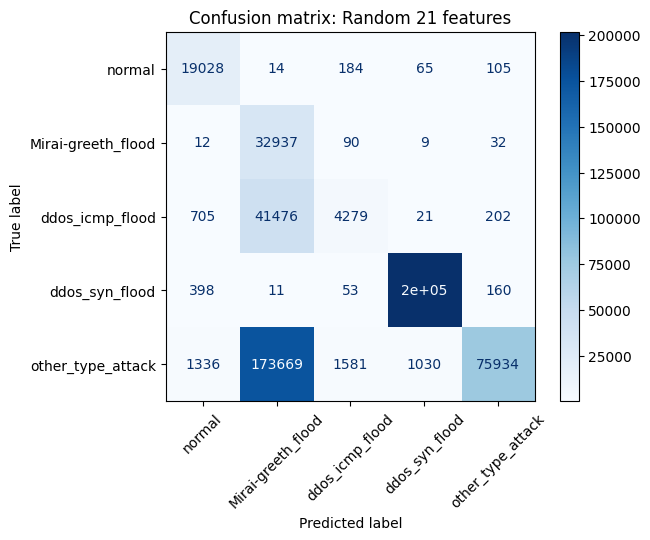

Test accuracy: 0.6017299255876273
Test precision: 0.7396369711823064
Test recall: 0.672955561390966
Test f1-score: 0.5566193300261548


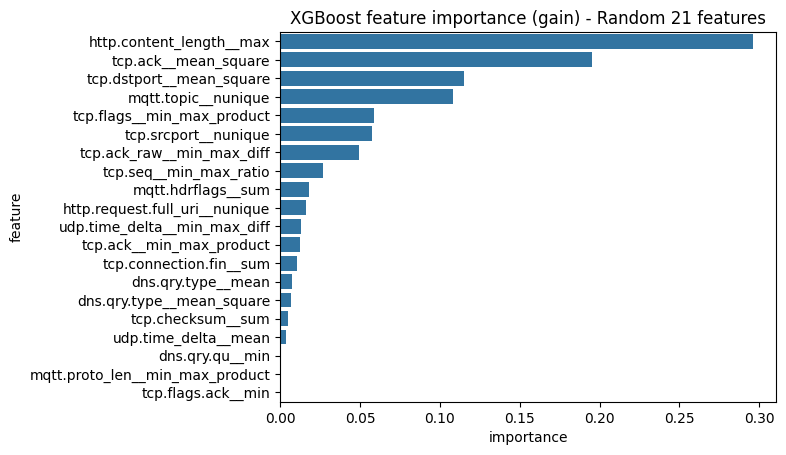

Round: 2
	Selected features: Index(['dns.retransmit_request_in__min', 'icmp.seq_le__max',
       'tcp.checksum__mean_square', 'mqtt.hdrflags__min_max_diff',
       'tcp.dstport__min_max_product', 'tcp.connection.syn__min_max_ratio',
       'mqtt.conflags__sum', 'tcp.connection.fin__min',
       'tcp.connection.syn__min_max_product', 'tcp.connection.rst__max',
       'dns.retransmission__mean_square', 'icmp.seq_le__min_max_product',
       'mqtt.len__mean', 'tcp.ack__max', 'arp.hw.size__sum',
       'icmp.checksum__min', 'mqtt.hdrflags__min_max_ratio',
       'tcp.connection.syn__max', 'mqtt.hdrflags__sum', 'tcp.flags__max',
       'tcp.dstport__min_max_diff'],
      dtype='object')


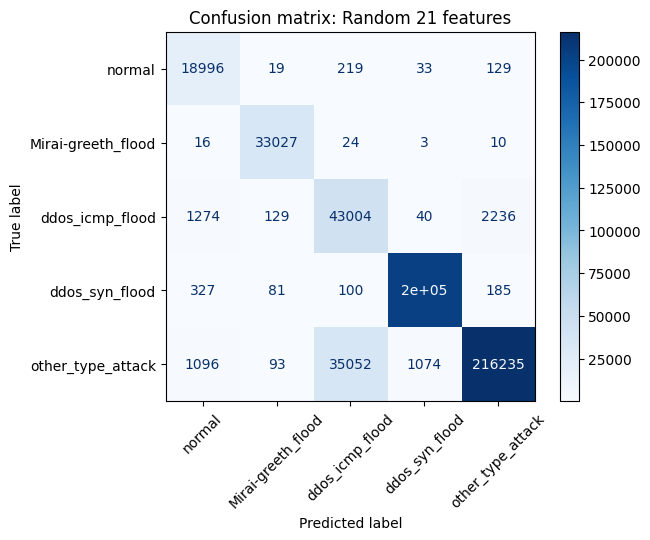

Test accuracy: 0.9241109054105647
Test precision: 0.8793072301401228
Test recall: 0.9496751489188906
Test f1-score: 0.9034543774368797


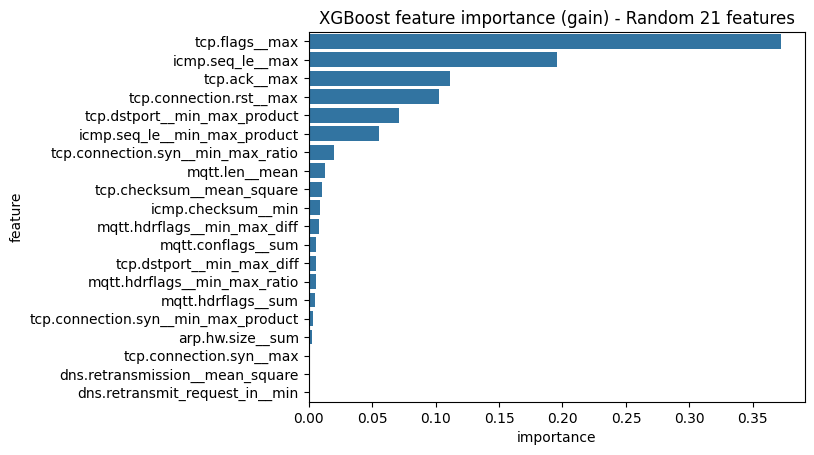

Round: 3
	Selected features: Index(['tcp.connection.rst__max', 'mqtt.hdrflags__nunique',
       'ip.dst_host__nunique', 'tcp.ack__sum', 'icmp.seq_le__mean_square',
       'mqtt.topic_len__min', 'http.response__min_max_diff',
       'tcp.srcport__nunique', 'icmp.checksum__min_max_product',
       'tcp.connection.syn__min_max_product', 'tcp.ack__mean',
       'dns.retransmission__min_max_product', 'tcp.ack_raw__sum',
       'dns.qry.qu__min_max_ratio', 'tcp.connection.fin__min_max_product',
       'tcp.connection.synack__min_max_product', 'mqtt.proto_len__max',
       'tcp.connection.rst__min_max_diff', 'icmp.checksum__min',
       'dns.retransmit_request__min', 'mqtt.topic_len__sum'],
      dtype='object')


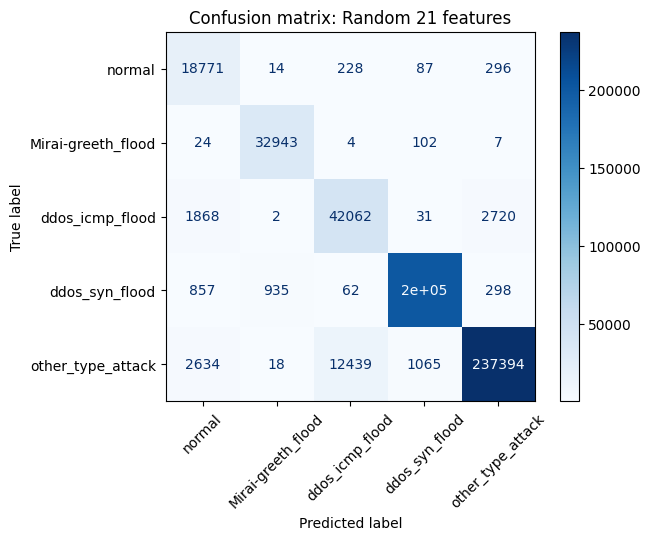

Test accuracy: 0.9573353455168887
Test precision: 0.8992044391978979
Test recall: 0.9580612378593825
Test f1-score: 0.9253228601373606


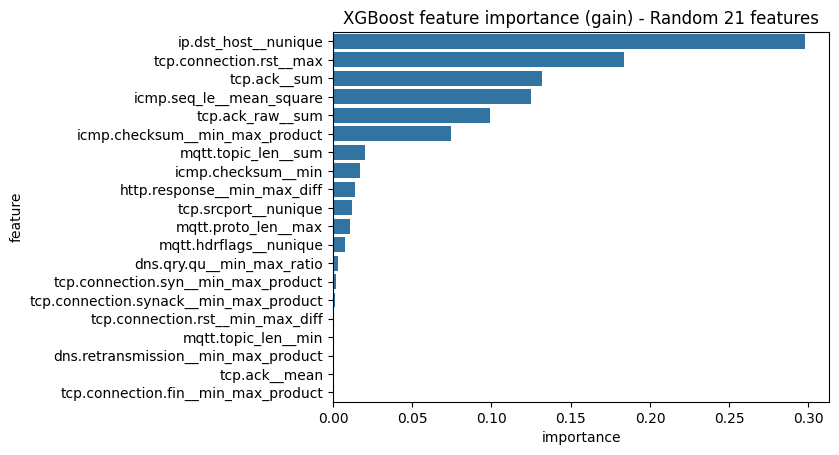

Round: 4
	Selected features: Index(['dns.retransmission__min_max_ratio',
       'tcp.connection.fin__min_max_ratio', 'http.content_length__min',
       'arp.opcode__min', 'http.response__min_max_ratio', 'tcp.ack_raw__min',
       'tcp.flags.ack__mean', 'http.content_length__min_max_ratio',
       'dns.retransmit_request__mean_square', 'mqtt.len__min_max_diff',
       'tcp.len__sum', 'tcp.connection.fin__min_max_diff', 'arp.hw.size__min',
       'arp.hw.size__mean_square', 'udp.time_delta__calculate_duration',
       'mqtt.topic_len__sum', 'mqtt.conflag.cleansess__min', 'dns.qry.qu__max',
       'dns.qry.type__min_max_product', 'mqtt.proto_len__mean_square',
       'mqtt.conflags__min'],
      dtype='object')


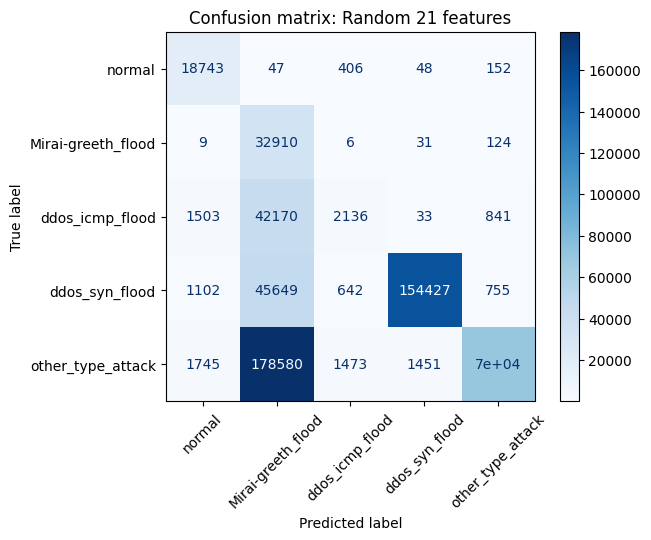

Test accuracy: 0.5015757702364916
Test precision: 0.6686735368322908
Test recall: 0.6093073123125066
Test f1-score: 0.49125616048853066


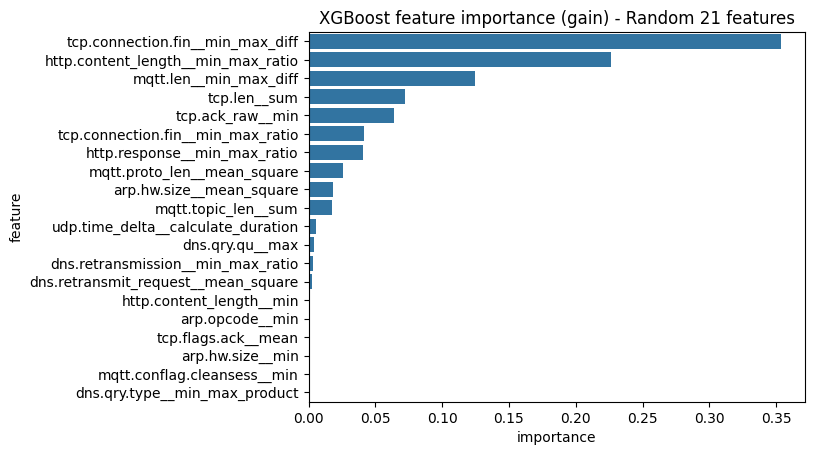

Round: 5
	Selected features: Index(['udp.time_delta__calculate_duration', 'http.request.method__nunique',
       'icmp.seq_le__min_max_product', 'arp.hw.size__mean_square',
       'tcp.connection.fin__mean_square', 'mqtt.len__min_max_diff',
       'tcp.flags__mean', 'dns.retransmit_request_in__max',
       'tcp.connection.rst__min', 'icmp.checksum__min_max_diff',
       'icmp.checksum__min', 'mqtt.conflags__sum',
       'tcp.dstport__min_max_product', 'mqtt.len__min_max_product',
       'tcp.connection.syn__min_max_ratio', 'dns.qry.type__min_max_diff',
       'dns.retransmission__min_max_product', 'mqtt.topic_len__max',
       'arp.hw.size__min_max_diff', 'tcp.connection.synack__sum',
       'mqtt.len__mean'],
      dtype='object')


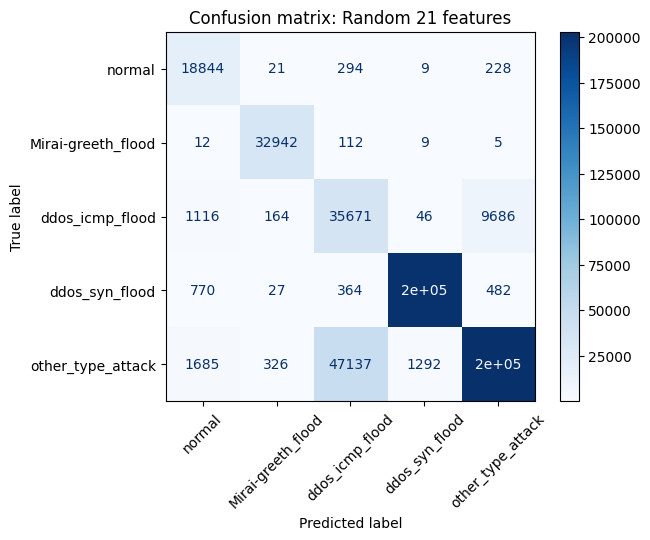

Test accuracy: 0.8851308519604383
Test precision: 0.8391098810971563
Test recall: 0.9048868507572484
Test f1-score: 0.8601977592474149


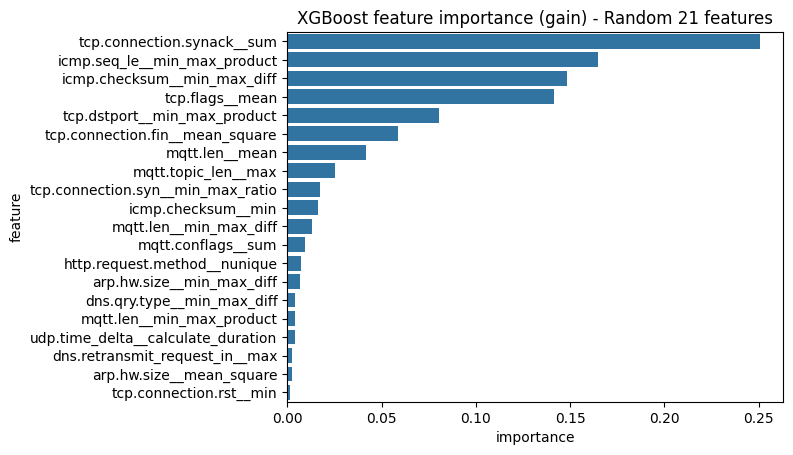

Round: 6
	Selected features: Index(['arp.src.proto_ipv4__nunique', 'mqtt.msgtype__nunique',
       'tcp.connection.synack__min_max_diff', 'mqtt.topic_len__min',
       'dns.qry.qu__mean_square', 'arp.hw.size__min_max_diff', 'tcp.ack__sum',
       'arp.hw.size__sum', 'mqtt.topic_len__mean_square', 'icmp.seq_le__max',
       'dns.retransmit_request__min_max_ratio', 'tcp.len__mean_square',
       'dns.retransmission__mean_square', 'mqtt.topic_len__min_max_diff',
       'tcp.len__max', 'http.response__min_max_diff',
       'tcp.connection.rst__max', 'tcp.len__min_max_ratio',
       'udp.time_delta__min_max_diff', 'mqtt.topic__nunique',
       'tcp.checksum__mean'],
      dtype='object')


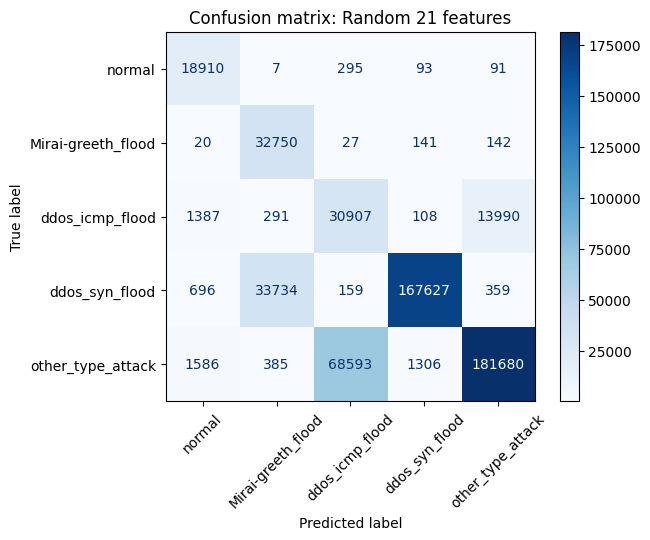

Test accuracy: 0.7777533658452251
Test precision: 0.7098895552980596
Test recall: 0.8342109693547609
Test f1-score: 0.736964882858255


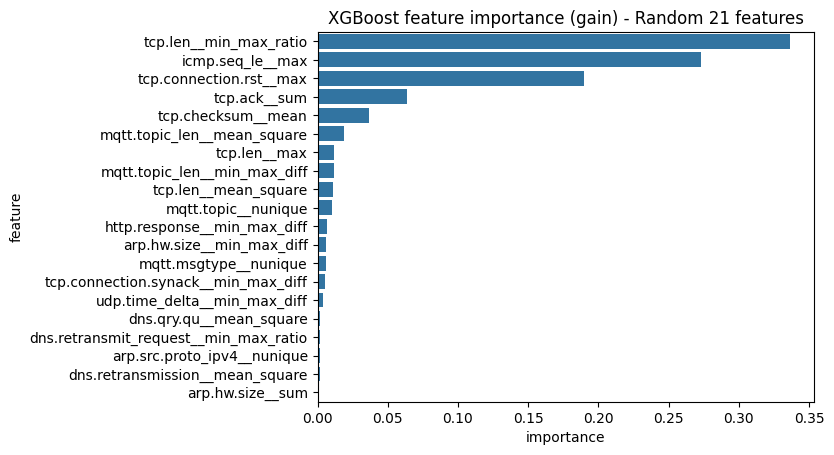

Round: 7
	Selected features: Index(['tcp.connection.rst__min_max_diff', 'arp.hw.size__max',
       'http.content_length__sum', 'mqtt.len__min_max_product',
       'mqtt.conflags__max', 'dns.qry.type__min', 'dns.qry.qu__min_max_diff',
       'mqtt.hdrflags__mean', 'arp.opcode__min_max_ratio',
       'arp.opcode__min_max_product', 'dns.retransmit_request__sum',
       'mqtt.conflag.cleansess__max', 'udp.time_delta__min',
       'mqtt.conflag.cleansess__min_max_product', 'http.content_length__min',
       'http.content_length__mean_square', 'dns.qry.type__max',
       'dns.retransmit_request_in__mean', 'tcp.connection.fin__mean_square',
       'mqtt.proto_len__sum', 'tcp.flags__mean_square'],
      dtype='object')


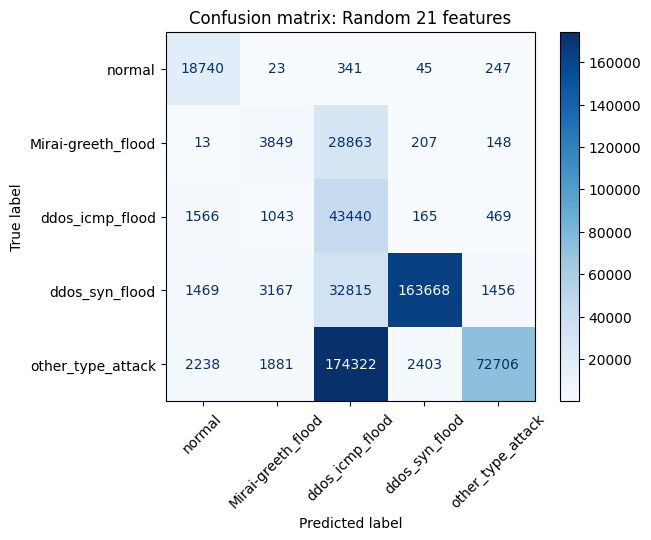

Test accuracy: 0.5445915963723068
Test precision: 0.6547442579224371
Test recall: 0.6215508527415192
Test f1-score: 0.5275231463792759


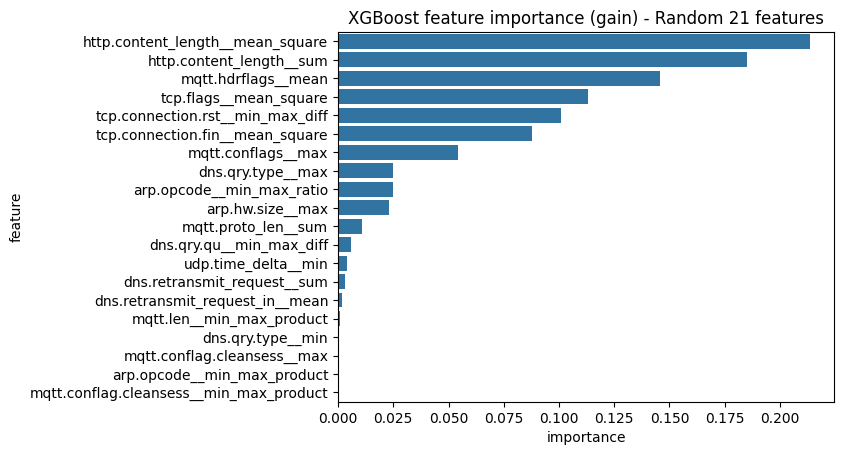

Round: 8
	Selected features: Index(['mqtt.proto_len__mean_square', 'tcp.flags__max', 'mqtt.hdrflags__mean',
       'dns.qry.qu__min_max_diff', 'dns.qry.name__nunique', 'arp.opcode__sum',
       'dns.qry.qu__min', 'dns.retransmission__mean_square',
       'icmp.checksum__mean', 'tcp.ack__min', 'tcp.dstport__min_max_diff',
       'tcp.checksum__min_max_product', 'dns.retransmission__min_max_product',
       'arp.hw.size__mean_square', 'tcp.seq__min_max_product',
       'tcp.flags__mean', 'tcp.dstport__min_max_ratio',
       'icmp.checksum__mean_square', 'icmp.checksum__max',
       'icmp.checksum__min_max_ratio', 'icmp.seq_le__sum'],
      dtype='object')


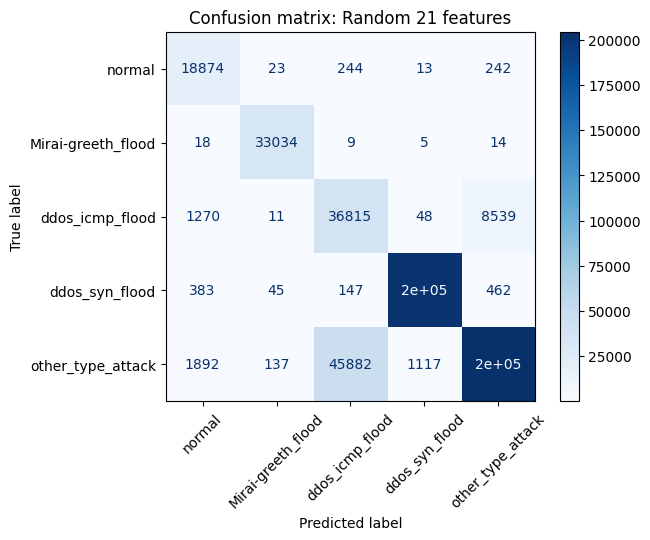

Test accuracy: 0.891044942768025
Test precision: 0.8457205361224889
Test recall: 0.9123656431511072
Test f1-score: 0.8671095430519861


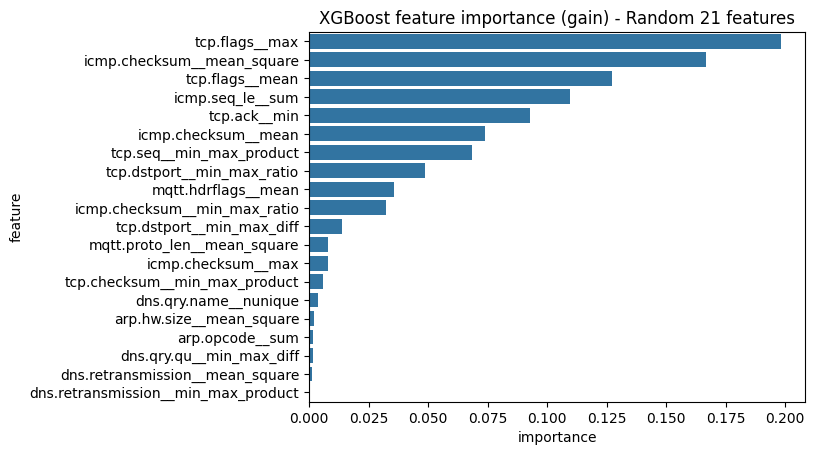

Round: 9
	Selected features: Index(['arp.hw.size__sum', 'dns.retransmission__min_max_ratio',
       'tcp.ack__mean', 'arp.opcode__mean', 'dns.retransmission__sum',
       'mqtt.conflags__max', 'icmp.seq_le__min', 'mqtt.msgtype__nunique',
       'tcp.connection.syn__max', 'tcp.checksum__min_max_product',
       'mqtt.conflags__min', 'dns.qry.name.len__nunique',
       'arp.hw.size__min_max_ratio', 'tcp.len__min_max_product',
       'udp.time_delta__min_max_ratio', 'tcp.flags__max',
       'dns.qry.type__mean_square', 'tcp.seq__min_max_ratio',
       'tcp.flags.ack__sum', 'http.response__min_max_product',
       'dns.qry.type__min_max_product'],
      dtype='object')


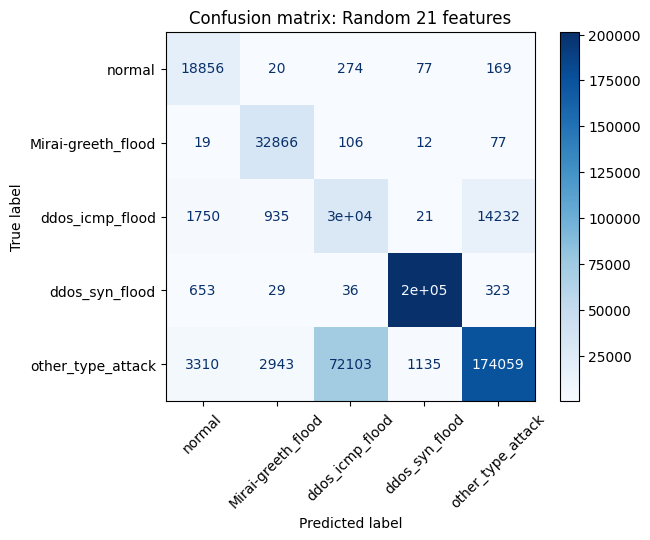

Test accuracy: 0.8231103363323993
Test precision: 0.7733001606412222
Test recall: 0.8568417849736489
Test f1-score: 0.7957539422280585


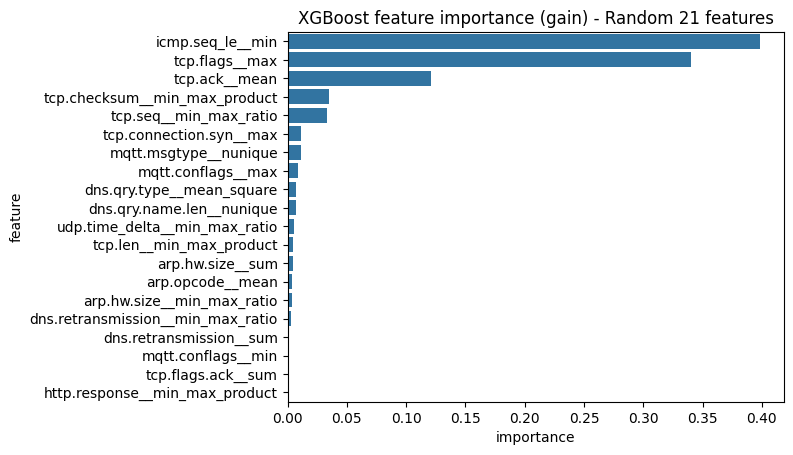

Round: 10
	Selected features: Index(['udp.time_delta__min_max_diff', 'mqtt.len__min_max_product',
       'mqtt.topic_len__min_max_product', 'mqtt.msg__nunique',
       'mqtt.proto_len__mean', 'dns.qry.type__mean', 'http.response__mean',
       'dns.qry.qu__min', 'tcp.flags__min_max_ratio', 'tcp.seq__sum',
       'tcp.len__sum', 'tcp.len__min_max_ratio',
       'tcp.connection.syn__min_max_product', 'tcp.dstport__mean_square',
       'tcp.connection.synack__min_max_ratio', 'tcp.flags.ack__min_max_ratio',
       'http.request.method__nunique', 'tcp.flags__mean_square',
       'mqtt.conflags__min_max_product', 'mqtt.conflag.cleansess__mean',
       'tcp.connection.fin__min_max_diff'],
      dtype='object')


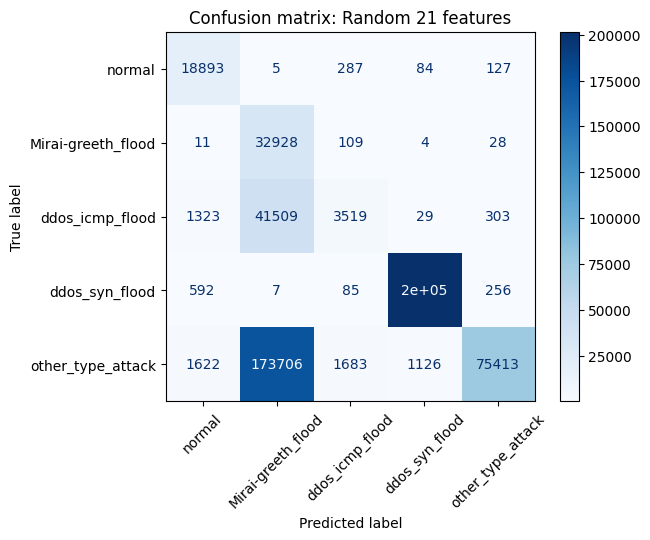

Test accuracy: 0.5985909912765359
Test precision: 0.7156594189287332
Test recall: 0.6675281828959909
Test f1-score: 0.5447702695739961


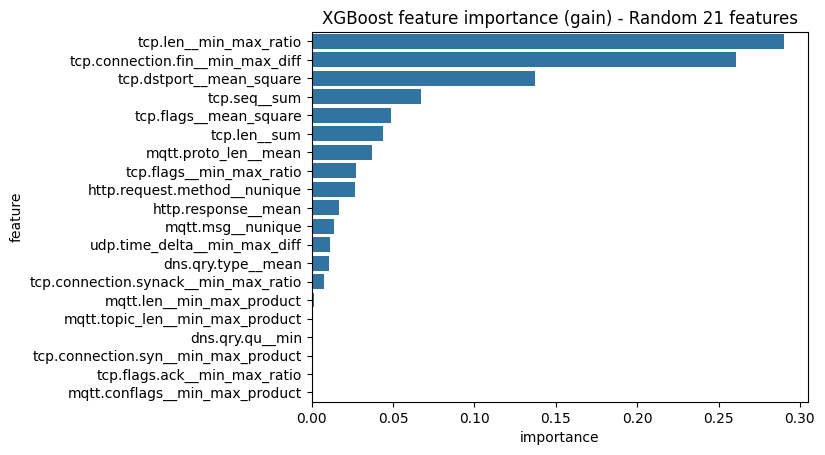

Round: 11
	Selected features: Index(['tcp.len__mean_square', 'dns.retransmit_request_in__min_max_product',
       'mqtt.hdrflags__mean', 'tcp.ack__min_max_product',
       'tcp.connection.fin__sum', 'tcp.flags__min_max_diff',
       'mqtt.conflags__nunique', 'dns.retransmit_request__max',
       'icmp.checksum__min', 'icmp.checksum__min_max_diff',
       'tcp.connection.fin__min_max_ratio', 'mqtt.len__sum',
       'mqtt.proto_len__mean', 'udp.time_delta__mean',
       'tcp.connection.synack__sum', 'tcp.ack__sum',
       'http.response__min_max_product', 'tcp.ack__min_max_ratio',
       'tcp.checksum__min_max_product', 'tcp.connection.fin__mean_square',
       'tcp.dstport__mean'],
      dtype='object')


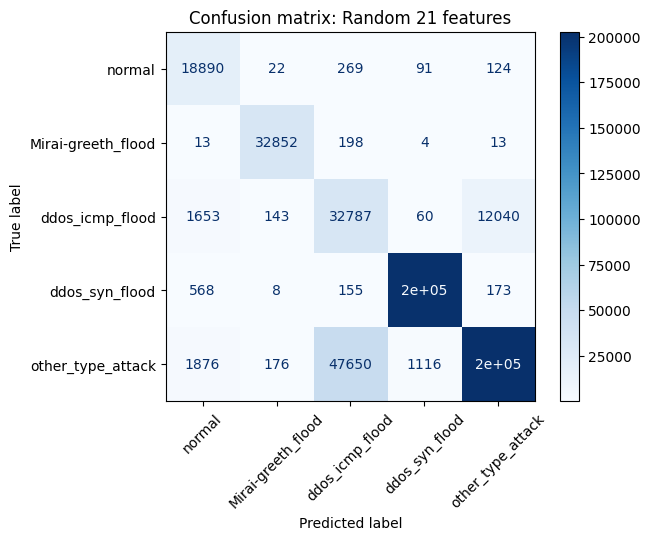

Test accuracy: 0.8805079923066395
Test precision: 0.8303185873204182
Test recall: 0.8928928046938733
Test f1-score: 0.851118429406592


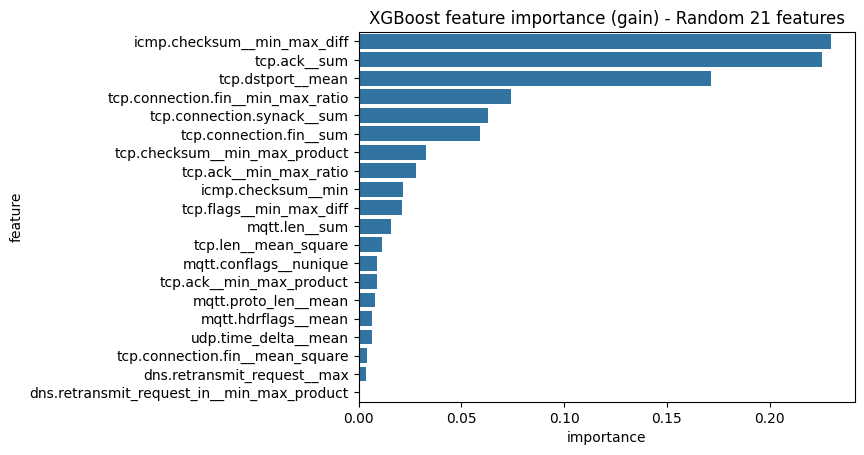

Round: 12
	Selected features: Index(['tcp.ack_raw__sum', 'tcp.checksum__sum', 'icmp.seq_le__min_max_diff',
       'tcp.connection.fin__min', 'tcp.ack_raw__max',
       'dns.retransmit_request_in__sum', 'icmp.seq_le__mean_square',
       'dns.retransmit_request__max', 'tcp.connection.syn__min_max_diff',
       'tcp.connection.synack__min_max_product', 'arp.opcode__min_max_product',
       'tcp.seq__sum', 'tcp.checksum__mean', 'tcp.connection.syn__sum',
       'tcp.flags__mean', 'http.response__mean_square',
       'mqtt.conflags__mean_square', 'tcp.connection.syn__mean_square',
       'mqtt.topic_len__min_max_ratio', 'dns.qry.type__sum',
       'http.content_length__sum'],
      dtype='object')


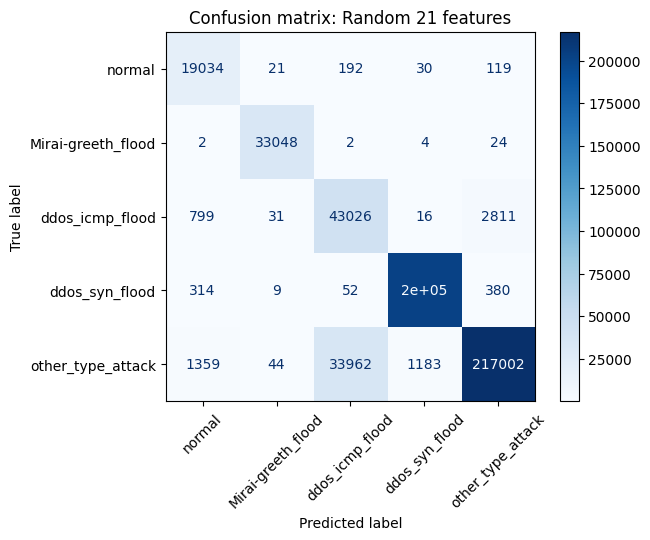

Test accuracy: 0.9255263973030017
Test precision: 0.8835376829141962
Test recall: 0.9508319969230825
Test f1-score: 0.9067941024283364


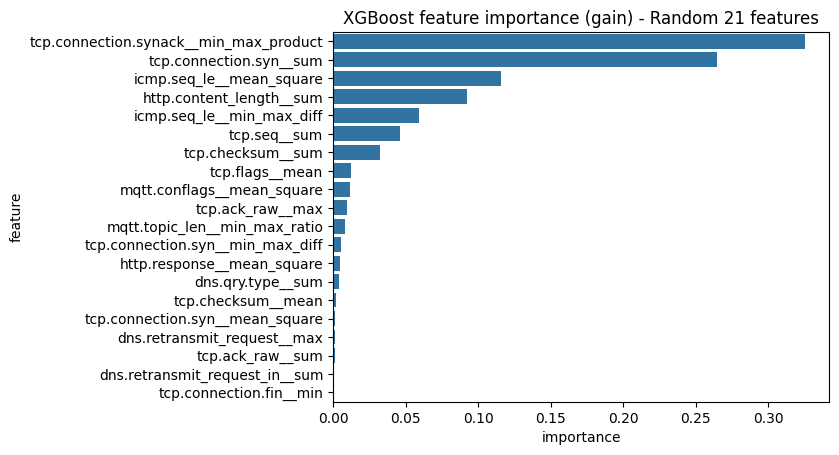

Round: 13
	Selected features: Index(['icmp.seq_le__min', 'mqtt.conflags__min',
       'mqtt.conflag.cleansess__mean_square', 'tcp.dstport__min',
       'tcp.connection.fin__min_max_diff', 'tcp.options__nunique',
       'tcp.seq__min_max_ratio', 'dns.retransmit_request_in__max',
       'tcp.dstport__mean', 'tcp.checksum__min', 'dns.qry.qu__min_max_ratio',
       'mqtt.topic_len__mean', 'dns.retransmission__sum',
       'mqtt.conflags__min_max_product', 'tcp.ack_raw__min_max_product',
       'arp.opcode__min', 'mqtt.conflags__sum',
       'tcp.connection.fin__mean_square', 'tcp.flags.ack__sum',
       'mqtt.topic_len__min_max_ratio', 'mqtt.topic_len__sum'],
      dtype='object')


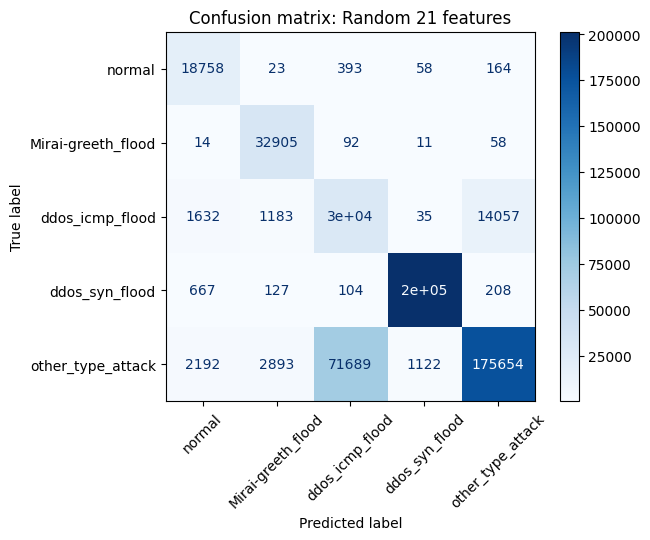

Test accuracy: 0.825815258498354
Test precision: 0.780411872809539
Test recall: 0.8573938307470556
Test f1-score: 0.8006344890878001


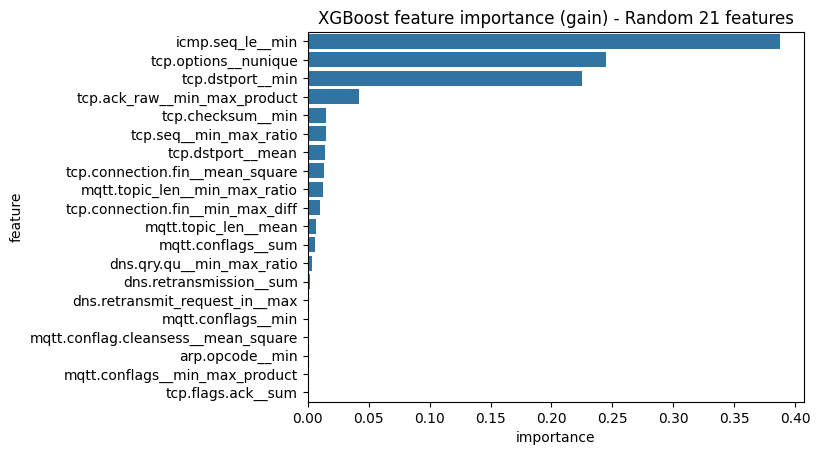

Round: 14
	Selected features: Index(['tcp.connection.synack__min_max_product', 'dns.retransmission__sum',
       'dns.qry.qu__min', 'dns.retransmit_request__min',
       'tcp.connection.synack__mean', 'mqtt.topic_len__mean_square',
       'tcp.dstport__sum', 'tcp.checksum__min_max_product',
       'mqtt.conflags__sum', 'arp.opcode__mean',
       'http.response__min_max_product', 'mqtt.topic_len__min_max_diff',
       'tcp.connection.syn__min_max_diff', 'mqtt.conflag.cleansess__mean',
       'dns.qry.qu__min_max_ratio', 'arp.hw.size__mean',
       'dns.qry.type__min_max_product', 'dns.qry.name.len__nunique',
       'mqtt.topic_len__sum', 'http.content_length__min_max_product',
       'tcp.connection.rst__min_max_ratio'],
      dtype='object')


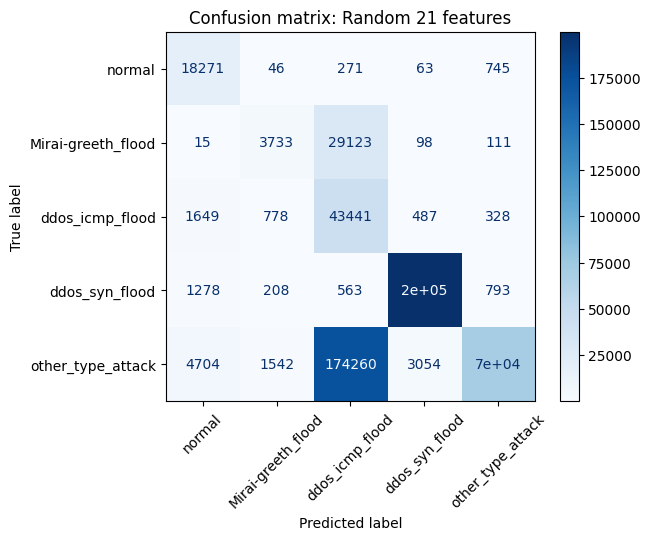

Test accuracy: 0.6035974384279036
Test precision: 0.6853204308428709
Test recall: 0.6494819454181069
Test f1-score: 0.541014121469966


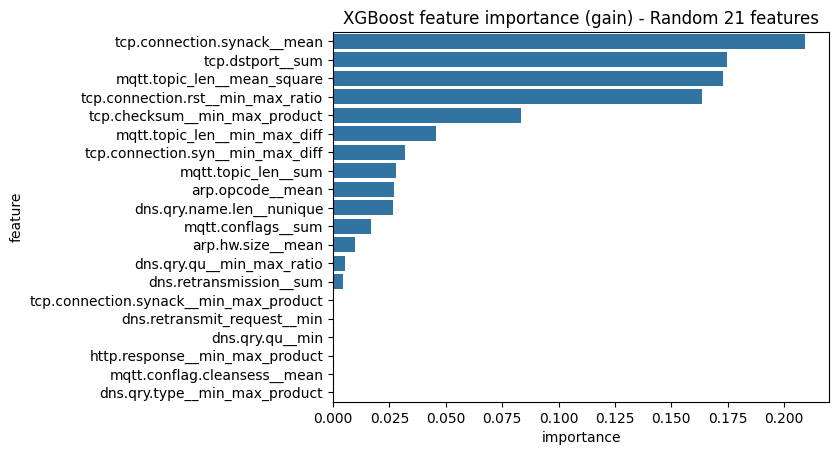

Round: 15
	Selected features: Index(['udp.time_delta__min', 'tcp.connection.fin__max', 'tcp.len__mean',
       'tcp.flags.ack__min_max_diff', 'mqtt.topic_len__min_max_ratio',
       'tcp.flags.ack__max', 'http.content_length__min_max_ratio',
       'udp.time_delta__min_max_diff', 'mqtt.len__min_max_product',
       'tcp.connection.rst__sum', 'mqtt.len__mean', 'arp.opcode__mean',
       'http.content_length__sum', 'tcp.connection.fin__min_max_ratio',
       'dns.retransmission__sum', 'mqtt.conflags__mean_square',
       'tcp.ack_raw__min', 'icmp.seq_le__min_max_ratio', 'mqtt.hdrflags__mean',
       'mqtt.len__min_max_ratio', 'dns.qry.qu__min_max_ratio'],
      dtype='object')


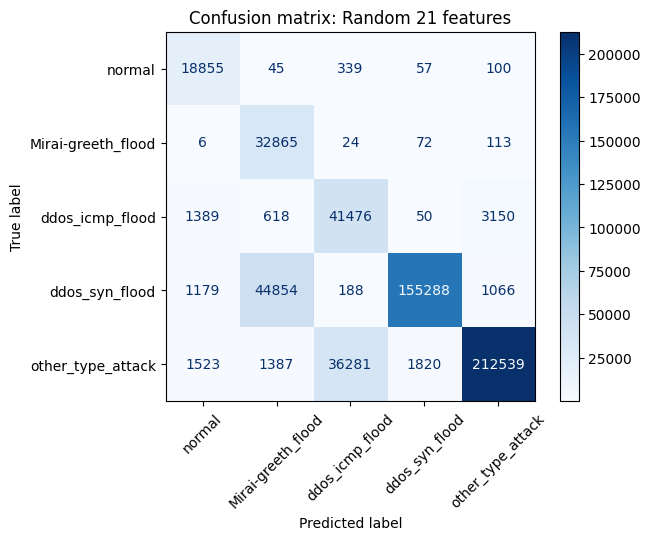

Test accuracy: 0.8302472248435036
Test precision: 0.7460057873235795
Test recall: 0.8917783878367841
Test f1-score: 0.7806139900433713


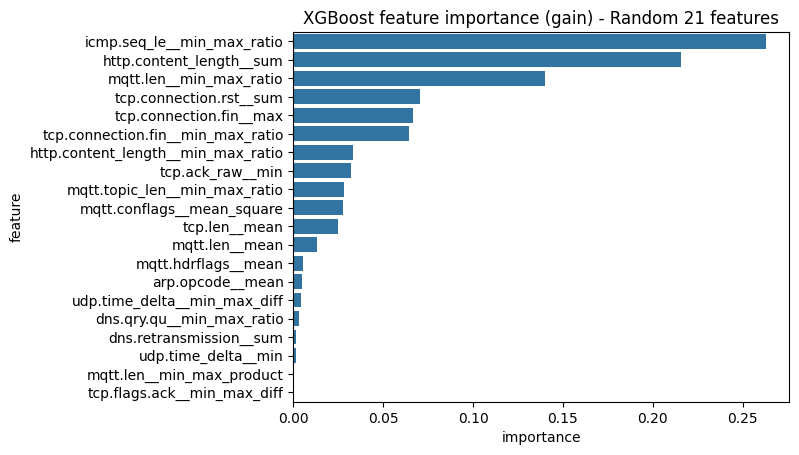

Round: 16
	Selected features: Index(['tcp.connection.syn__mean', 'tcp.payload__nunique',
       'dns.retransmission__min', 'http.response__min_max_product',
       'tcp.connection.synack__mean', 'udp.time_delta__mean_square',
       'mqtt.topic_len__max', 'mqtt.topic_len__min',
       'mqtt.conflag.cleansess__min_max_diff', 'mqtt.hdrflags__mean',
       'dns.qry.qu__sum', 'arp.opcode__max', 'tcp.connection.rst__mean',
       'tcp.flags.ack__min', 'tcp.checksum__min', 'udp.time_delta__sum',
       'mqtt.conflags__min_max_product', 'tcp.connection.fin__min_max_diff',
       'dns.qry.qu__min', 'http.response__max',
       'http.request.version__nunique'],
      dtype='object')


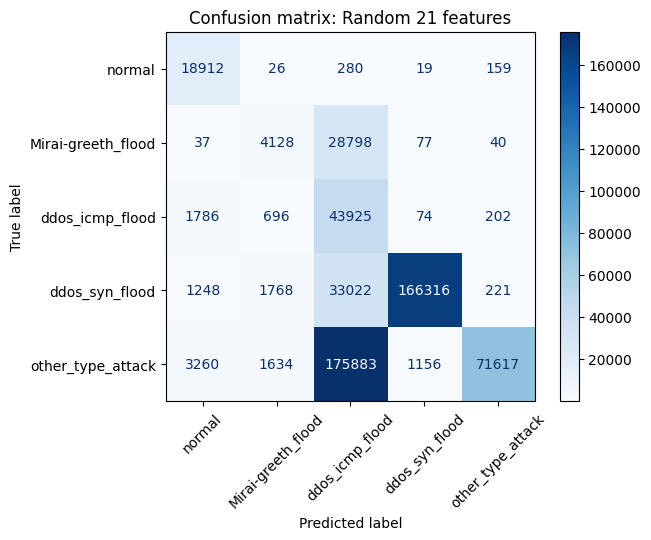

Test accuracy: 0.5490847926466457
Test precision: 0.6777466774236991
Test recall: 0.6288444165129918
Test f1-score: 0.5305127894308901


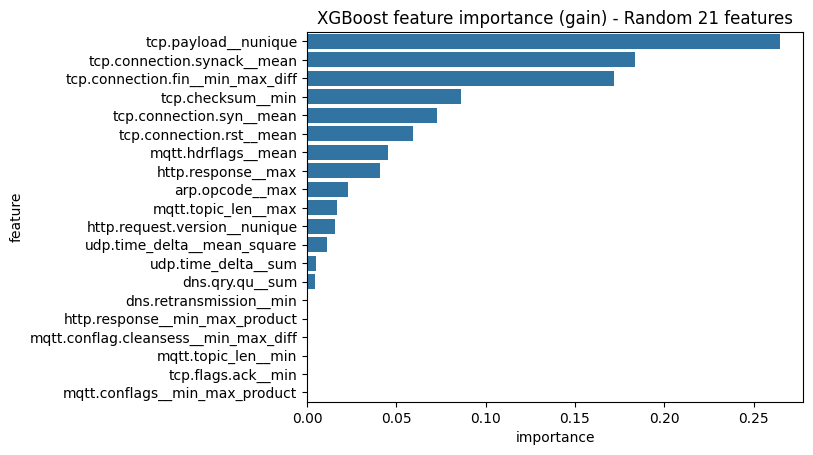

Round: 17
	Selected features: Index(['tcp.connection.syn__max', 'tcp.ack__sum', 'dns.qry.qu__sum',
       'tcp.connection.syn__min', 'dns.qry.type__min_max_ratio',
       'mqtt.len__min_max_product', 'dns.retransmission__min_max_ratio',
       'tcp.connection.syn__min_max_ratio', 'tcp.ack__mean',
       'tcp.connection.synack__max', 'dns.qry.qu__min_max_diff',
       'tcp.connection.fin__min_max_diff', 'udp.time_delta__sum',
       'icmp.seq_le__min_max_diff', 'dns.retransmit_request__min_max_product',
       'tcp.seq__sum', 'http.file_data__nunique', 'dns.retransmission__min',
       'tcp.connection.synack__min_max_diff', 'dns.retransmit_request_in__max',
       'tcp.flags__min_max_product'],
      dtype='object')


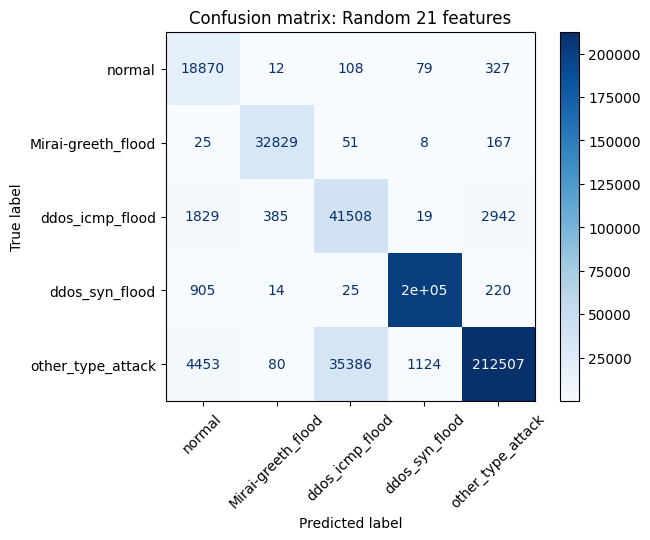

Test accuracy: 0.9132714070637727
Test precision: 0.8448575959461339
Test recall: 0.9373639728324938
Test f1-score: 0.877676702282475


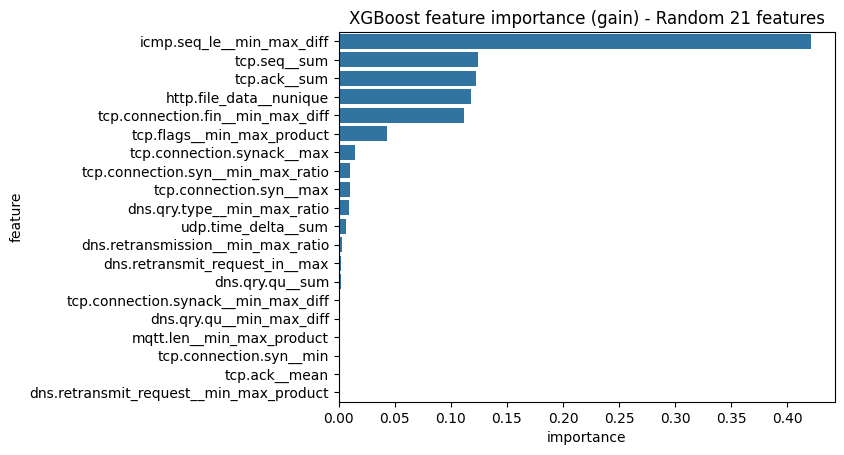

Round: 18
	Selected features: Index(['ip.dst_host__nunique', 'http.content_length__sum',
       'mqtt.topic_len__min_max_ratio', 'dns.qry.qu__min_max_diff',
       'tcp.srcport__nunique', 'udp.time_delta__sum',
       'tcp.connection.syn__min_max_product', 'arp.opcode__mean_square',
       'tcp.connection.synack__sum', 'tcp.flags.ack__sum',
       'tcp.flags.ack__min_max_diff', 'tcp.checksum__min_max_product',
       'mqtt.proto_len__min_max_product', 'dns.qry.type__mean',
       'mqtt.hdrflags__mean_square', 'udp.time_delta__min',
       'arp.hw.size__min_max_product', 'mqtt.conflag.cleansess__min',
       'mqtt.conflags__mean', 'mqtt.protoname__nunique',
       'arp.hw.size__min_max_diff'],
      dtype='object')


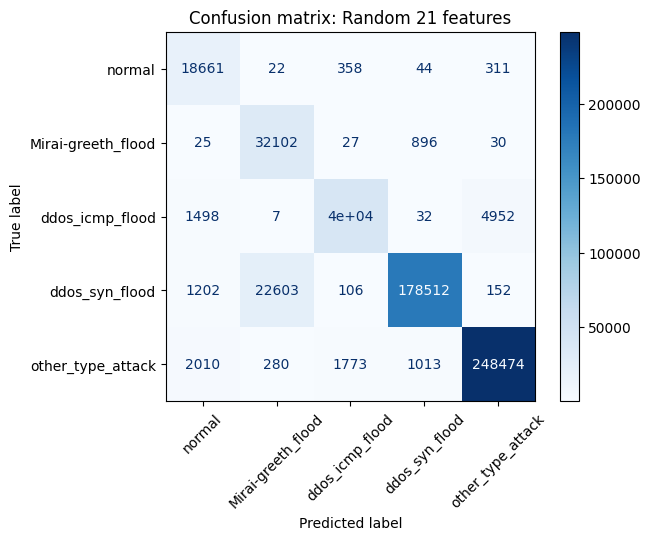

Test accuracy: 0.9327533298276197
Test precision: 0.8590749255217316
Test recall: 0.9309468385341164
Test f1-score: 0.8828124121768381


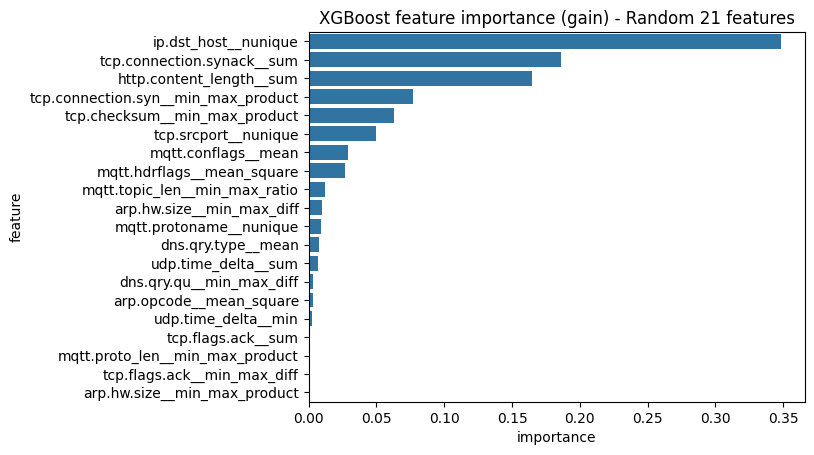

Round: 19
	Selected features: Index(['tcp.ack__min_max_ratio', 'udp.time_delta__max', 'tcp.len__sum',
       'tcp.seq__min_max_diff', 'dns.qry.qu__min', 'icmp.seq_le__min',
       'arp.opcode__min_max_ratio', 'ip.dst_host__nunique', 'arp.opcode__max',
       'icmp.checksum__mean', 'mqtt.len__mean_square', 'dns.qry.type__sum',
       'mqtt.hdrflags__nunique', 'tcp.seq__mean_square', 'tcp.checksum__mean',
       'tcp.ack_raw__max', 'tcp.ack__max', 'dns.qry.qu__min_max_product',
       'mqtt.msg__nunique', 'tcp.connection.synack__mean',
       'tcp.connection.fin__min'],
      dtype='object')


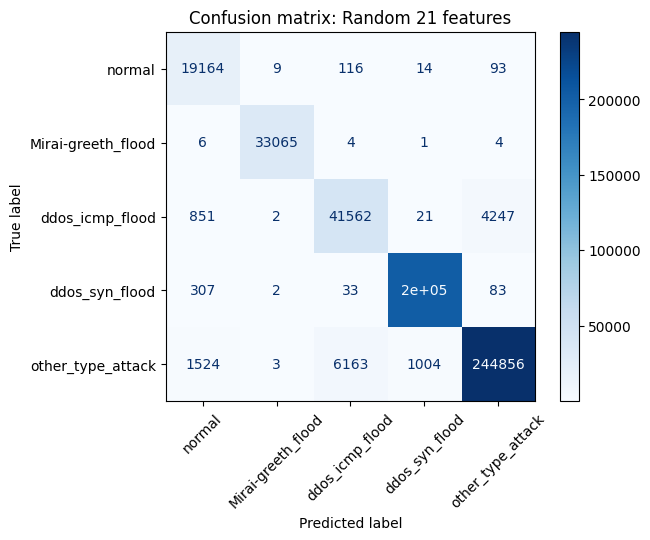

Test accuracy: 0.97391064752451
Test precision: 0.9443422163803985
Test recall: 0.9683001842426922
Test f1-score: 0.9556174275341304


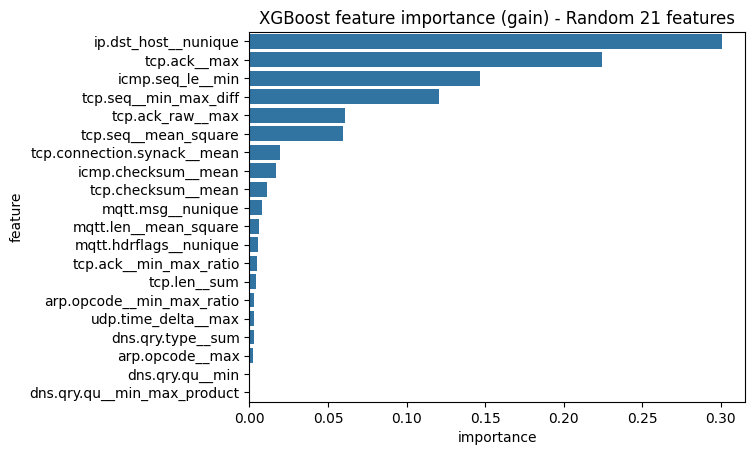

Round: 20
	Selected features: Index(['tcp.options__nunique', 'tcp.flags__mean', 'tcp.len__min_max_ratio',
       'mqtt.conflags__nunique', 'mqtt.topic_len__min_max_diff',
       'http.content_length__mean_square', 'tcp.flags__min_max_product',
       'tcp.seq__max', 'udp.time_delta__calculate_duration',
       'tcp.flags.ack__mean', 'dns.qry.qu__min_max_product',
       'dns.qry.type__min_max_diff', 'dns.qry.qu__mean_square',
       'icmp.checksum__sum', 'arp.hw.size__max', 'udp.port__nunique',
       'mqtt.proto_len__min_max_diff', 'tcp.len__max', 'tcp.ack__max',
       'arp.hw.size__min', 'arp.opcode__min_max_product'],
      dtype='object')


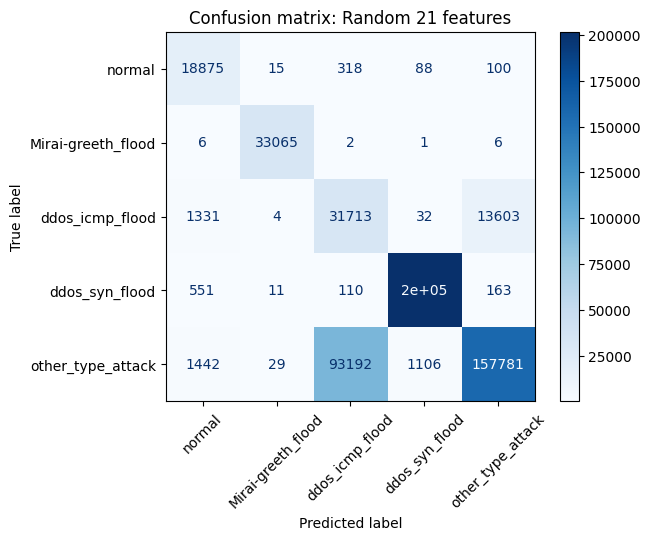

Test accuracy: 0.7981033128993452
Test precision: 0.8028837924977263
Test recall: 0.8540354907699574
Test f1-score: 0.8024178733683381


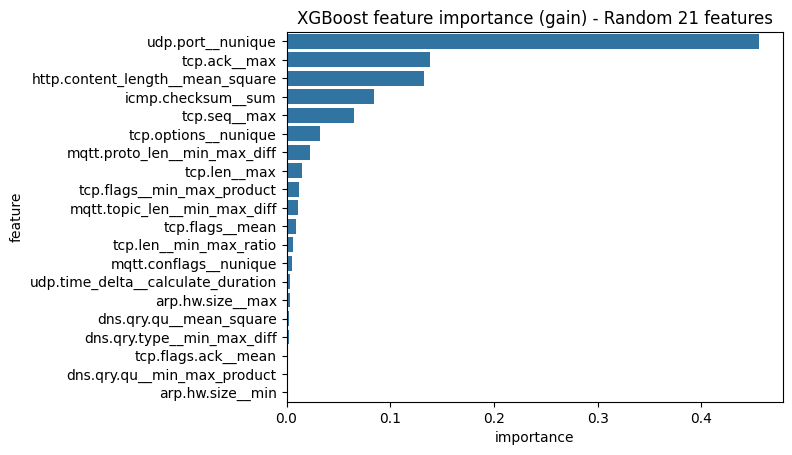

Round: 21
	Selected features: Index(['arp.dst.proto_ipv4__nunique', 'tcp.connection.synack__min_max_product',
       'tcp.checksum__mean_square', 'icmp.checksum__min_max_ratio',
       'udp.time_delta__min', 'dns.retransmit_request_in__min_max_diff',
       'icmp.seq_le__max', 'tcp.connection.rst__min_max_diff',
       'mqtt.hdrflags__min', 'mqtt.topic_len__min_max_product',
       'icmp.seq_le__min', 'mqtt.proto_len__min_max_diff',
       'dns.retransmit_request__min_max_diff', 'tcp.connection.synack__sum',
       'icmp.checksum__min', 'tcp.flags__max', 'mqtt.hdrflags__sum',
       'tcp.seq__min_max_product', 'http.response__mean', 'arp.hw.size__max',
       'dns.retransmission__min_max_diff'],
      dtype='object')


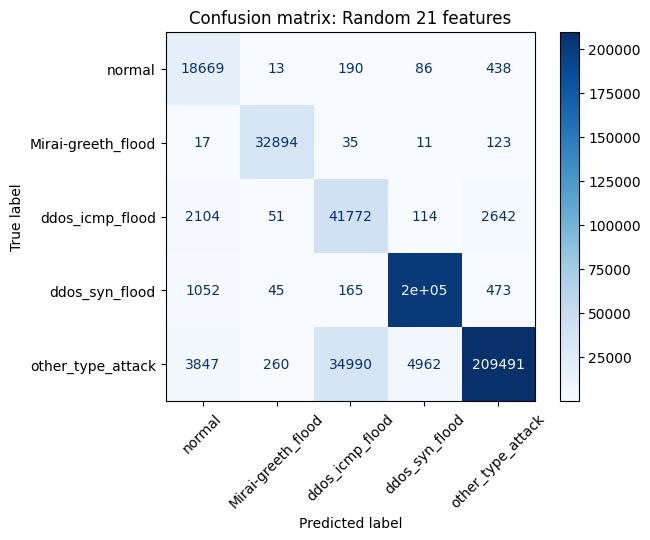

Test accuracy: 0.9070421622088877
Test precision: 0.8429415674730855
Test recall: 0.9338726401851221
Test f1-score: 0.875051555927762


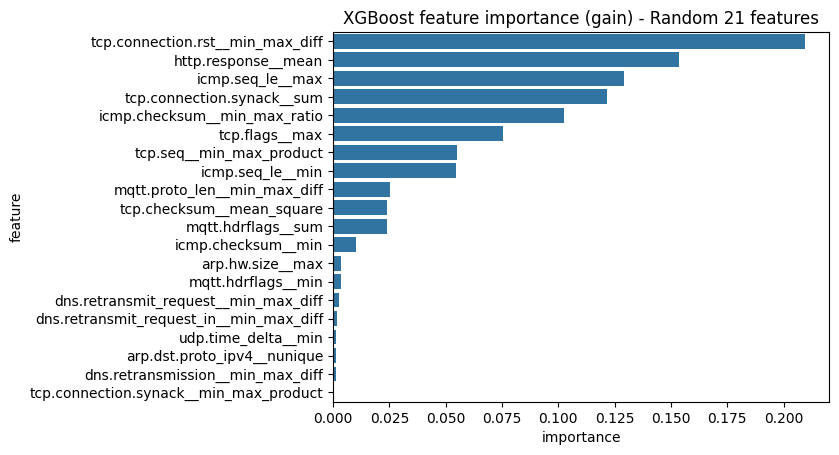

Round: 22
	Selected features: Index(['dns.retransmission__min_max_product', 'mqtt.proto_len__min',
       'dns.retransmit_request__min_max_diff',
       'mqtt.proto_len__min_max_product', 'mqtt.hdrflags__min_max_diff',
       'mqtt.hdrflags__min', 'ip.dst_host__nunique', 'icmp.checksum__max',
       'tcp.len__min_max_product', 'udp.time_delta__mean_square',
       'tcp.connection.syn__min', 'dns.retransmit_request__mean_square',
       'mqtt.conflags__nunique', 'mqtt.protoname__nunique',
       'tcp.dstport__min_max_ratio', 'mqtt.topic_len__max',
       'tcp.connection.syn__sum', 'mqtt.len__min_max_diff',
       'tcp.payload__nunique', 'tcp.len__mean', 'tcp.connection.synack__max'],
      dtype='object')


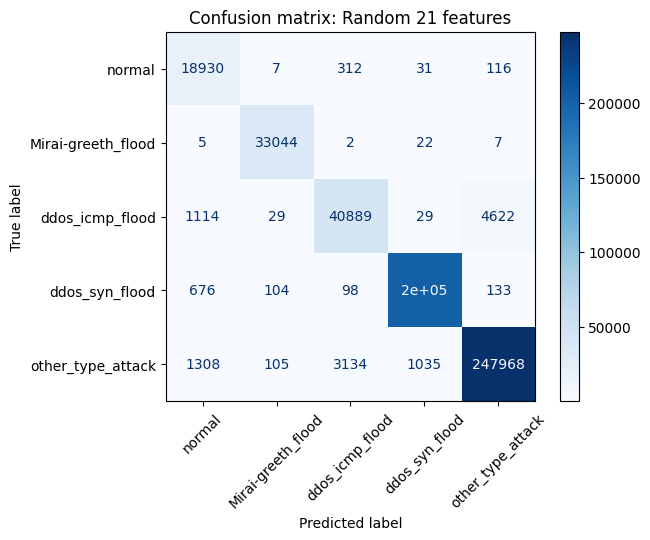

Test accuracy: 0.9767884541964112
Test precision: 0.9494401102674924
Test recall: 0.964753265609418
Test f1-score: 0.9562414985880684


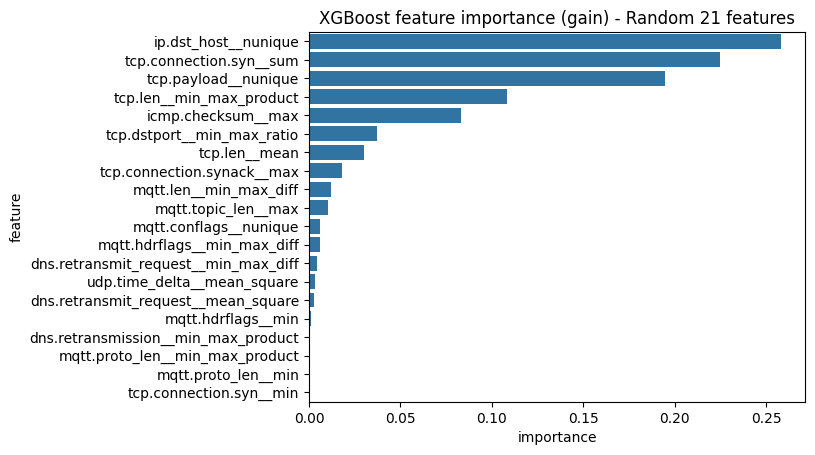

Round: 23
	Selected features: Index(['mqtt.conflag.cleansess__mean', 'tcp.connection.synack__mean_square',
       'mqtt.hdrflags__min_max_diff', 'tcp.dstport__min_max_diff',
       'udp.time_delta__min_max_ratio', 'udp.time_delta__min_max_diff',
       'dns.retransmit_request_in__max', 'tcp.seq__min_max_product',
       'dns.retransmission__min_max_ratio', 'tcp.connection.fin__max',
       'udp.time_delta__sum', 'tcp.dstport__max', 'icmp.seq_le__max',
       'tcp.checksum__mean', 'mqtt.conflag.cleansess__min_max_ratio',
       'tcp.srcport__nunique', 'mqtt.conflag.cleansess__mean_square',
       'mqtt.conflags__min_max_diff', 'http.content_length__mean_square',
       'http.file_data__nunique', 'tcp.flags.ack__min_max_ratio'],
      dtype='object')


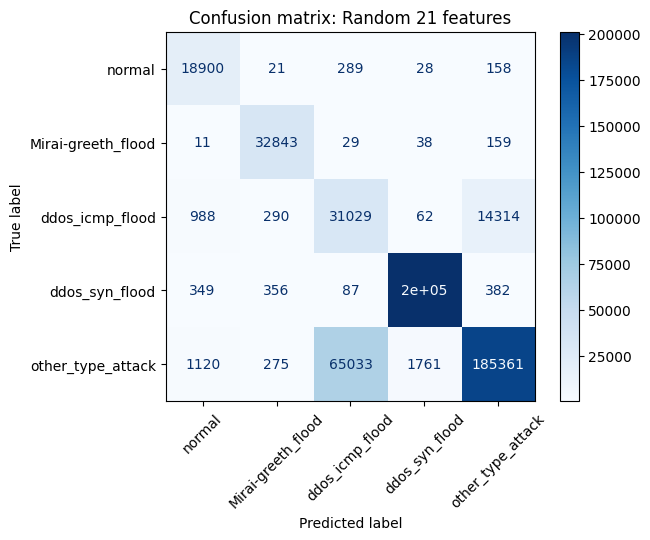

Test accuracy: 0.8455745168238235
Test precision: 0.8188109986808865
Test recall: 0.8714410592630404
Test f1-score: 0.8304663370548833


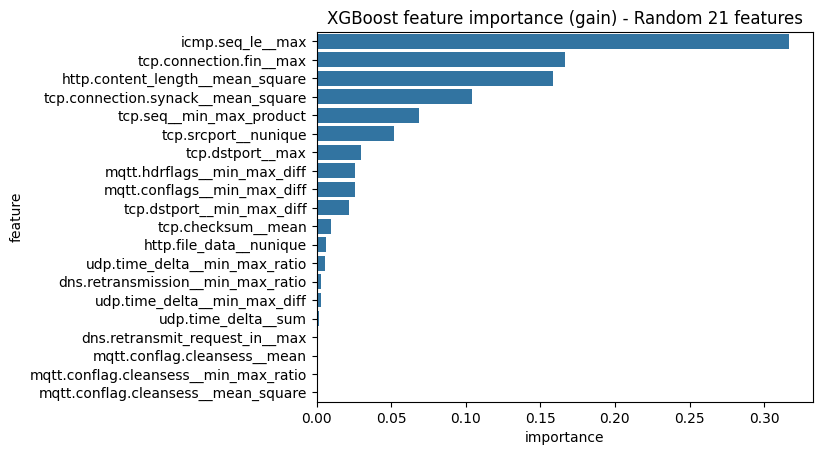

Round: 24
	Selected features: Index(['arp.opcode__max', 'mqtt.hdrflags__mean',
       'icmp.seq_le__min_max_product', 'tcp.connection.synack__mean_square',
       'mqtt.hdrflags__sum', 'tcp.dstport__sum',
       'http.response__min_max_ratio', 'tcp.connection.fin__min',
       'arp.hw.size__min_max_ratio', 'mqtt.proto_len__min',
       'tcp.checksum__sum', 'udp.stream__nunique', 'ip.dst_host__nunique',
       'dns.retransmission__min', 'tcp.flags__min_max_ratio',
       'icmp.checksum__max', 'dns.retransmit_request__min_max_ratio',
       'tcp.connection.synack__min_max_diff', 'mqtt.topic_len__sum',
       'tcp.dstport__mean_square', 'arp.opcode__min_max_product'],
      dtype='object')


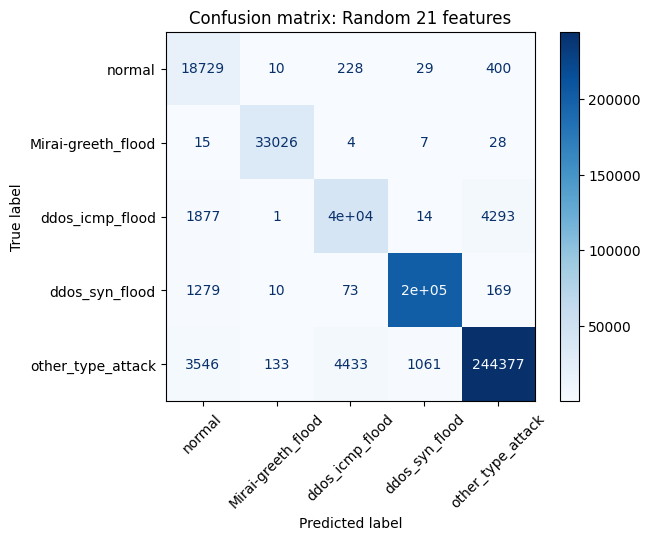

Test accuracy: 0.9682864984404377
Test precision: 0.9203069997468255
Test recall: 0.9575507507422403
Test f1-score: 0.9357729355913726


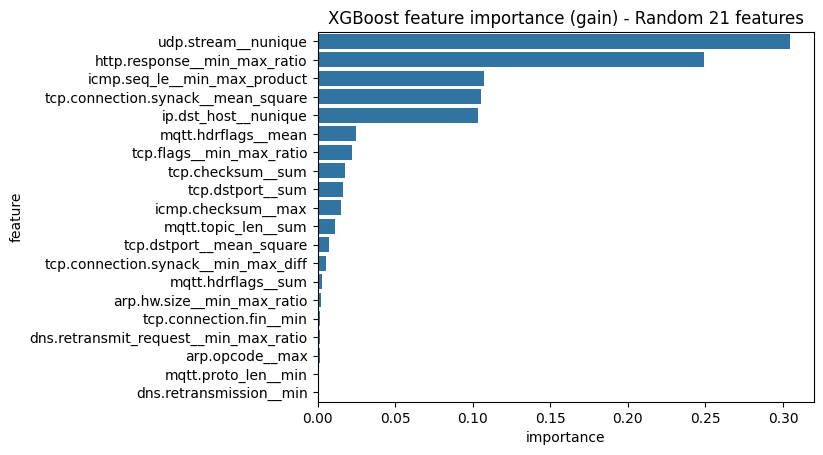

Round: 25
	Selected features: Index(['mqtt.msgtype__nunique', 'tcp.connection.syn__min_max_ratio',
       'http.request.version__nunique', 'dns.retransmission__sum',
       'tcp.connection.synack__sum', 'tcp.checksum__sum', 'dns.qry.qu__mean',
       'icmp.seq_le__min_max_diff', 'tcp.connection.fin__mean_square',
       'arp.hw.size__min_max_diff', 'tcp.ack_raw__mean',
       'dns.qry.type__mean_square', 'tcp.checksum__min_max_product',
       'udp.time_delta__mean', 'dns.qry.type__min', 'tcp.connection.syn__max',
       'tcp.connection.synack__min_max_diff',
       'tcp.connection.synack__min_max_ratio', 'http.response__mean_square',
       'http.file_data__nunique', 'mqtt.conflag.cleansess__mean'],
      dtype='object')


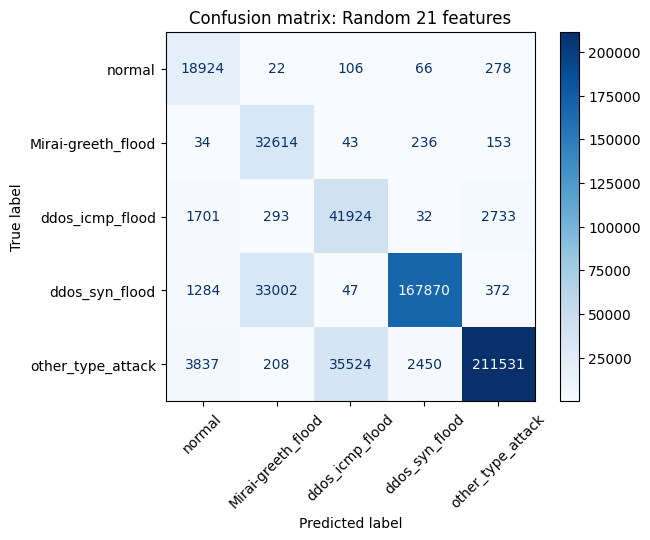

Test accuracy: 0.8515696472435726
Test precision: 0.7468733746377094
Test recall: 0.9045186261793468
Test f1-score: 0.7943925633748938


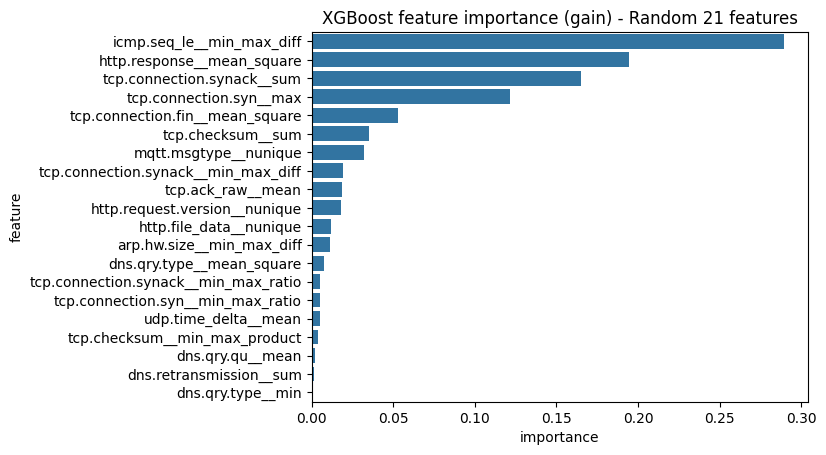

Round: 26
	Selected features: Index(['arp.opcode__min_max_diff', 'mqtt.conflags__sum', 'tcp.ack_raw__sum',
       'tcp.connection.syn__min_max_ratio', 'tcp.flags__min_max_ratio',
       'tcp.dstport__min', 'mqtt.msgtype__nunique', 'tcp.connection.fin__mean',
       'tcp.checksum__min', 'dns.retransmission__min_max_product',
       'tcp.ack_raw__min_max_product', 'dns.qry.name.len__nunique',
       'http.response__min_max_diff', 'dns.qry.qu__mean',
       'tcp.connection.syn__min_max_diff', 'mqtt.len__mean',
       'udp.time_delta__mean', 'mqtt.proto_len__max', 'udp.time_delta__sum',
       'tcp.connection.syn__min_max_product', 'tcp.ack_raw__min_max_ratio'],
      dtype='object')


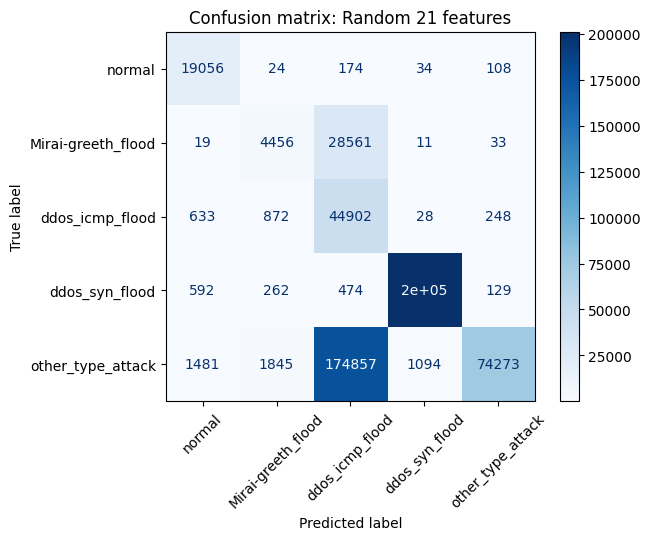

Test accuracy: 0.6191516413222783
Test precision: 0.7279895030155757
Test recall: 0.6729526781403996
Test f1-score: 0.5790171016440298


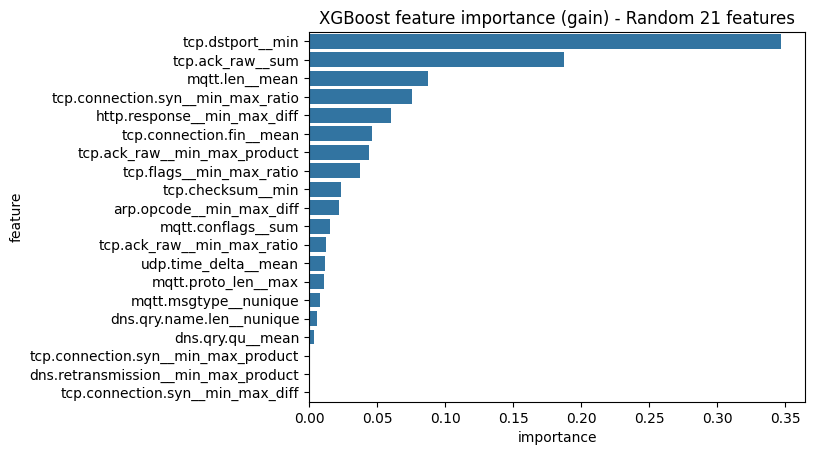

Round: 27
	Selected features: Index(['tcp.connection.rst__mean', 'arp.hw.size__min_max_diff',
       'ip.src_host__nunique', 'dns.retransmission__max',
       'tcp.connection.synack__mean_square', 'tcp.len__mean_square',
       'arp.src.proto_ipv4__nunique', 'http.response__min_max_product',
       'mqtt.topic_len__sum', 'mqtt.conflag.cleansess__min_max_ratio',
       'udp.time_delta__min_max_product', 'tcp.ack_raw__sum',
       'tcp.connection.syn__min', 'dns.qry.qu__min_max_product',
       'udp.time_delta__mean_square', 'tcp.connection.syn__mean',
       'tcp.connection.rst__min_max_diff', 'mqtt.len__mean',
       'dns.qry.qu__mean', 'tcp.seq__min_max_product', 'tcp.seq__mean_square'],
      dtype='object')


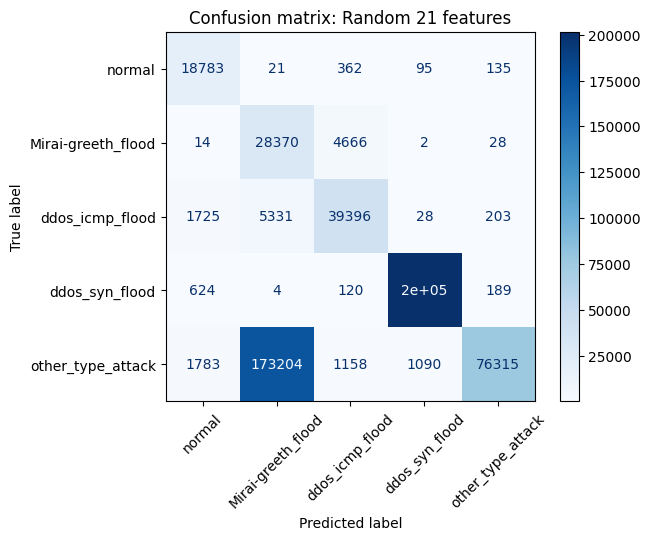

Test accuracy: 0.656424460276183
Test precision: 0.76101801581162
Test recall: 0.7932557252625825
Test f1-score: 0.6866904716059704


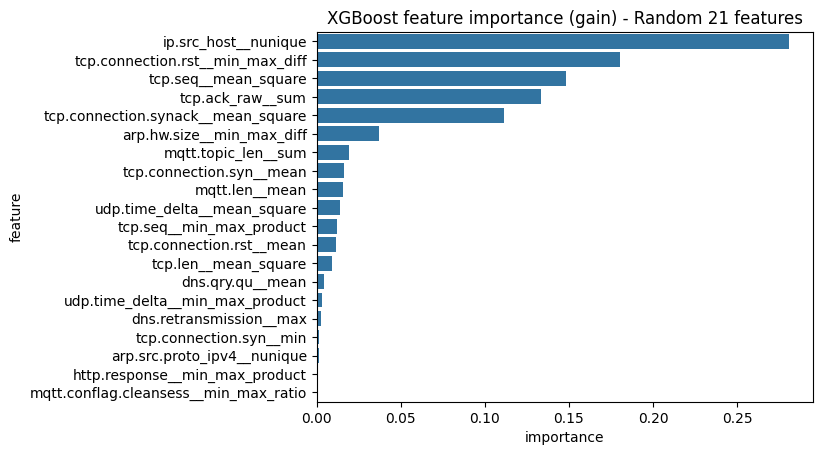

Round: 28
	Selected features: Index(['mqtt.conflag.cleansess__min_max_ratio', 'tcp.connection.rst__sum',
       'dns.retransmit_request__min_max_ratio', 'http.response__min',
       'mqtt.len__sum', 'http.content_length__min_max_ratio',
       'tcp.checksum__min_max_ratio', 'dns.retransmit_request_in__mean',
       'tcp.connection.syn__min', 'tcp.seq__max', 'mqtt.msg__nunique',
       'dns.qry.type__mean_square', 'tcp.len__min_max_product',
       'tcp.len__min_max_ratio', 'tcp.flags.ack__min',
       'tcp.connection.synack__min', 'arp.hw.size__max', 'tcp.ack__sum',
       'arp.opcode__min_max_product', 'mqtt.conflags__mean_square',
       'http.content_length__mean'],
      dtype='object')


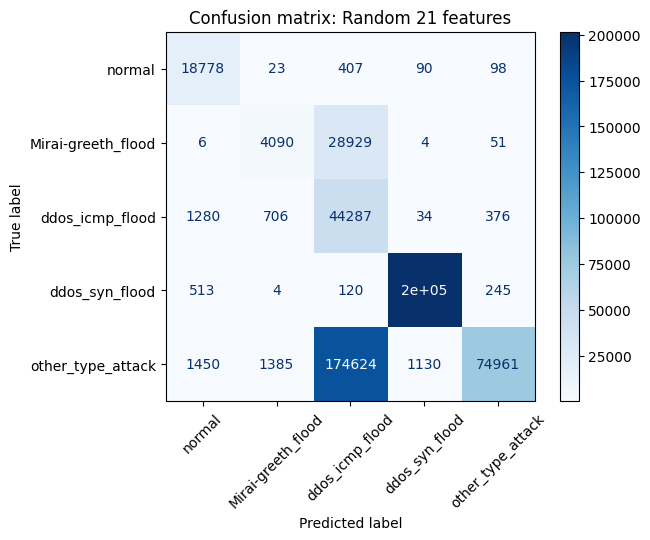

Test accuracy: 0.6191588448433595
Test precision: 0.7346546313202381
Test recall: 0.6663488829201147
Test f1-score: 0.5730152197647762


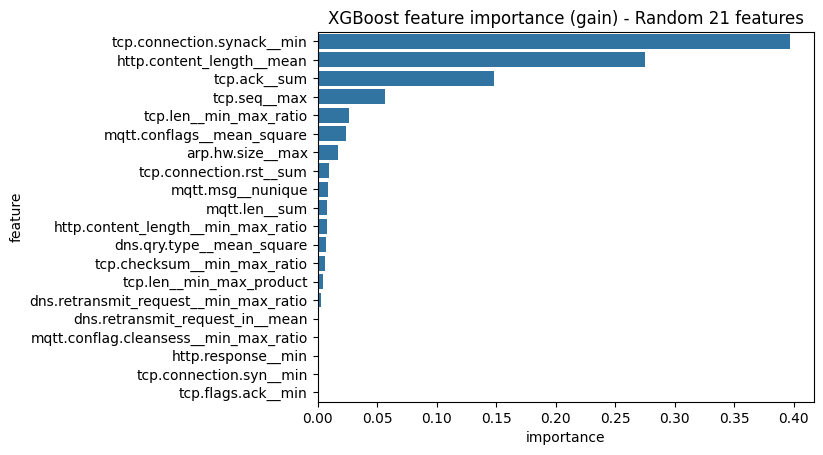

Round: 29
	Selected features: Index(['tcp.ack_raw__max', 'tcp.ack__max', 'dns.retransmission__max',
       'arp.dst.proto_ipv4__nunique', 'tcp.dstport__mean', 'tcp.checksum__min',
       'arp.opcode__mean_square', 'tcp.connection.fin__min_max_diff',
       'tcp.connection.rst__min', 'dns.retransmission__min_max_diff',
       'mqtt.len__min_max_product', 'mqtt.topic_len__min', 'tcp.len__max',
       'udp.time_delta__mean', 'mqtt.len__sum', 'http.response__min',
       'tcp.connection.syn__min_max_diff', 'tcp.ack_raw__sum',
       'arp.hw.size__max', 'http.response__min_max_diff',
       'http.request.full_uri__nunique'],
      dtype='object')


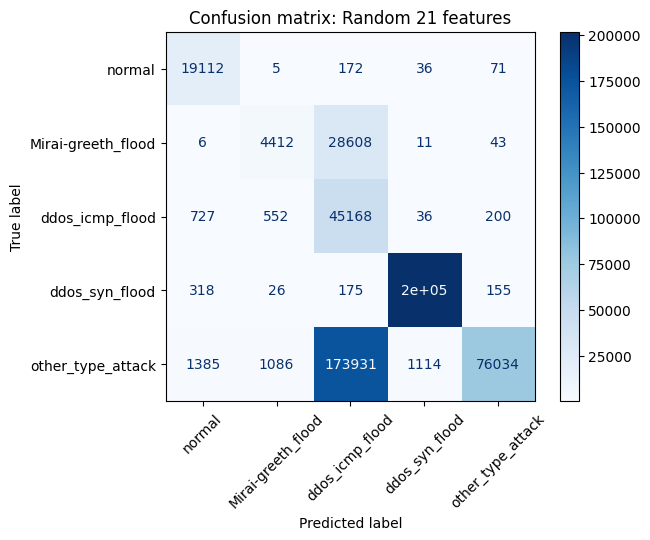

Test accuracy: 0.6242337254449976
Test precision: 0.7565107652881966
Test recall: 0.6765658183144595
Test f1-score: 0.5843034061648681


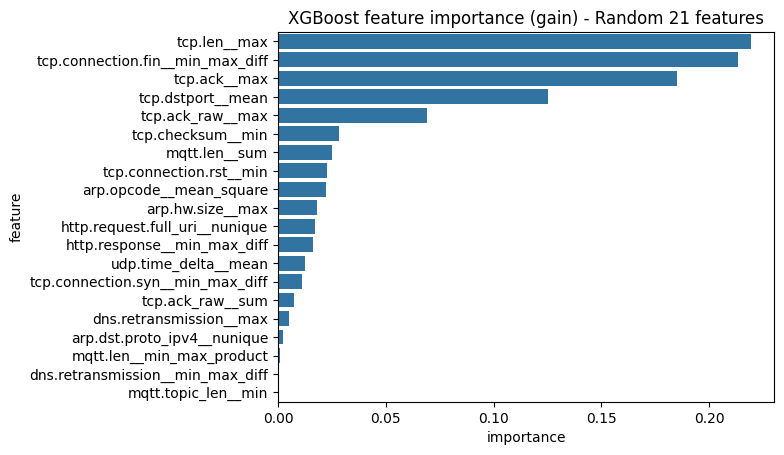

In [25]:
random_results = []
number_features = 21
for idx, features_seed in enumerate(range(0, 300, 10)):
    print(f'Round: {idx}')
    random_cols = X_train.sample(number_features, axis=1, random_state=features_seed).columns
    print('\tSelected features:', random_cols)
    df_results = train_xgboost(
        X_train.loc[:, random_cols], y_train, 
        X_valid.loc[:, random_cols], y_valid, 
        method_name='Random 21 features', 
        file_name='random-21.pkl'
    )
    random_results.append(df_results)

In [26]:
df_results = pd.concat(random_results, axis=0)
df_results

,model,accuracy,precision,recall,f1-score
0,Random 21 features,0.617183,0.724276,0.664297,0.566336
0,Random 21 features,0.601730,0.739637,0.672956,0.556619
0,Random 21 features,0.924111,0.879307,0.949675,0.903454
0,Random 21 features,0.957335,0.899204,0.958061,0.925323
0,Random 21 features,0.501576,0.668674,0.609307,0.491256
0,Random 21 features,0.885131,0.839110,0.904887,0.860198
0,Random 21 features,0.777753,0.709890,0.834211,0.736965
0,Random 21 features,0.544592,0.654744,0.621551,0.527523
0,Random 21 features,0.891045,0.845721,0.912366,0.867110
0,Random 21 features,0.823110,0.773300,0.856842,0.795754


In [27]:
df_results.drop(columns=['model']).describe()

,accuracy,precision,recall,f1-score
count,30.000000,30.000000,30.000000,30.000000
mean,0.780774,0.792086,0.821827,0.750649
std,0.154469,0.083434,0.128512,0.156950
min,0.501576,0.654744,0.609307,0.491256
25%,0.619153,0.729656,0.672953,0.574516
50%,0.828031,0.776856,0.864417,0.798194
75%,0.911714,0.845505,0.933141,0.877020
max,0.976788,0.949440,0.968300,0.956241


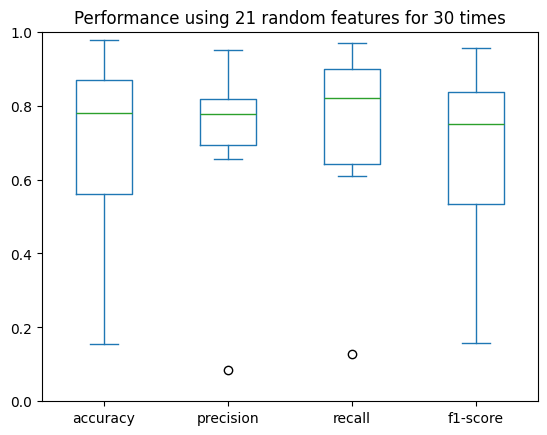

In [28]:
df_results.drop(columns=['model']).describe().iloc[1:].plot.box()
plt.title('Performance using 21 random features for 30 times')
plt.ylim((0, 1))
plt.show()

## Saving features

In [36]:
df_test.to_csv('./data/test_all.csv', index=False)
df_test.loc[:, mi_features].to_csv('./data/test_mi.csv', index=False)
df_test.loc[:, causal_selected_features].to_csv('./data/test_mb.csv', index=False)
df_test.loc[:, boruta_selected_features].to_csv('./data/test_boruta.csv', index=False)
df_test.loc[:, rfe_selected_features].to_csv('./data/test_rfe.csv', index=False)
df_test.loc[:, random_cols].to_csv('./data/test_random.csv', index=False)

## 9. Other experiments

### 9.1 Remove IP information

In [ ]:
ip_features = filter_module(X_train.columns, 'ip')
train_xgboost(X_train.drop(columns=ip_features), y_train, X_test.drop(columns=ip_features), y_test, method_name='All features without IP features', file_name='_.pkl')

In [ ]:
%%time
mi_features = fs_mutual_information(X_train.drop(columns=ip_features), y_train)
print(len(mi_features), mi_features)
train_xgboost(X_train.loc[:, mi_features], y_train, X_test.loc[:, mi_features], y_test, method_name='Mutual information without IP features', file_name='_.pkl')

In [ ]:
%%time
modules_without_ip = modules.copy()
modules_without_ip.remove('ip')

causal_selected_features = fs_causal_markov_blanket(X_train.drop(columns=ip_features), y_train, modules_without_ip, thresholds=[0.01, 0.001], val_size=0.1)
print(len(causal_selected_features), causal_selected_features)
train_xgboost(X_train.loc[:, causal_selected_features], y_train, X_test.loc[:, causal_selected_features], y_test, method_name='Causal MB without IP features', file_name='_.pkl')

In [ ]:
%%time
rfe_selected_features = fs_rfe(X_train.drop(columns=ip_features), y_train, n_features_to_select=16)
print(len(rfe_selected_features), rfe_selected_features)
train_xgboost(X_train.loc[:, rfe_selected_features], y_train, X_test.loc[:, rfe_selected_features], y_test, method_name='RFE 16 features without IP features', file_name='_.pkl')

In [ ]:
%%time
boruta_selected_features = fs_boruta(X_train.drop(columns=ip_features), y_train, max_iter=15, n_estimators=100)
print(len(boruta_selected_features), boruta_selected_features)
train_xgboost(X_train.loc[:, boruta_selected_features], y_train, X_test.loc[:, boruta_selected_features], y_test, method_name='Boruta without IP features', file_name='_.pkl')

### 9.2 Use only UDP or TCP features

In [ ]:
tcp_udp_features = filter_module(X_train.columns, 'tcp') + filter_module(X_train.columns, 'udp')
train_xgboost(X_train.loc[:, tcp_udp_features], y_train, X_test.loc[:, tcp_udp_features], y_test, method_name='With all TCP & UDP features', file_name='_.pkl')

In [ ]:
%%time
mi_features = fs_mutual_information(X_train.loc[:, tcp_udp_features], y_train)
print(len(mi_features), mi_features)
train_xgboost(X_train.loc[:, mi_features], y_train, X_test.loc[:, mi_features], y_test, method_name='Mutual information with TCP & UDP features', file_name='_.pkl')

In [ ]:
%%time
modules_tcp_udp = ['tcp', 'udp']

causal_selected_features = fs_causal_markov_blanket(X_train.loc[:, tcp_udp_features], y_train, modules_tcp_udp, thresholds=[0.01, 0.001], val_size=0.1)
print(len(causal_selected_features), causal_selected_features)
train_xgboost(X_train.loc[:, causal_selected_features], y_train, X_test.loc[:, causal_selected_features], y_test, method_name='Causal MB with TCP & UDP features', file_name='_.pkl')

In [ ]:
%%time
rfe_selected_features = fs_rfe(X_train.loc[:, tcp_udp_features], y_train, n_features_to_select=16)
print(len(rfe_selected_features), rfe_selected_features)
train_xgboost(X_train.loc[:, rfe_selected_features], y_train, X_test.loc[:, rfe_selected_features], y_test, method_name='RFE 16 features with TCP & UDP features', file_name='_.pkl')

In [ ]:
%%time
boruta_selected_features = fs_boruta(X_train.loc[:, tcp_udp_features], y_train, max_iter=15, n_estimators=100)
print(len(boruta_selected_features), boruta_selected_features)
train_xgboost(X_train.loc[:, boruta_selected_features], y_train, X_test.loc[:, boruta_selected_features], y_test, method_name='Boruta with TCP & UDP features', file_name='_.pkl')